In [1]:
import sys
sys.version_info

sys.version_info(major=3, minor=6, micro=8, releaselevel='final', serial=0)

In [2]:
import scanpy as sc

In [3]:
%config InlineBackend.figure_formats = ['retina']  # increase resolution on retina screens
import numpy as np
import scanpy as sc
import scipy as sci
import re
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.utils import shuffle
from scipy import stats
from sklearn.svm import NuSVR


results_file = './write/results/bulk_bulk_pbmc/'

/home/icb/hananeh.aliee/.local/lib/python3.6/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# Functions

In [4]:
import matplotlib.pyplot as plt_
def myPlot_2(orig, result1,result2,legend1, legend2,xlabel,ylabel,title,figDir):
    s1,i1,r1,p1,e1 = sci.stats.linregress(orig,result1)
    s2,i2,r2,p2,e2 = sci.stats.linregress(orig,result2)
    
    print(r1,p1,e1)
    print(r2,p2,e2)

    plt_.scatter(orig,result1, color = 'red', label = str(legend1), s= 25)
    plt_.scatter(orig,result2, color = 'blue', label = str(legend2), s= 25, marker = 'X')

    ymax1 = max(result1)
    ymin1= min(result1)
    
    ymax2 = max(result2)
    ymin2= min(result2)
    
    ymax = max([ymax1,ymax2])
    ymin = min([ymin1,ymin2])
    
    xmax = max(orig)
    xmin= min(orig)

    x = np.linspace(xmin,xmax, 1000)
    y = x
    plt_.plot(x, y , '-.k')

    plt_.xlim(xmin=xmin, xmax=xmax)
    plt_.ylim(ymin=ymin,ymax=ymax)
    #plt_.xlabel(xlabel)
    #plt_.ylabel(ylabel)
    plt_.title(title)
    plt_.legend()
    
    plt_.savefig(figDir, dpi=300)
    
    plt_.show()
    return r1,p1,e1,r2,p2,e2

In [5]:
def max(list_):
    if len(list_)>0:
        m = float(list_[0])
        for x in list_:
            if float(x)>m:
                m = x
        return m

In [6]:
def normalize_proportions(data,copy):
    if copy==True:
        data_copy = data.copy()
    else:
        data_copy = data
    data_copy[data_copy < 0] = 0
    #print(data_copy)
    for raw in data_copy.index:
        sum = data_copy.loc[raw].sum()
        data_copy.loc[raw] = np.divide(data_copy.loc[raw],sum)
    return data_copy

# Read Control Bulks

In [7]:
bulks_dir = './pbmc/cell19/rnaseq/'
data = pd.read_csv(bulks_dir+'GSE107011_Processed_data_TPM.txt', index_col=0, delimiter = '\t')

ERCC_data = data.loc[[x for x in data.index if 'ERCC-' in x]]

data = data.loc[[x for x in data.index if 'ERCC-' not in x]]
index = [x.split(".")[0] for x in data.index]
data.index = index

duplicatedData = data[data.index.duplicated()]
data = data[data.index.duplicated()==False]
data.shape

samples = data.loc[:,[x for x in data.columns if '_PBMC' in x]]
sorted_bulks_raw = data.loc[:,[x for x in data.columns if '_PBMC' not in x]]
cellTypes_29 = [x[5:] for x in sorted_bulks_raw.columns if '9JD4' in x]
sorted_bulks_raw.columns = [x[5:] for x in sorted_bulks_raw.columns]

In [8]:
signatures_cell19 = pd.read_csv(bulks_dir+'sigRNA.txt', index_col=0, delimiter = '\t')
signatures_cell19.shape

(1296, 17)

In [9]:
sorted_bulks = pd.DataFrame(index=sorted_bulks_raw.index, columns = cellTypes_29)
for col in cellTypes_29:
    sorted_bulks.loc[:,col] = np.mean(sorted_bulks_raw.loc[:,col],axis=1)
print(sorted_bulks.shape)
print(sorted_bulks.columns)

(58174, 29)
Index(['CD8_naive', 'CD8_CM', 'CD8_EM', 'CD8_TE', 'MAIT', 'VD2+', 'VD2-',
       'TFH', 'Treg', 'Th1', 'Th1/Th17', 'Th17', 'Th2', 'CD4_naive', 'CD4_TE',
       'Progenitor', 'B_naive', 'B_NSM', 'B_Ex', 'B_SM', 'Plasmablasts',
       'C_mono', 'I_mono', 'NC_mono', 'NK', 'pDC', 'mDC', 'Neutrophils',
       'Basophils'],
      dtype='object')


In [10]:
sorted_bulks_paper = pd.read_csv(bulks_dir+'wholeGenes/ABIS_RNASeq_full.txt', index_col=0, delimiter = '\t')
sorted_bulks_paper.shape

(17487, 17)

In [11]:
signatures_cell19.columns

Index(['Monocytes C', 'NK', 'T CD8 Memory', 'T CD4 Naive', 'T CD8 Naive',
       'B Naive', 'T CD4 Memory', 'MAIT', 'T gd Vd2', 'Neutrophils LD',
       'T gd non-Vd2', 'Basophils LD', 'Monocytes NC+I', 'B Memory', 'mDCs',
       'pDCs', 'Plasmablasts'],
      dtype='object')

In [12]:
annotations = pd.read_csv(bulks_dir+'annotations.txt', index_col=0, delimiter = '\t')

In [13]:
samples = samples.loc[[x for x in samples.index if 'ERCC-' not in x]]
index = [x.split(".")[0] for x in samples.index]
samples.index = index

duplicatedSamples = samples[samples.index.duplicated()]
samples = samples[samples.index.duplicated()==False]
samples.shape

(58174, 13)

In [14]:
sorted_bulks_proc = sorted_bulks.loc[annotations.index].copy()
sorted_bulks_raw_proc = sorted_bulks_raw.loc[annotations.index].copy()
samples_proc = samples.loc[annotations.index].copy()

samples_proc.index = annotations.loc[:,'Gene Symbol']
#sorted_bulks_selection_proc.index = annotations.loc[:,'Gene Symbol']
sorted_bulks_raw_proc.index = annotations.loc[:,'Gene Symbol']

In [15]:
sorted_bulks_proc.index = annotations.loc[:,'Gene Symbol']
sorted_bulks_proc = sorted_bulks_proc[~sorted_bulks_proc.index.duplicated()]


In [16]:
print(sorted_bulks_raw_proc.shape)
sorted_bulks_raw_proc = sorted_bulks_raw_proc[~sorted_bulks_raw_proc.index.duplicated()]
print(sorted_bulks_raw_proc.shape)
samples_proc = samples_proc[~samples_proc.index.duplicated()]

sorted_bulks_paper = sorted_bulks_paper[~sorted_bulks_paper.index.duplicated()]


(58174, 114)
(56470, 114)


In [17]:
shareds = sorted_bulks_paper.index.intersection(sorted_bulks_raw_proc.index)
sorted_bulks_raw_proc = sorted_bulks_raw_proc.loc[shareds,:]
samples_proc = samples_proc.loc[shareds,:]

In [18]:
sorted_bulks_proc = sorted_bulks_proc.loc[shareds,:]

In [23]:
fractions_raw = pd.read_csv(bulks_dir+'wholeGenes/fractions.txt', index_col=0, delimiter = '\t')
cellsToRemove = ['B NSM','B SM', 'B Ex','Tregs','Tfh', 'Th1', 'Th1/Th17', 'Th17','Th2', 'T CD4 TE','T CD8 EM','T CD8 CM', 'T CD8 TE','Monocytes I', 'Monocytes NC']
fractions = fractions_raw.drop(cellsToRemove,axis=1)
fractions['B Memory'] = fractions_raw.loc[:,['B NSM','B SM', 'B Ex']].sum(axis=1)
fractions['T CD4 Memory'] = fractions_raw.loc[:,['Tregs','Tfh', 'Th1', 'Th1/Th17', 'Th17','Th2', 'T CD4 TE']].sum(axis=1)
fractions['T CD8 Memory'] = fractions_raw.loc[:,['T CD8 EM','T CD8 CM', 'T CD8 TE']].sum(axis=1)
fractions['Monocytes NC+I'] = fractions_raw.loc[:,['Monocytes I', 'Monocytes NC']].sum(axis=1)
fractions[signatures_cell19.columns].columns

Index(['Monocytes C', 'NK', 'T CD8 Memory', 'T CD4 Naive', 'T CD8 Naive',
       'B Naive', 'T CD4 Memory', 'MAIT', 'T gd Vd2', 'Neutrophils LD',
       'T gd non-Vd2', 'Basophils LD', 'Monocytes NC+I', 'B Memory', 'mDCs',
       'pDCs', 'Plasmablasts'],
      dtype='object')

In [25]:
sc.set_figure_params(dpi=100, dpi_save=300, vector_friendly=True)
params = {'legend.fontsize': 8,
          'figure.figsize': (3, 3),
         'axes.labelsize':8,
         'axes.titlesize':8,
         'xtick.labelsize':8,
         'ytick.labelsize':8}
mpl.rcParams.update(params)

# Condition-based t-test (similar to Cibersort). This was used for the first revision

In [26]:
bulks_proc = sc.AnnData(sorted_bulks_raw_proc.T)
bulks_proc.obs['cells'] = sorted_bulks_raw.columns.values
bulks_proc.var_names_make_unique()
bulks_proc.obs_names_make_unique()
sc.pp.normalize_per_cell(bulks_proc, counts_per_cell_after=1e4,)
sc.pp.log1p(bulks_proc)
sc.pp.highly_variable_genes(bulks_proc, flavor='seurat', n_top_genes=4000 , n_bins=5)

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [27]:
bulks_proc_hv = bulks_proc[:,bulks_proc.var['highly_variable']==True].copy()

/home/icb/hananeh.aliee/.local/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/home/icb/hananeh.aliee/.local/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/home/icb/hananeh.aliee/.local/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/home/icb/hananeh.aliee/.local/lib/python3.6/site-packages/scanpy/tools/_rank_genes_groups.py:201: RuntimeWarning: invalid value encountered in sqrt
  mean1=mean_group, std1=np.sqrt(var_group), nobs1=ns_group,


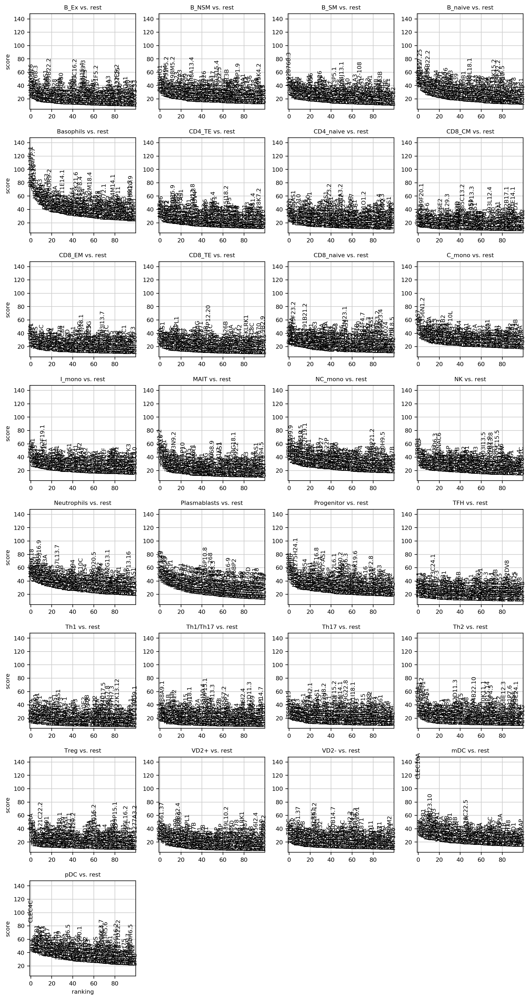

In [28]:
bulks_proc.obs['cells'] = bulks_proc.obs['cells'].astype('category')
sc.tl.rank_genes_groups(bulks_proc, 'cells', method='t-test', corr_method='benjamini-hochberg',n_genes=300)
sc.pl.rank_genes_groups(bulks_proc, n_genes=100)

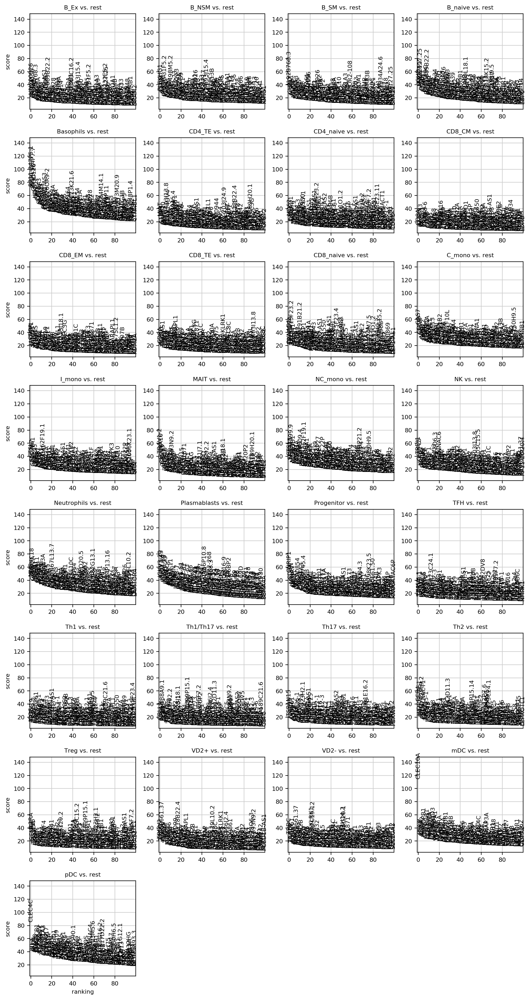

In [29]:
bulks_proc_hv.obs['cells'] = bulks_proc_hv.obs['cells'].astype('category')
sc.tl.rank_genes_groups(bulks_proc_hv, 'cells', method='t-test', corr_method='benjamini-hochberg',n_genes=300)
sc.pl.rank_genes_groups(bulks_proc_hv, n_genes=100)

In [36]:
from numpy import linalg as LA
mg = pd.DataFrame(0, index=bulks_proc.var_names, columns=list(set(bulks_proc.obs['cells'])))
mgList = pd.DataFrame(columns=list(set(bulks_proc.obs['cells'])))
mgSet = set()
for i in range(0,len(list(set(bulks_proc.obs['cells'])))):
    cluster = bulks_proc.uns['rank_genes_groups']['names'].dtype.names[i]
    markers = [j[i] for j in bulks_proc.uns['rank_genes_groups']['names']][:200]
    ordered = np.argsort([j[i] for j in bulks_proc.uns['rank_genes_groups']['logfoldchanges']][:200])[::-1]
    mgList[cluster] = [markers[i] for i in ordered]
mgSet_kappa = set()
cibersort = 0
min_cond = 100000
for cibersort in range(50,80):
    mgSet = set()
    for i in range(0,len(list(set(bulks_proc.obs['cells'])))):
        cluster = bulks_proc.uns['rank_genes_groups']['names'].dtype.names[i]
        mgSet.update(mgList[cluster][:cibersort])
    new_cond = LA.cond(sorted_bulks_paper.loc[list(mgSet),:].T, p=2)
    if new_cond < min_cond:
        min_cond = new_cond
        print(new_cond,cibersort)
        mgSet_kappa = mgSet

1600.1308656215538 50
1599.8272316911439 51
1577.6460024784926 52
1576.3320350060885 53
1569.037257931723 54
1568.7885426062433 55
1568.6468620737571 56
1566.625479644523 57
1565.3334895507098 58
1563.9900157703082 59
1563.874093524106 60
1563.2008824127008 61
1559.7368387548047 62
1559.6436543648028 63
1556.3563274603564 64
1554.183639924375 65
1552.2841380427442 66
1549.396733383146 67
1548.8703227279145 68
1479.9206358417907 69
1477.9280119186176 70
1476.2470495495131 71
1475.5050719426388 72
1466.6031970772644 73
1463.553889319626 74
1458.9405096753108 75
1457.5471931945528 76
1455.7738366267863 77
1449.9882453415505 78
1448.615144701725 79


In [37]:
len(mgSet_kappa)

1297

In [38]:
from numpy import linalg as LA
mg = pd.DataFrame(0, index=bulks_proc.var_names, columns=list(set(bulks_proc.obs['cells'])))
mgList = pd.DataFrame(columns=list(set(bulks_proc.obs['cells'])))
mgSet = set()
for i in range(0,len(list(set(bulks_proc.obs['cells'])))):
    cluster = bulks_proc.uns['rank_genes_groups']['names'].dtype.names[i]
    markers = [j[i] for j in bulks_proc.uns['rank_genes_groups']['names']][:24]
    mgSet.update(markers)
print(len(mgSet))

556


In [42]:
signatures_markers = sorted_bulks_paper.loc[list(mgSet),:]

# Correlation and Distance Study

In [40]:
bulks_proc_hv

AnnData object with n_obs × n_vars = 114 × 4000 
    obs: 'cells', 'n_counts'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'rank_genes_groups'

In [41]:
sorted_bulks_paper_hv = sorted_bulks_paper.loc[bulks_proc_hv.var_names,:]

In [43]:
sorted_bulks_paper_hv = sorted_bulks_paper_hv.loc[:,['T CD4 Naive','T CD4 Memory','T CD8 Memory','T CD8 Naive','MAIT','T gd Vd2','T gd non-Vd2'
, 'NK','B Memory','B Naive','pDCs','mDCs', 'Monocytes C','Monocytes NC+I', 'Neutrophils LD','Basophils LD','Plasmablasts']]

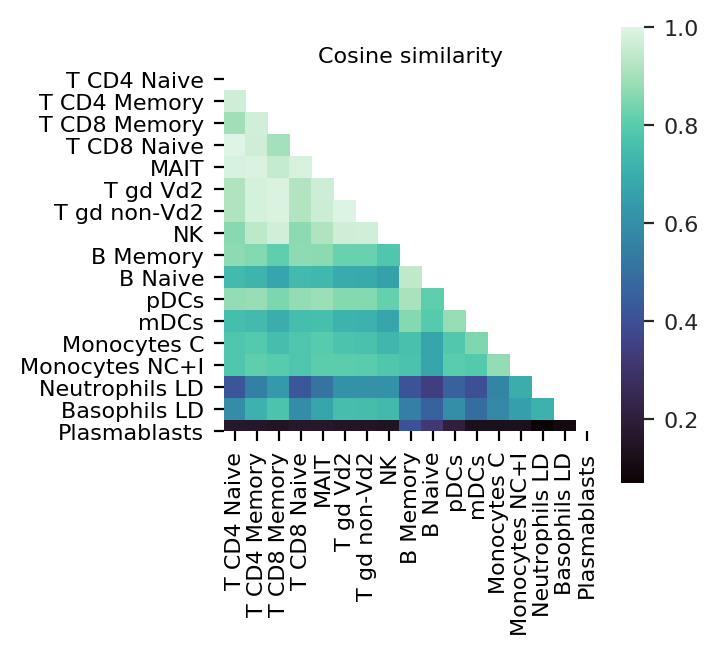

In [44]:
ax = plt.axes()
ax.set_title('Cosine similarity')
corr_hv = pd.DataFrame(data = np.corrcoef(sorted_bulks_paper_hv.T), columns = sorted_bulks_paper_hv.columns, index = sorted_bulks_paper_hv.columns)
mask = np.zeros_like(corr_hv)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    sns_plot = sns.heatmap(corr_hv, 
            xticklabels=corr_hv.columns,mask=mask,cmap=sns.color_palette("mako", 1000),square=True)
sns_plot.figure.savefig(results_file+"corr_4k_hv.png",dpi=300, bbox_inches='tight')

In [45]:
signatures_cell19 = signatures_cell19.loc[:,['T CD4 Naive','T CD4 Memory','T CD8 Memory','T CD8 Naive','MAIT','T gd Vd2','T gd non-Vd2'
, 'NK','B Memory','B Naive','pDCs','mDCs', 'Monocytes C','Monocytes NC+I', 'Neutrophils LD','Basophils LD','Plasmablasts']]

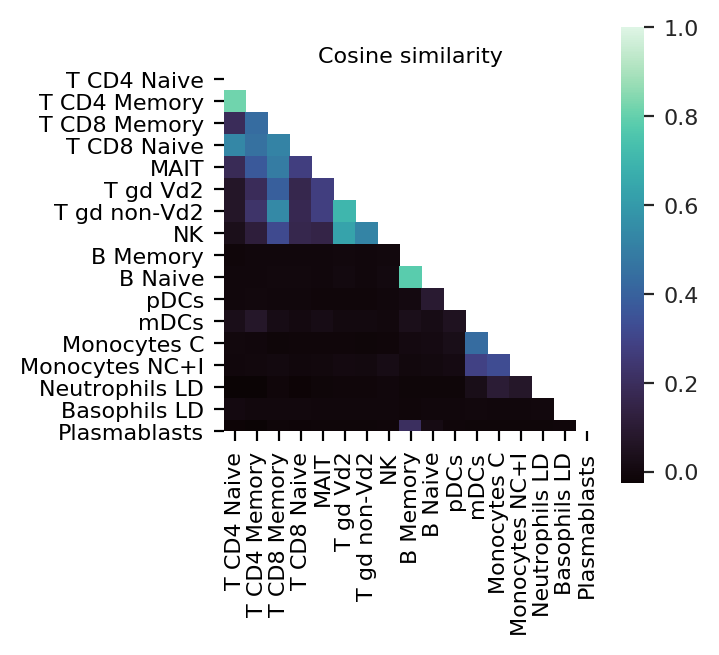

In [46]:
ax = plt.axes()
ax.set_title('Cosine similarity')
corr_sig = pd.DataFrame(data = np.corrcoef(signatures_cell19.T), columns = signatures_cell19.columns, index = signatures_cell19.columns)
mask = np.zeros_like(corr_sig)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    sns_plot = sns.heatmap(corr_sig, 
            xticklabels=corr_sig.columns,mask=mask,cmap=sns.color_palette("mako", 1000),square=True)
sns_plot.figure.savefig(results_file+"corr_4k_cell19.png",dpi=300, bbox_inches='tight')

In [56]:
signatures_cibersort = sorted_bulks_paper.loc[list(mgSet_kappa),:]

In [57]:
signatures_cibersort.shape

(1297, 17)

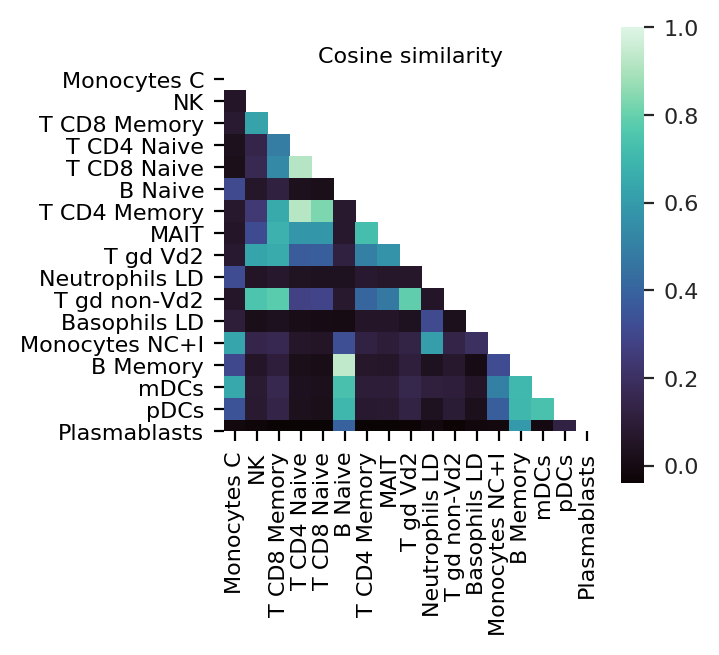

In [58]:
ax = plt.axes()
ax.set_title('Cosine similarity')
corr_sig = pd.DataFrame(data = np.corrcoef(signatures_cibersort.T), columns = signatures_cibersort.columns, index = signatures_cibersort.columns)
mask = np.zeros_like(corr_sig)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    sns_plot = sns.heatmap(corr_sig.astype(float), 
            xticklabels=corr_sig.columns,mask=mask,cmap=sns.color_palette("mako", 1000),square=True)


sns_plot.figure.savefig(results_file+"corr_4k_cibersort.png",dpi=300, bbox_inches='tight')

In [59]:
distance_hv = pd.DataFrame(index = sorted_bulks_paper_hv.columns, columns= sorted_bulks_paper_hv.columns)
for cluster in sorted_bulks_paper_hv.columns:
    for c in sorted_bulks_paper_hv.columns:
        distance_hv.loc[cluster,c] = sci.spatial.distance.euclidean(sorted_bulks_paper_hv.loc[:,c], sorted_bulks_paper_hv.loc[:,cluster])

In [60]:
distance_hv = distance_hv.astype(float)

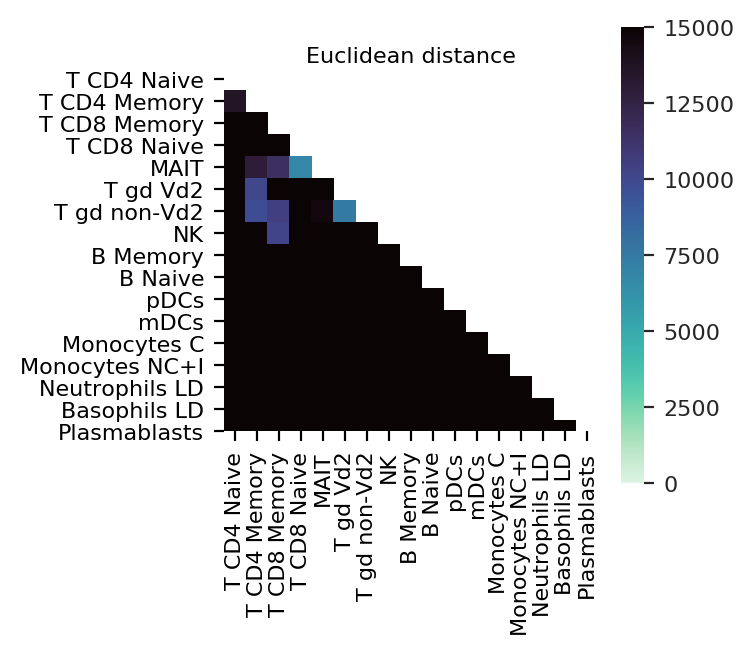

In [61]:
ax = plt.axes()
ax.set_title('Euclidean distance')
mask = np.zeros_like(distance_hv)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    sns_plot = sns.heatmap(distance_hv,
            xticklabels=distance_hv.index,
            yticklabels=distance_hv.index,mask=mask,cmap=sns.color_palette("mako_r", 1000), vmax=15000,square=True)

sns_plot.figure.savefig(results_file+"dist_4k_hv.png",dpi=300, bbox_inches='tight')

In [62]:
distance_sig = pd.DataFrame(index = signatures_cell19.columns, columns= signatures_cell19.columns)
for cluster in signatures_cell19.columns:
    for c in signatures_cell19.columns:
        distance_sig.loc[cluster,c] = sci.spatial.distance.euclidean(signatures_cell19.loc[:,c], signatures_cell19.loc[:,cluster])

In [63]:
distance_sig = distance_sig.astype(float)

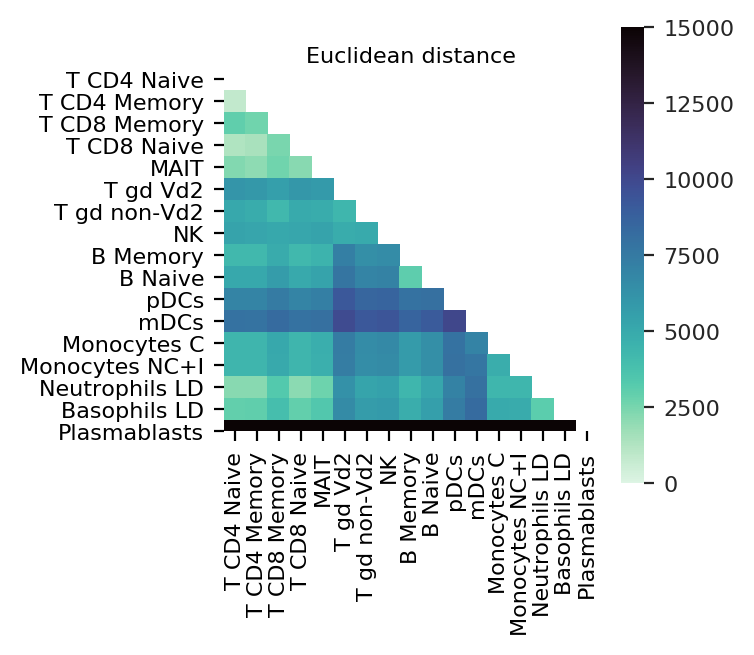

In [64]:
ax = plt.axes()
ax.set_title('Euclidean distance')
mask = np.zeros_like(distance_sig)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    sns_plot = sns.heatmap(distance_sig,
            xticklabels=distance_sig.index,
            yticklabels=distance_sig.index,mask=mask,cmap=sns.color_palette("mako_r", 1000), vmax=15000,square=True)

sns_plot.figure.savefig(results_file+"dist_4k_cell19.png",dpi=300, bbox_inches='tight')

In [65]:
distance_cibersort = pd.DataFrame(index = signatures_cibersort.columns, columns= signatures_cibersort.columns)
for cluster in signatures_cibersort.columns:
    for c in signatures_cibersort.columns:
        distance_cibersort.loc[cluster,c] = sci.spatial.distance.euclidean(signatures_cibersort.loc[:,c], signatures_cibersort.loc[:,cluster]) 
distance_cibersort = distance_cibersort.astype(float)    

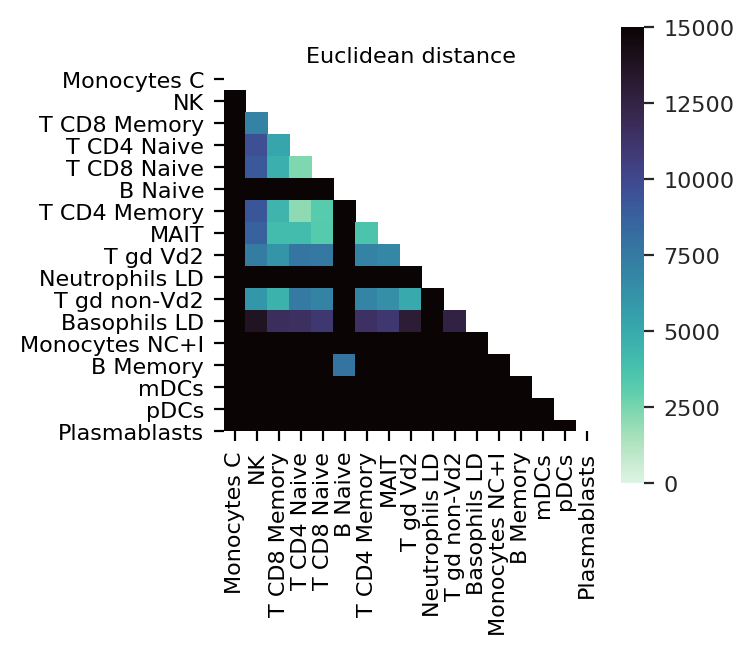

In [66]:
ax = plt.axes()
ax.set_title('Euclidean distance')
mask = np.zeros_like(distance_cibersort)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    sns_plot = sns.heatmap(distance_cibersort,
            xticklabels=distance_cibersort.index,
            yticklabels=distance_cibersort.index,mask=mask,cmap=sns.color_palette("mako_r", 1000), vmax=15000,square=True)

sns_plot.figure.savefig(results_file+"dist_4k_cibersort.png",dpi=300, bbox_inches='tight')

# GA calling

In [69]:
import numpy as np
import deap
from deap import algorithms, base, tools, creator
import imp
#import cachetools 
from cachetools import LRUCache
import math
from scipy.spatial import distance
import random

# used to control the size of the cache so that it doesn't exceed system memory
MAX_MEM_BYTES = 11E9


class GeneticDetMinimizer(object):

    def __init__(self, N=30, popsize=500, cachesize=None, seed=0, centroid_sc = 0,ngen=1000, nfeatures = 100):

        # an 'individual' consists of an (N^2,) flat numpy array of 0s and 1s
        self.N = N
        self.indiv_size = N * 1
        self.centroid_sc = centroid_sc 
        self._ncrx = 0
        self.ngen = ngen
        self.nfeatures = nfeatures
        
        if cachesize is None:
            cachesize = int(np.ceil(8 * MAX_MEM_BYTES / self.indiv_size))

        random.seed(seed)
        self._gen = np.random.RandomState(seed)

        # we want the creator module to be local to this instance, since
        # creator.create() directly adds new classes to the module's globals()
        # (yuck!)
        cr = imp.load_module('cr', *imp.find_module('creator', deap.__path__))
        self._cr = cr

        self._cr.create("Fitness", base.Fitness, weights=(-1.0,1.0))
        self._cr.create("Individual", list, fitness=self._cr.Fitness)

        self._tb = base.Toolbox()
        self._tb.register("attr_bool", self.random_bool)
        self._tb.register("individual", self.individual, self._cr.Individual,
                          self._tb.attr_bool, self.indiv_size)

        # the 'population' consists of a list of such individuals
        self._tb.register("population", tools.initRepeat, list, self._tb.individual)
        self._tb.register("evaluate", self.fitness)
        self._tb.register("mate", self.crossover)
        self._tb.register("mutate", self.mutate)
        self._tb.register("select", tools.selNSGA2) # tools.selTournament, tournsize=3)

        # create an initial population, and initialize a hall-of-fame to store
        # the best individual
        self.pop = self._tb.population(n=popsize)
        self.hof = tools.ParetoFront()#HallOfFame(1, similar=np.array_equal)

        # print summary statistics for the population on each iteration
        self.stats = tools.Statistics(lambda ind: ind.fitness.values)
        self.stats.register("avg", np.mean, axis=0)
        self.stats.register("std", np.std, axis=0)
        self.stats.register("min", np.min, axis=0)
        self.stats.register("max", np.max, axis=0)

        # keep track of configurations that have already been visited
        self.tabu = LRUCache(cachesize)

    def individual(self, *args):
        indv = [0] * self.indiv_size
        for i in range(self.nfeatures):
            indx = random.randint(0, self.indiv_size-1)
            while indv[indx] == 1:
                indx = random.randint(0, self.indiv_size-1)
            indv[indx] = 1
        return args[0](indv)
    
    def random_bool(self, *args):
        return self._gen.rand(*args) < 0.2

    def fitness(self, individual):
        """
        assigns a fitness value to each individual, based on the determinant
        """
        array_individual = np.array(individual)
        h = np.packbits(array_individual.astype(np.uint8)).tostring()
        # look up the fitness for this configuration if it has already been
        # encountered
        if h not in self.tabu:
            interCorr = 0 
            intraCorr = 0
            distance_ = 0 
            centroid = pd.DataFrame()
            centroid = self.centroid_sc[array_individual!=0] 
            corr = pd.DataFrame(data = np.corrcoef(centroid.T), columns = centroid.columns, index = centroid.columns)
            if corr.isnull().values.any():
                interCorr = 1000
                intraCorr = centroid.columns.size
                distance_ = 0
            else:
                for x in centroid.columns:
                    for y in centroid.columns:
                        if (x!=y):
                           distance_ = distance_ + distance.euclidean(centroid[x],centroid[y])
                distance_ = distance_/centroid.index.size
                for x in corr.index:
                    for y in corr.columns:
                        if (x!=y):
                           interCorr = interCorr + abs(corr.loc[x,y])
                        else:
                           intraCorr = intraCorr + corr.loc[x,y]
            
            objs = []
            objs.append(interCorr)
            objs.append(distance_)
            #objs.append(intraCorr)
            self.tabu.update({h: objs})
        else:
            interCorr = self.tabu[h][0]
            distance_ = self.tabu[h][1]
            #intraCorr = self.tabu[h][2]
        return interCorr, distance_

    def crossover(self, ind1, ind2):
        """
        randomly swaps a block of rows or columns between two individuals
        """
        ors = ind1
        for x in range(0,len(ind1)):
            ors[x] = ind1[x] or ind2[x]
        indexes = [index for index in range(len(ors)) if ors[index] == 1]

        for i in indexes[:self.nfeatures]:
            ind1[i] = 1
        for i in range(len(ind1)):
            if i not in indexes[:self.nfeatures]:
                ind1[i]=0
        for i in indexes[-self.nfeatures:]:
            ind2[i] = 1
        for i in range(len(ind2)):
            if i not in indexes[-self.nfeatures:]:
                ind2[i] = 0
        #print(ind1)
        ind1_l = len([index for index in range(len(ind1)) if ind1[index] == 1])
        ind2_l = len([index for index in range(len(ind2)) if ind2[index] == 1])
        assert(ind1_l==self.nfeatures)
        assert(ind2_l==self.nfeatures)
        return ind1, ind2
    
    
    def mutate(self, ind, rate=1E-3):
        """
        mutate an individual by bit-flipping one or more randomly chosen
        elements
        """
        array_ind = np.array(ind)
        # ensure that each mutation always introduces a novel configuration
        while np.packbits(array_ind.astype(np.uint8)).tostring() in self.tabu:
            n_flip = self._gen.binomial(self.indiv_size, rate)
            n_flip = int(n_flip/2)*2 #make it even
            if not n_flip:
                continue
            
            idxs_1 = [index for index in range(len(ind)) if ind[index] == 1]
            idxs_0 = [index for index in range(len(ind)) if ind[index] == 0]
            
            flip_1_idxs = self._gen.random_integers(0, len(idxs_1) - 1, int(n_flip/2))
            while len(np.unique(flip_1_idxs)) < int(n_flip/2):
                flip_1_idxs = self._gen.random_integers(0, len(idxs_1) - 1, int(n_flip/2))
            
            flip_0_idxs = self._gen.random_integers(0, len(idxs_0) - 1, int(n_flip/2))
            while len(np.unique(flip_0_idxs)) < int(n_flip/2):
                flip_0_idxs = self._gen.random_integers(0, len(idxs_1) - 1, int(n_flip/2))
            
            assert(len(flip_1_idxs)==len(flip_0_idxs))
            
            for idx in flip_1_idxs:
                ind[idxs_1[idx]] = 0
            for idx in flip_0_idxs:
                ind[idxs_0[idx]] = 1
            assert(len([index for index in range(len(ind)) if ind[index] == 1])==self.nfeatures)
            array_ind = np.array(ind)
        return ind,
    
    

    def run(self, ngen=int(1E3), mutation_rate=0.3, crossover_rate=0.7, nLAMBDA = 100, nMU = 50):

        pop, log = algorithms.eaMuPlusLambda(self.pop, self._tb,
                                       mu = nMU, 
                                       lambda_ = nLAMBDA,
                                       cxpb=crossover_rate,
                                       mutpb=mutation_rate,
                                       ngen=ngen,
                                       stats=self.stats,
                                       halloffame=self.hof)
        self.log = log

        return self.hof, self.log, self.stats#self.hof[0].reshape(self.N, 1), log

In [70]:
if __name__ == "__main__":
    np.random.seed(0)
    popS  = 100
    ngen=5000 #int(2000)
    gd = GeneticDetMinimizer(N=sorted_bulks_paper_hv.index.size, popsize=popS, cachesize=None, 
                             seed=0, ngen = ngen, centroid_sc=sorted_bulks_paper_hv, nfeatures = 500)
    hof, log, stats = gd.run(ngen=ngen, mutation_rate=0.3, crossover_rate=0.7, nLAMBDA = popS, nMU = 50)

gen	nevals	avg                            	std                            	min                            	max                            
0  	100   	[  128.87139762 34152.90195486]	[   71.53725614 13645.29495337]	[   49.84696639 10143.30134669]	[  241.04007292 66253.94787365]


/home/icb/hananeh.aliee/.local/lib/python3.6/site-packages/ipykernel_launcher.py:167: DeprecationWarning: This function is deprecated. Please call randint(0, 499 + 1) instead
/home/icb/hananeh.aliee/.local/lib/python3.6/site-packages/ipykernel_launcher.py:171: DeprecationWarning: This function is deprecated. Please call randint(0, 3499 + 1) instead
/home/icb/hananeh.aliee/.local/lib/python3.6/site-packages/ipykernel_launcher.py:169: DeprecationWarning: This function is deprecated. Please call randint(0, 499 + 1) instead


1  	100   	[   73.85574974 42697.55037103]	[   31.83943507 15478.988962  ]	[  49.84696639 9798.87338069]  	[  214.73898459 66253.94787365]
2  	100   	[   72.24441189 46695.91256998]	[   38.33838036 13583.77068266]	[   49.81746338 17507.5057052 ]	[  214.73898459 66253.94787365]
3  	100   	[   64.72561507 46391.01056293]	[   31.78252224 13910.30209436]	[   49.81746338 18237.49835381]	[  214.73654407 66365.80834166]
4  	100   	[   56.60574434 46076.59642193]	[5.13233315e+00 1.32630093e+04]	[   49.81746338 18236.29911806]	[   71.22080618 66365.80834166]
5  	100   	[   56.22298407 47531.94433556]	[5.28648116e+00 1.24228996e+04]	[   49.81746338 18236.90952559]	[   71.22080618 66365.80834166]
6  	100   	[   54.26222395 47083.81408185]	[3.18716083e+00 1.03476030e+04]	[   49.81746338 18238.03903497]	[   71.22221042 66365.80834166]
7  	100   	[   53.72064679 47225.24024782]	[1.60232794e+00 1.01600519e+04]	[   49.81746338 18234.8248337 ]	[5.69140925e+01 6.63667165e+04]
8  	100   	[   53.45654422 

/home/icb/hananeh.aliee/.local/lib/python3.6/site-packages/ipykernel_launcher.py:173: DeprecationWarning: This function is deprecated. Please call randint(0, 499 + 1) instead


16 	100   	[   52.41813736 50411.84375564]	[3.67511757e+00 9.42219588e+03]	[   49.31713255 43040.30975405]	[6.30867936e+01 6.69531266e+04]
17 	100   	[   56.40460132 53045.22175331]	[  21.40077483 9984.63122992]  	[   48.9404117  43040.59602936]	[  203.15975276 72577.37695428]
18 	100   	[5.86274324e+01 5.86425508e+04]	[   21.37940453 10084.21307679]	[   48.91991715 43244.18431694]	[  203.15975276 72577.37695428]
19 	100   	[   64.07669525 58567.71982271]	[   35.51361519 10401.19494167]	[   48.91991715 43244.10874663]	[  204.15124091 72926.92138307]
20 	100   	[   71.80505384 58339.83444251]	[   48.5690737  10646.19355305]	[   48.91991715 43244.10874663]	[  204.15046955 72935.87102467]
21 	100   	[   70.28665463 57237.26108453]	[   48.58087575 10786.26411214]	[   48.8746552 44423.982285 ]  	[  201.51171078 72946.25376892]
22 	100   	[   72.67884963 58257.62775933]	[   51.97039026 10829.47071829]	[   48.86147018 44423.982285  ]	[  201.43124497 72946.75516991]
23 	100   	[   72.99550456 

75 	100   	[5.86466000e+01 6.33755714e+04]	[   38.2053722  10382.14492463]	[4.22273257e+01 5.04617565e+04]	[  189.96382589 77941.92126297]
76 	100   	[5.86773848e+01 6.40748084e+04]	[   38.20188034 10392.87416801]	[4.22273257e+01 5.04617565e+04]	[  189.96382589 77941.92126297]
77 	100   	[5.85554243e+01 6.50351457e+04]	[   38.24702139 10362.1820123 ]	[4.22273257e+01 5.04617565e+04]	[  189.96382589 77941.92126297]
78 	100   	[5.57787458e+01 6.49098121e+04]	[   33.5508006  10246.71136656]	[4.22273257e+01 5.04617565e+04]	[  189.96382589 77941.92126297]
79 	100   	[6.4859927e+01 6.8328757e+04]  	[  45.91574087 9608.21605902]  	[4.22273257e+01 5.04617565e+04]	[  189.96416271 77943.24714452]
80 	100   	[5.89070475e+01 6.75641983e+04]	[  38.36135375 9848.87685302]  	[4.22273257e+01 4.69760457e+04]	[  189.96190847 77943.24714452]
81 	100   	[5.93200399e+01 6.88561808e+04]	[  38.22777682 9045.59820887]  	[4.22273257e+01 4.69800670e+04]	[  189.96190847 77943.24714452]
82 	100   	[6.45250934e+01 

134	100   	[4.84797274e+01 6.60683207e+04]	[   27.68483026 11498.5057366 ]	[3.77237972e+01 4.81992010e+04]	[  182.50541809 79377.54293526]
135	100   	[4.87489518e+01 6.73386815e+04]	[   27.62674968 11262.6592029 ]	[3.7714603e+01 4.8199366e+04]  	[  182.50541809 79377.54293526]
136	100   	[4.85546821e+01 6.67337525e+04]	[   27.63052252 11381.50900433]	[3.75847350e+01 4.82069166e+04]	[  182.5046496  79377.54293526]
137	100   	[4.86795079e+01 6.65067485e+04]	[   27.65424267 11761.32445424]	[3.75847350e+01 4.82069166e+04]	[  182.5046496  79377.54293526]
138	100   	[4.85311283e+01 6.63288860e+04]	[   27.6739948  11553.90355148]	[3.75098816e+01 4.82075839e+04]	[  182.49533187 79377.86079356]
139	100   	[4.85554310e+01 6.65590895e+04]	[   27.67041588 11594.00862707]	[3.74292868e+01 4.82361223e+04]	[  182.48788383 79378.17304744]
140	100   	[4.85698879e+01 6.76299384e+04]	[   27.67358758 10962.36225669]	[3.74007595e+01 4.81768259e+04]	[  182.48718694 79378.17304744]
141	100   	[4.56458789e+01 

193	100   	[5.74806168e+01 7.31103290e+04]	[  43.87653006 8375.2150411 ]  	[3.62209368e+01 5.02448127e+04]	[  204.95069083 85953.30623098]
194	100   	[5.52698148e+01 7.45513158e+04]	[  39.81795909 6028.76527612]  	[3.62209368e+01 5.02448127e+04]	[  204.95069083 85953.30623098]
195	100   	[5.50075336e+01 7.44269132e+04]	[  39.8899477  6019.58285765]  	[3.62209368e+01 5.02448127e+04]	[  204.95069083 85953.30623098]
196	100   	[5.47456414e+01 7.43521056e+04]	[  39.94754402 5991.44692806]  	[3.62209368e+01 5.02448127e+04]	[  204.95069083 85953.30623098]
197	100   	[5.75182745e+01 7.43671075e+04]	[  43.85286065 6090.57488238]  	[3.62209368e+01 5.02448127e+04]	[  204.95069083 85953.30623098]
198	100   	[6.37620330e+01 7.46754438e+04]	[  51.23336106 6891.61873692]  	[3.62209368e+01 5.02448127e+04]	[  204.95069083 85953.30623098]
199	100   	[6.88754621e+01 7.44272626e+04]	[  57.35775265 7156.01110003]  	[3.62064739e+01 5.02448127e+04]	[  204.95069083 85963.21969545]
200	100   	[7.09861074e+01 

252	100   	[4.83713207e+01 7.51082493e+04]	[  35.28924971 4031.47097056]  	[3.47360283e+01 6.49190430e+04]	[  204.22098991 86016.58486797]
253	100   	[4.82381663e+01 7.50284864e+04]	[  35.32252156 4024.44741465]  	[3.47360283e+01 6.49190430e+04]	[  204.22098991 86016.58486797]
254	100   	[4.84583972e+01 7.50069225e+04]	[  35.31234897 4480.25576188]  	[3.47344324e+01 6.49188678e+04]	[  204.22098991 86016.58486797]
255	100   	[4.84941171e+01 7.49900503e+04]	[  35.28610648 4476.12911895]  	[3.47344324e+01 6.49188678e+04]	[  204.22098991 86016.58486797]
256	100   	[4.85915199e+01 7.51413537e+04]	[  35.25749627 4429.00438706]  	[3.47344324e+01 6.49188678e+04]	[  204.22098991 86016.58486797]
257	100   	[5.21521920e+01 7.54753307e+04]	[  41.37667315 4770.9518628 ]  	[3.47201244e+01 6.49188678e+04]	[  204.26496958 86016.58486797]
258	100   	[4.95558261e+01 7.57669048e+04]	[  35.4374402 4650.597753 ]    	[3.47201244e+01 6.49200099e+04]	[  204.22098991 86016.58486797]
259	100   	[4.67295370e+01 

311	100   	[5.61190216e+01 7.80624953e+04]	[  40.77315096 4422.47706568]  	[3.41598981e+01 6.64091953e+04]	[  204.18230133 86029.04008632]
312	100   	[5.68007518e+01 7.82560704e+04]	[  40.6547063  4481.32457251]  	[3.41598981e+01 6.64091953e+04]	[  204.18230133 86029.04008632]
313	100   	[5.68520161e+01 7.82775891e+04]	[  40.63491334 4475.87808285]  	[3.41598981e+01 6.64091953e+04]	[  204.18230133 86029.04008632]
314	100   	[5.71412448e+01 7.83949347e+04]	[  40.64794587 4575.52193542]  	[3.41598981e+01 6.64091953e+04]	[  204.18230133 86029.04008632]
315	100   	[5.70475619e+01 7.82845809e+04]	[  40.67576835 4773.55994419]  	[3.41598981e+01 6.64091953e+04]	[  204.18230133 86029.04008632]
316	100   	[5.70101763e+01 7.83758171e+04]	[  40.6852118  4569.88839751]  	[3.41561805e+01 6.64093029e+04]	[  204.18101182 86029.04436773]
317	100   	[5.42570843e+01 7.82239117e+04]	[  36.80298473 4461.88760172]  	[3.41561805e+01 6.64093029e+04]	[  204.18269297 86029.41132923]
318	100   	[5.46966991e+01 

370	100   	[4.59445422e+01 7.79432625e+04]	[  20.28883292 5265.61481158]  	[3.27467043e+01 6.64481626e+04]	[  174.00544472 88604.25278174]
371	100   	[4.64180655e+01 7.79614952e+04]	[  20.29696155 5473.15781852]  	[3.27416527e+01 6.62064799e+04]	[  174.00544472 88604.25278174]
372	100   	[4.70927021e+01 7.81625902e+04]	[  20.32766822 5558.76426948]  	[3.27416527e+01 6.62064799e+04]	[  174.00544472 88604.25278174]
373	100   	[4.62129557e+01 7.79448086e+04]	[  20.12643925 5353.06363364]  	[3.27416527e+01 6.62064799e+04]	[  174.00544472 88604.25278174]
374	100   	[4.62846450e+01 7.79566239e+04]	[  20.14432683 5357.86495811]  	[3.27416527e+01 6.62064799e+04]	[  174.00544472 88604.25278174]
375	100   	[4.71056529e+01 7.85697036e+04]	[  20.02629143 4900.79542242]  	[3.27027776e+01 6.64657835e+04]	[  174.00544472 88604.25278174]
376	100   	[4.73763568e+01 7.86857466e+04]	[  20.1522445  4978.35986297]  	[3.27027776e+01 6.64657835e+04]	[  174.00544472 88604.25278174]
377	100   	[4.63555984e+01 

429	100   	[4.63087307e+01 7.94033393e+04]	[  20.29223976 5052.47170535]  	[3.18732764e+01 6.63648736e+04]	[  173.79879535 88716.05303786]
430	100   	[4.58961117e+01 7.92883860e+04]	[  20.21844255 4996.56149773]  	[3.18732764e+01 6.63648736e+04]	[  173.79879535 88716.05303786]
431	100   	[4.5529292e+01 7.9130119e+04]  	[  20.16331624 4885.22995551]  	[3.18732764e+01 6.63648736e+04]	[  173.79879535 88716.05303786]
432	100   	[4.58301366e+01 7.94775529e+04]	[  20.21739925 4632.6069424 ]  	[3.18732764e+01 6.63648736e+04]	[  173.79879535 88716.05303786]
433	100   	[4.53936722e+01 7.93636930e+04]	[  19.7991884  4585.48130753]  	[3.18732764e+01 6.63648736e+04]	[  170.74299121 88750.56114677]
434	100   	[4.53108260e+01 7.93708135e+04]	[  19.84394626 4553.54168723]  	[3.17057775e+01 6.64280680e+04]	[  170.74299121 88750.56114677]
435	100   	[4.55761212e+01 7.94506808e+04]	[  19.90822746 4620.30790172]  	[3.17057775e+01 6.64280680e+04]	[  170.74299121 88750.56114677]
436	100   	[4.52280442e+01 

488	100   	[4.94230761e+01 7.99306777e+04]	[  25.72345022 6941.32905715]  	[3.12393688e+01 6.64490433e+04]	[  163.6718111  89500.56999582]
489	100   	[4.92353881e+01 8.00710565e+04]	[  25.80151155 6718.94503734]  	[3.12163041e+01 6.64494509e+04]	[  163.6718111  89500.56999582]
490	100   	[4.87288465e+01 7.99173812e+04]	[  25.90791403 6681.87026178]  	[3.12163041e+01 6.64494509e+04]	[  163.6718111  89500.56999582]
491	100   	[4.79348366e+01 7.92132552e+04]	[  25.94638266 7066.17887406]  	[3.12163041e+01 6.64494509e+04]	[  163.67109915 89500.7104362 ]
492	100   	[4.58063497e+01 7.88349290e+04]	[  20.05601453 7185.74954474]  	[3.11111698e+01 6.53286265e+04]	[  163.66874343 89501.23491992]
493	100   	[4.55754716e+01 7.91568910e+04]	[  20.00682085 6755.80034371]  	[3.11111698e+01 6.53286265e+04]	[  163.66874343 89501.23491992]
494	100   	[4.57252217e+01 7.92668221e+04]	[  20.05789563 6832.26750613]  	[3.11111698e+01 6.53286265e+04]	[  163.66874343 89501.23491992]
495	100   	[4.42983122e+01 

547	100   	[5.23255803e+01 8.10202407e+04]	[  32.27282236 7288.15087601]  	[3.03015069e+01 6.54036978e+04]	[  174.87131018 90638.25651547]
548	100   	[5.11727603e+01 8.04750747e+04]	[  32.4565172 7470.1773886]    	[3.03015069e+01 6.54036978e+04]	[  174.86375153 90638.30686261]
549	100   	[5.40125766e+01 8.14524677e+04]	[  36.59993651 6725.6826763 ]  	[3.03015069e+01 6.54036978e+04]	[  174.86633356 90639.0269999 ]
550	100   	[5.34796565e+01 8.10423680e+04]	[  36.74428662 6990.11180576]  	[3.03001808e+01 6.54037441e+04]	[  174.89302467 90645.8832096 ]
551	100   	[5.06566913e+01 8.08112247e+04]	[  32.51169677 6954.49485384]  	[3.02957461e+01 6.53998900e+04]	[  174.84250581 90646.38770571]
552	100   	[5.23854252e+01 8.07993946e+04]	[  37.21588216 7223.21583284]  	[3.02957461e+01 6.53995119e+04]	[  175.80901172 90646.38770571]
553	100   	[4.77562896e+01 7.89983940e+04]	[  33.06962858 7877.46621643]  	[3.02935041e+01 6.53992893e+04]	[  174.84250581 90646.38770571]
554	100   	[4.75956878e+01 

606	100   	[4.13836865e+01 7.49768624e+04]	[   27.16061135 10902.92187239]	[2.93068725e+01 5.24769538e+04]	[  171.44601234 90702.5485845 ]
607	100   	[4.04385121e+01 7.44553364e+04]	[   27.11511555 10814.09971811]	[2.93068725e+01 5.24769538e+04]	[  171.44601234 90702.5485845 ]
608	100   	[3.99638647e+01 7.40611961e+04]	[   27.07011092 10654.01727729]	[2.93068725e+01 5.24769538e+04]	[  171.44601234 90702.5485845 ]
609	100   	[4.00010792e+01 7.41392234e+04]	[   27.06030018 10673.80862393]	[2.93068725e+01 5.24769538e+04]	[  171.44601234 90702.5485845 ]
610	100   	[4.28043414e+01 7.44077115e+04]	[   32.68541123 11106.40406234]	[2.93068725e+01 5.24769538e+04]	[  171.44630513 90702.7120605 ]
611	100   	[4.32653457e+01 7.47491647e+04]	[   32.67255965 10951.89383576]	[2.93068725e+01 5.24769538e+04]	[  171.44630513 90702.7120605 ]
612	100   	[4.32960807e+01 7.49797426e+04]	[   32.66146845 10919.77051557]	[2.93068725e+01 5.24769538e+04]	[  171.44630513 90702.7120605 ]
613	100   	[4.28078637e+01 

665	100   	[4.07534676e+01 7.59218815e+04]	[   26.95066678 10770.14276195]	[2.90048063e+01 5.31116673e+04]	[  170.98652851 92076.38048113]
666	100   	[4.05223289e+01 7.61040380e+04]	[   26.86614119 10603.95059829]	[2.90048063e+01 5.31116673e+04]	[  170.98652851 92076.38048113]
667	100   	[4.05254277e+01 7.51193436e+04]	[   26.99787523 11525.02919897]	[2.90048063e+01 5.31116673e+04]	[  170.9841998  92076.55802359]
668	100   	[4.06072038e+01 7.54439550e+04]	[   26.97352524 11206.51094883]	[2.90048063e+01 5.31116673e+04]	[  170.9841998  92076.55802359]
669	100   	[4.07302059e+01 7.63970455e+04]	[   26.9211277  10629.11515567]	[2.90048063e+01 5.31116673e+04]	[  170.85728108 92086.70939421]
670	100   	[4.37907420e+01 7.61908701e+04]	[   32.50414222 11458.94621878]	[2.88894915e+01 5.15129800e+04]	[  170.85728108 92086.70939421]
671	100   	[4.36694592e+01 7.54251537e+04]	[   32.64737026 11984.69878391]	[2.88894915e+01 5.15129800e+04]	[  170.83268582 92087.28186163]
672	100   	[4.35144934e+01 

724	100   	[4.19974246e+01 7.44871386e+04]	[   31.84030343 15079.27666882]	[2.84293674e+01 3.20846215e+04]	[  170.2605589  92136.08930217]
725	100   	[4.24803240e+01 7.46667361e+04]	[   31.83522919 15406.52098304]	[2.84293674e+01 3.20846215e+04]	[  170.2605589  92136.08930217]
726	100   	[4.21825791e+01 7.50930063e+04]	[   31.7802052  15061.69708161]	[2.84293674e+01 3.20846215e+04]	[  170.2605589  92136.08930217]
727	100   	[4.21035349e+01 7.50211937e+04]	[   31.80541706 15034.5033684 ]	[2.84221029e+01 3.20847532e+04]	[  170.2605589  92136.08930217]
728	100   	[4.21632435e+01 7.57311416e+04]	[   31.78117458 13793.67192372]	[2.84221029e+01 3.20847532e+04]	[  170.2605589  92136.08930217]
729	100   	[4.17933175e+01 7.56442007e+04]	[   31.74670548 13726.02896655]	[2.84221029e+01 3.20847532e+04]	[  170.2605589  92136.08930217]
730	100   	[4.18426190e+01 7.58859447e+04]	[   31.72880613 13677.68286822]	[2.84221029e+01 3.20847532e+04]	[  170.2605589  92136.08930217]
731	100   	[4.17179147e+01 

783	100   	[5.09060911e+01 7.84445768e+04]	[   45.89571272 12651.51715558]	[2.80558040e+01 3.20535767e+04]	[  193.43829043 95909.51264206]
784	100   	[5.08644857e+01 7.79880855e+04]	[   45.91785427 13134.06340965]	[2.80558040e+01 3.20535767e+04]	[  193.43829043 95909.51264206]
785	100   	[4.81830770e+01 7.78194612e+04]	[   42.67068415 12992.53215863]	[2.80558040e+01 3.20535767e+04]	[  193.43829043 95909.51264206]
786	100   	[5.12660354e+01 7.75723957e+04]	[   47.25074202 13605.65125514]	[2.80495135e+01 3.20565184e+04]	[  193.43829043 95909.51264206]
787	100   	[4.89595851e+01 7.75246494e+04]	[   44.52969951 13547.30874266]	[2.80447575e+01 3.20565431e+04]	[  193.43829043 95909.51264206]
788	100   	[4.89526469e+01 7.75229365e+04]	[   44.53095648 13546.08327133]	[2.80364965e+01 3.20565453e+04]	[  193.43829043 95909.51264206]
789	100   	[4.88407618e+01 7.67537114e+04]	[   44.57149265 14877.34626082]	[2.80364965e+01 3.20565453e+04]	[  193.43829043 95909.51264206]
790	100   	[4.86735356e+01 

842	100   	[5.09790369e+01 7.77797902e+04]	[   46.66168943 13811.49099274]	[2.74779166e+01 3.27967321e+04]	[  193.14753892 96208.43573164]
843	100   	[4.84873844e+01 7.83717356e+04]	[   42.52697664 13216.76936265]	[2.74779166e+01 3.27967321e+04]	[  193.14753892 96208.43573164]
844	100   	[4.81633035e+01 7.76493675e+04]	[   42.6425521  13562.19661072]	[2.74779166e+01 3.27967321e+04]	[  193.14753892 96208.43573164]
845	100   	[4.82620925e+01 7.81975561e+04]	[   42.60061097 13165.58036971]	[2.74779166e+01 3.27967321e+04]	[  193.14753892 96208.43573164]
846	100   	[4.80431715e+01 7.68916706e+04]	[   42.6887427  14628.79718631]	[2.74735745e+01 3.27423668e+04]	[  193.14753892 96208.43573164]
847	100   	[5.06201210e+01 7.55315004e+04]	[   46.82653036 15727.72411203]	[2.74649319e+01 3.27962611e+04]	[  193.14753892 96208.43573164]
848	100   	[5.07099894e+01 7.58264220e+04]	[   46.71901725 15795.82178485]	[2.74649319e+01 3.27962611e+04]	[  193.14753892 96208.43573164]
849	100   	[5.36775340e+01 

901	100   	[5.04176669e+01 7.41478925e+04]	[   44.86643297 18231.51505271]	[2.69679110e+01 3.12109431e+04]	[  193.03318553 96382.75030494]
902	100   	[4.99738880e+01 7.41926112e+04]	[   44.95499439 17970.11629536]	[2.69679110e+01 3.12109431e+04]	[  193.03318553 96382.75030494]
903	100   	[4.99760687e+01 7.41923672e+04]	[   44.95177601 17970.94993814]	[2.69679110e+01 3.12109431e+04]	[  193.03318553 96382.75030494]
904	100   	[4.99741939e+01 7.41920006e+04]	[   44.95254703 17971.86839219]	[2.69018512e+01 3.11916000e+04]	[  193.03318553 96382.75030494]
905	100   	[4.99762941e+01 7.42012590e+04]	[   44.95137187 17969.1534505 ]	[2.69018512e+01 3.11916000e+04]	[  193.03318553 96382.75030494]
906	100   	[4.71816706e+01 7.39603070e+04]	[   41.59954577 17788.54525964]	[2.69018512e+01 3.11916000e+04]	[  193.03127814 96383.0602079 ]
907	100   	[4.70590851e+01 7.30692350e+04]	[   41.64882052 18438.02347292]	[2.69018512e+01 3.11916000e+04]	[  193.03127814 96383.0602079 ]
908	100   	[4.75391798e+01 

960	100   	[4.33385314e+01 7.21817112e+04]	[   36.25242212 20344.16281527]	[2.65714978e+01 2.80187769e+04]	[  192.98064511 96391.74165191]
961	100   	[4.38048316e+01 7.32808201e+04]	[   36.21470828 19471.04658733]	[2.65714978e+01 2.80187769e+04]	[  192.98064511 96391.74165191]
962	100   	[4.67955499e+01 7.28622888e+04]	[   41.83495727 19834.99586587]	[2.65714978e+01 2.80187769e+04]	[  192.98103232 96391.74741705]
963	100   	[4.34938147e+01 7.22495613e+04]	[   36.3187029  19567.78233356]	[2.65714978e+01 2.80187769e+04]	[  192.98103232 96391.74741705]
964	100   	[4.54384790e+01 7.23586416e+04]	[   39.84824049 19677.79079626]	[2.65714978e+01 2.80187769e+04]	[  192.98103232 96391.74741705]
965	100   	[4.54361497e+01 7.23572130e+04]	[   39.84925589 19677.05161289]	[2.65714978e+01 2.80187769e+04]	[  192.98103232 96391.74741705]
966	100   	[4.54414865e+01 7.23757805e+04]	[   39.84840452 19697.99069513]	[2.65714978e+01 2.80187769e+04]	[  192.98103232 96391.74741705]
967	100   	[4.57560531e+01 

1019	100   	[4.52464962e+01 7.34264916e+04]	[   39.67765112 18889.93657838]	[2.63001583e+01 2.77834954e+04]	[  191.53418339 96442.46621406]
1020	100   	[4.27774627e+01 7.22982725e+04]	[   36.15948701 19443.81188577]	[2.63001583e+01 2.77834954e+04]	[  191.53418339 96442.46621406]
1021	100   	[4.29585790e+01 7.27771063e+04]	[   36.13381249 19286.75282147]	[2.63001583e+01 2.77834954e+04]	[  191.53418339 96442.46621406]
1022	100   	[4.31548082e+01 7.39084796e+04]	[   36.07772707 18254.40016365]	[2.62970179e+01 3.44292736e+04]	[  191.53418339 96442.46621406]
1023	100   	[4.28328180e+01 7.28910622e+04]	[   36.1539459  18967.46828476]	[2.62970179e+01 3.44292736e+04]	[  191.57060156 96442.52543566]
1024	100   	[4.34162676e+01 7.39921482e+04]	[   36.12203171 18317.7086288 ]	[2.62970179e+01 3.44292736e+04]	[  191.57060156 96442.52543566]
1025	100   	[4.34550254e+01 7.48505953e+04]	[   36.10600955 17565.40271167]	[2.62970179e+01 3.44292736e+04]	[  191.57060156 96442.52543566]
1026	100   	[4.34762

1078	100   	[4.38099715e+01 7.73737646e+04]	[   35.94931777 15228.45438499]	[2.61111255e+01 3.43134554e+04]	[  191.54508435 96444.26607778]
1079	100   	[4.34684078e+01 7.72928753e+04]	[   35.93797421 15174.03113007]	[2.61111255e+01 3.43134554e+04]	[  191.54508435 96444.26607778]
1080	100   	[4.34476179e+01 7.69469752e+04]	[   35.94668587 15933.39392919]	[2.61111255e+01 3.43134554e+04]	[  191.54508435 96444.26607778]
1081	100   	[4.41040450e+01 7.82973341e+04]	[   35.96778293 14041.32668571]	[2.61111255e+01 3.43134554e+04]	[  191.54508435 96444.26607778]
1082	100   	[4.41673876e+01 7.83559681e+04]	[   35.94280701 14048.66769684]	[2.61111255e+01 3.43134554e+04]	[  191.54508435 96444.26607778]
1083	100   	[4.41339087e+01 7.83384692e+04]	[   35.95215748 14041.07247965]	[2.61111255e+01 3.43134554e+04]	[  191.54508435 96444.26607778]
1084	100   	[4.66599844e+01 7.84919579e+04]	[   39.42551167 14247.29682704]	[2.61111255e+01 3.43134554e+04]	[  191.54508435 96444.26607778]
1085	100   	[4.66605

1137	100   	[3.85018623e+01 7.28025393e+04]	[   29.04095818 19142.95485324]	[2.55326864e+01 2.60131481e+04]	[  189.11951111 96629.26304597]
1138	100   	[3.85002401e+01 7.28022342e+04]	[   29.04072407 19142.69909921]	[2.55326864e+01 2.60131481e+04]	[  189.11951111 96629.26304597]
1139	100   	[3.82714336e+01 7.27800796e+04]	[   29.02147746 19127.93136538]	[2.55326864e+01 2.60131481e+04]	[  189.11951111 96629.26304597]
1140	100   	[3.82032930e+01 7.27297774e+04]	[   29.03275863 19098.41601041]	[2.55234345e+01 2.60131472e+04]	[  189.11951111 96629.26304597]
1141	100   	[3.82909602e+01 7.27722506e+04]	[   29.0200276  19124.29077921]	[2.55234345e+01 2.60131472e+04]	[  189.11951111 96629.26304597]
1142	100   	[3.85526326e+01 7.35490496e+04]	[   28.94947146 19167.13233386]	[2.55234345e+01 2.60131472e+04]	[  189.11951111 96629.26304597]
1143	100   	[3.89015428e+01 7.35476460e+04]	[   28.96561459 19200.94028839]	[2.55234345e+01 2.60131472e+04]	[  189.11951111 96629.26304597]
1144	100   	[3.89012

1196	100   	[4.61349161e+01 7.55782039e+04]	[   39.327546  18433.2976671]  	[2.49230695e+01 2.60327046e+04]	[  188.95896394 96655.67226629]
1197	100   	[4.30472462e+01 7.53481164e+04]	[   33.63858043 18242.57759761]	[2.49230695e+01 2.60327046e+04]	[  188.9233721  96885.69654268]
1198	100   	[4.59764536e+01 7.55691414e+04]	[   39.35007213 18431.53422933]	[2.49230695e+01 2.60327046e+04]	[  188.9233721  96885.69654268]
1199	100   	[4.63142954e+01 7.57387353e+04]	[   39.26447927 18487.09568132]	[2.49230695e+01 2.60327046e+04]	[  188.9233721  96885.69654268]
1200	100   	[4.64602414e+01 7.58248252e+04]	[   39.28900308 18549.56302257]	[2.49230695e+01 2.60327046e+04]	[  188.9233721  96885.69654268]
1201	100   	[4.69135699e+01 7.60613098e+04]	[   39.27329433 18627.609341  ]	[2.49230695e+01 2.60327046e+04]	[  188.9233721  96885.69654268]
1202	100   	[4.68755754e+01 7.51422725e+04]	[   39.29279339 19641.89588273]	[2.49230695e+01 2.60327046e+04]	[  188.9233721  96885.69654268]
1203	100   	[4.37476

1255	100   	[4.67179792e+01 7.62913547e+04]	[   39.28137116 18832.5914337 ]	[2.48146392e+01 2.60310021e+04]	[  188.88053593 96890.89959641]
1256	100   	[4.67215326e+01 7.62924106e+04]	[   39.2821869  18832.90128293]	[2.48146392e+01 2.60310021e+04]	[  188.91180322 96895.9058252 ]
1257	100   	[4.65989741e+01 7.53754645e+04]	[   39.33665007 19599.32914021]	[2.48146392e+01 2.60310021e+04]	[  188.91126429 96895.9085258 ]
1258	100   	[4.71711270e+01 7.57461356e+04]	[   39.25554002 19712.4980623 ]	[2.48146392e+01 2.60310021e+04]	[  188.91126429 96895.9085258 ]
1259	100   	[4.71544282e+01 7.57495087e+04]	[   39.26235874 19714.16677291]	[2.48146392e+01 2.60310021e+04]	[  188.91126429 96895.9085258 ]
1260	100   	[4.68700488e+01 7.54849659e+04]	[   39.35431703 19669.44410031]	[2.48146392e+01 2.60310021e+04]	[  188.91126429 96895.9085258 ]
1261	100   	[4.68685815e+01 7.54838973e+04]	[   39.35352525 19668.93803022]	[2.48146392e+01 2.60310021e+04]	[  188.91126429 96895.9085258 ]
1262	100   	[4.65996

1314	100   	[4.70790042e+01 7.55424760e+04]	[   39.34317844 19083.70846485]	[2.47635528e+01 2.59666306e+04]	[  188.92805608 96913.85929369]
1315	100   	[4.71248425e+01 7.55427844e+04]	[   39.33158198 19083.3282074 ]	[2.47635528e+01 2.59666306e+04]	[  188.92640817 96913.90176407]
1316	100   	[4.71227840e+01 7.55427776e+04]	[   39.33229276 19083.34454285]	[2.47635528e+01 2.59666306e+04]	[  188.92640817 96913.90176407]
1317	100   	[4.76424512e+01 7.78776121e+04]	[   39.17713176 15991.28180659]	[2.47523569e+01 3.34368174e+04]	[  188.92640817 96913.90176407]
1318	100   	[4.79890639e+01 7.86141381e+04]	[   39.02829722 15763.90203535]	[2.47523569e+01 3.34368174e+04]	[  188.92640817 96913.90176407]
1319	100   	[4.75054918e+01 7.79751883e+04]	[   39.16179272 15993.15841594]	[2.47523569e+01 3.34368174e+04]	[  188.92640817 96913.90176407]
1320	100   	[4.75065299e+01 7.79405939e+04]	[   39.16129643 15982.28639436]	[2.47523569e+01 3.34368174e+04]	[  188.92640817 96913.90176407]
1321	100   	[4.75047

1373	100   	[4.77754189e+01 7.26381255e+04]	[   42.78774468 20784.00514338]	[2.44974603e+01 3.27911844e+04]	[  181.98670284 98310.98077891]
1374	100   	[4.76974633e+01 7.25683499e+04]	[   42.81488707 20748.07551964]	[2.44974603e+01 3.27911844e+04]	[  181.98670284 98310.98077891]
1375	100   	[4.84241708e+01 7.51331064e+04]	[   42.57523932 19041.41402982]	[2.44974603e+01 3.27911844e+04]	[  181.98670284 98310.98077891]
1376	100   	[4.82542067e+01 7.51022334e+04]	[   42.6122947  19024.10866449]	[2.44974603e+01 3.27911844e+04]	[  181.98670284 98310.98077891]
1377	100   	[4.82561928e+01 7.51051973e+04]	[   42.6102259  19027.94211085]	[2.44949989e+01 3.27809145e+04]	[  181.98670284 98310.98077891]
1378	100   	[5.08528946e+01 7.53882249e+04]	[   45.31446009 19230.9439356 ]	[2.44949989e+01 3.27809145e+04]	[  181.98670284 98310.98077891]
1379	100   	[5.08369785e+01 7.54204783e+04]	[   45.31892071 19237.89549098]	[2.44949989e+01 3.27809145e+04]	[  181.98670284 98310.98077891]
1380	100   	[5.12588

1432	100   	[4.53012054e+01 7.38570413e+04]	[   38.27016876 19137.58572912]	[2.41441422e+01 3.25895990e+04]	[  181.63240089 98575.92449838]
1433	100   	[4.56771913e+01 7.41129161e+04]	[   38.17206052 19617.45447119]	[2.41441422e+01 3.25895990e+04]	[  181.63240089 98575.92449838]
1434	100   	[4.85679119e+01 7.53190391e+04]	[   42.56791202 19072.10979724]	[2.41441422e+01 3.25895990e+04]	[  181.63240089 98575.92449838]
1435	100   	[4.87189036e+01 7.61249840e+04]	[   42.49624195 18452.29248032]	[2.41441422e+01 3.25895990e+04]	[  181.63240089 98575.92449838]
1436	100   	[4.91712628e+01 7.57448102e+04]	[   42.41824393 19224.42807465]	[2.41441422e+01 3.25895990e+04]	[  181.65381289 98576.39924547]
1437	100   	[4.93290144e+01 7.65331660e+04]	[   42.37717751 18572.08909651]	[2.41441422e+01 3.25895990e+04]	[  181.65381289 98576.39924547]
1438	100   	[4.96298981e+01 7.66846449e+04]	[   42.27582256 18633.7471446 ]	[2.41441422e+01 3.25895990e+04]	[  181.65381289 98576.39924547]
1439	100   	[4.96381

1491	100   	[5.54659635e+01 7.75306528e+04]	[   47.9275742  18939.69579288]	[2.40121898e+01 3.24754190e+04]	[  181.58685962 98630.02982094]
1492	100   	[5.54984703e+01 7.78864250e+04]	[   47.90678158 18774.86255816]	[2.40121898e+01 3.24754190e+04]	[  181.58685962 98630.02982094]
1493	100   	[5.54913875e+01 7.78818856e+04]	[   47.90945752 18773.32072843]	[2.40113328e+01 3.24754087e+04]	[  181.58685962 98630.02982094]
1494	100   	[5.51819812e+01 7.77479123e+04]	[   48.03439599 18735.06264123]	[2.40113328e+01 3.24754087e+04]	[  181.58685962 98630.02982094]
1495	100   	[5.56223052e+01 7.80544861e+04]	[   47.84923692 18782.61638794]	[2.40113328e+01 3.24754087e+04]	[  181.58664666 98630.1638088 ]
1496	100   	[5.57331485e+01 7.79985772e+04]	[   47.82160549 18795.15308988]	[2.40113328e+01 3.24754087e+04]	[  181.58664666 98630.1638088 ]
1497	100   	[5.25530648e+01 7.71943753e+04]	[   44.4951857  18731.07767477]	[2.40113328e+01 3.24754087e+04]	[  181.57985917 98633.80683622]
1498	100   	[5.21528

1550	100   	[4.95214832e+01 7.58542179e+04]	[   40.8933886 19791.0201985]  	[2.37098265e+01 3.24979040e+04]	[  180.79442306 99068.32620043]
1551	100   	[5.01778198e+01 7.78707328e+04]	[   40.61735724 18038.34047124]	[2.37098265e+01 3.24979040e+04]	[  180.79442306 99068.32620043]
1552	100   	[5.31658338e+01 7.89906452e+04]	[   44.0851023  17422.78079919]	[2.37098265e+01 3.24979040e+04]	[  180.79442306 99068.32620043]
1553	100   	[5.28241896e+01 7.80921020e+04]	[   44.24211364 18205.05668694]	[2.35599009e+01 3.24916309e+04]	[  180.79442306 99068.32620043]
1554	100   	[4.95288367e+01 7.67444166e+04]	[   40.88731869 18399.64166748]	[2.35599009e+01 3.24916309e+04]	[  180.79442306 99068.32620043]
1555	100   	[5.20963418e+01 7.69447049e+04]	[   44.53263663 18564.59425805]	[2.35599009e+01 3.24916309e+04]	[  180.79442306 99068.32620043]
1556	100   	[5.20947753e+01 7.69400834e+04]	[   44.53297372 18560.75364855]	[2.35599009e+01 3.24916309e+04]	[  180.79442306 99068.32620043]
1557	100   	[5.31257

1609	100   	[5.12982312e+01 7.48863048e+04]	[   45.05078635 19939.4239949 ]	[2.33887781e+01 3.23739415e+04]	[  180.78612994 99068.64089975]
1610	100   	[5.14939982e+01 7.58949771e+04]	[   44.96141515 19019.13333137]	[2.33887781e+01 3.23739415e+04]	[  180.78612994 99068.64089975]
1611	100   	[5.14908876e+01 7.58948978e+04]	[   44.96171854 19019.20886839]	[2.33887781e+01 3.23739415e+04]	[  180.78612994 99068.64089975]
1612	100   	[5.20495451e+01 7.60890144e+04]	[   44.87481197 19134.58992986]	[2.33887781e+01 3.23739415e+04]	[  180.78612994 99068.64089975]
1613	100   	[5.20491553e+01 7.60888391e+04]	[   44.87454273 19134.46119411]	[2.33887781e+01 3.23739415e+04]	[  180.78612994 99068.64089975]
1614	100   	[5.17505477e+01 7.59786175e+04]	[   44.87857302 19057.07360462]	[2.33887781e+01 3.23739415e+04]	[  180.78276625 99068.71944395]
1615	100   	[5.17494844e+01 7.59786261e+04]	[   44.87898184 19057.02854488]	[2.33887781e+01 3.23739415e+04]	[  180.78276625 99068.71944395]
1616	100   	[5.26746

1668	100   	[5.29163007e+01 7.63402356e+04]	[   45.64857494 19249.47157052]	[2.33404278e+01 3.23736884e+04]	[  180.77794696 99098.66682453]
1669	100   	[5.22814300e+01 7.61836306e+04]	[   45.6545551  19147.86011069]	[2.33404278e+01 3.23736884e+04]	[  180.77794696 99098.66682453]
1670	100   	[5.22811593e+01 7.61836974e+04]	[   45.65457243 19147.85547153]	[2.33395848e+01 3.23736835e+04]	[  180.77794696 99098.66682453]
1671	100   	[5.44974671e+01 7.63330415e+04]	[   47.93477207 19258.54103627]	[2.33395848e+01 3.23736835e+04]	[  180.77794696 99098.66682453]
1672	100   	[5.44968850e+01 7.63329329e+04]	[   47.93470953 19258.49449712]	[2.33395848e+01 3.23736835e+04]	[  180.77400566 99098.736814  ]
1673	100   	[5.20509661e+01 7.61432199e+04]	[   45.7123109  19127.56128384]	[2.33395848e+01 3.23736835e+04]	[  180.77400566 99098.736814  ]
1674	100   	[5.34444621e+01 7.65721394e+04]	[   45.52807083 19368.26447957]	[2.33395585e+01 3.23736842e+04]	[  180.77400566 99098.736814  ]
1675	100   	[5.30074

1727	100   	[5.54094577e+01 7.81203544e+04]	[   46.69887748 18781.34705888]	[2.32358203e+01 3.23734466e+04]	[  180.77524636 99098.84256943]
1728	100   	[5.52154696e+01 7.79674616e+04]	[   46.82944874 18713.27768721]	[2.32301449e+01 3.23733788e+04]	[  180.77524636 99098.84256943]
1729	100   	[5.48367008e+01 7.78527757e+04]	[   46.91022591 18676.81943851]	[2.32100662e+01 3.23697011e+04]	[  180.77524636 99098.84256943]
1730	100   	[5.44808976e+01 7.77201978e+04]	[   46.93897833 18595.13428153]	[2.32100662e+01 3.23697011e+04]	[  180.77524636 99098.84256943]
1731	100   	[5.44796065e+01 7.77214362e+04]	[   46.93867821 18595.24840493]	[2.32100662e+01 3.23697011e+04]	[  180.77524636 99098.84256943]
1732	100   	[5.43545808e+01 7.77199762e+04]	[   46.91391496 18594.07396233]	[2.32100662e+01 3.23697011e+04]	[  180.77524636 99098.84256943]
1733	100   	[5.43544248e+01 7.77199773e+04]	[   46.91378261 18594.07517059]	[2.32100662e+01 3.23697011e+04]	[  180.77524636 99098.84256943]
1734	100   	[5.43512

1786	100   	[5.26386962e+01 7.54043619e+04]	[   48.24595594 18962.82227199]	[2.31354604e+01 3.23690511e+04]	[  180.73026281 99110.24887667]
1787	100   	[5.26368643e+01 7.54043797e+04]	[   48.24617764 18962.8529915 ]	[2.31354604e+01 3.23690511e+04]	[  180.73026281 99110.24887667]
1788	100   	[5.31719359e+01 7.56827502e+04]	[   48.19386023 19137.81999858]	[2.31354604e+01 3.23690511e+04]	[  180.73026281 99110.24887667]
1789	100   	[5.57934514e+01 7.64224354e+04]	[   50.10413494 19136.88788479]	[2.31354604e+01 3.23690511e+04]	[  180.73880195 99110.51632538]
1790	100   	[5.27654831e+01 7.60218921e+04]	[   47.32334227 18890.20624517]	[2.31354604e+01 3.23690511e+04]	[  180.73880195 99110.51632538]
1791	100   	[5.27356455e+01 7.55886439e+04]	[   47.34229043 19060.41348687]	[2.31354604e+01 3.23690511e+04]	[  180.73880195 99110.51632538]
1792	100   	[5.27360748e+01 7.56068152e+04]	[   47.341801  19061.1909759]  	[2.31354604e+01 3.23690511e+04]	[  180.73880195 99110.51632538]
1793	100   	[5.28944

1845	100   	[5.68315155e+01 7.75000320e+04]	[   49.64366232 19208.53704786]	[2.30557207e+01 3.23795183e+04]	[  180.74021689 99110.61836205]
1846	100   	[5.71900179e+01 7.73073005e+04]	[   49.60583928 19448.88869789]	[2.30557207e+01 3.23795183e+04]	[  180.74021689 99110.61836205]
1847	100   	[5.71899667e+01 7.73075214e+04]	[   49.60590467 19449.07054057]	[2.30557207e+01 3.23795183e+04]	[  180.74021689 99110.61836205]
1848	100   	[5.65131479e+01 7.67083725e+04]	[   49.8048039  19430.22234883]	[2.30557207e+01 3.23795183e+04]	[  180.74021689 99110.61836205]
1849	100   	[5.71618744e+01 7.70173602e+04]	[   49.62618985 19556.71637778]	[2.30557207e+01 3.23795183e+04]	[  180.74021689 99110.61836205]
1850	100   	[5.41921796e+01 7.65666296e+04]	[   46.89525811 19337.53813236]	[2.30557207e+01 3.23795183e+04]	[  180.73796068 99110.72717265]
1851	100   	[5.41803303e+01 7.65670554e+04]	[   46.89377882 19337.75710796]	[2.30557207e+01 3.23795183e+04]	[  180.73796068 99110.72717265]
1852	100   	[5.42016

1904	100   	[5.63375524e+01 7.67720007e+04]	[   49.96049278 19285.37580607]	[2.29020042e+01 3.23790784e+04]	[  180.45629841 99143.62530694]
1905	100   	[5.63338068e+01 7.67721233e+04]	[   49.96187447 19285.25034342]	[2.29020042e+01 3.23790784e+04]	[  180.45629841 99143.62530694]
1906	100   	[5.66310813e+01 7.79327327e+04]	[   49.8022937 18489.2981043]  	[2.29020042e+01 3.23790784e+04]	[  180.45629841 99143.62530694]
1907	100   	[5.66296188e+01 7.79308508e+04]	[   49.80205068 18490.3481309 ]	[2.29020042e+01 3.23790784e+04]	[  180.45629841 99143.62530694]
1908	100   	[5.72672599e+01 7.81893954e+04]	[   49.62494423 18597.33779285]	[2.29020042e+01 3.23790784e+04]	[  180.45629841 99143.62530694]
1909	100   	[5.72681382e+01 7.81893542e+04]	[   49.62185201 18598.39829336]	[2.29020042e+01 3.23790784e+04]	[  180.45629841 99143.62530694]
1910	100   	[5.76974054e+01 7.84512259e+04]	[   49.46208908 18687.10964035]	[2.29020042e+01 3.23790784e+04]	[  180.45629841 99143.62530694]
1911	100   	[5.76983

1963	100   	[6.01025446e+01 7.74622232e+04]	[   52.37995335 19716.86841952]	[2.28277595e+01 3.23700843e+04]	[  180.19328443 99180.7141373 ]
1964	100   	[5.78341465e+01 7.78065137e+04]	[   49.44383708 19454.51196129]	[2.28277595e+01 3.23700843e+04]	[  180.19328443 99180.7141373 ]
1965	100   	[5.78288118e+01 7.78068637e+04]	[   49.43849115 19454.84123662]	[2.28277595e+01 3.23700843e+04]	[  180.08680492 99190.95353031]
1966	100   	[5.83364560e+01 7.79463665e+04]	[   49.31821067 19530.19565246]	[2.28277595e+01 3.23700843e+04]	[  180.08680492 99190.95353031]
1967	100   	[5.77129118e+01 7.78324009e+04]	[   49.40935737 19379.64600155]	[2.28277595e+01 3.23700843e+04]	[  180.08680492 99190.95353031]
1968	100   	[5.83379001e+01 7.79964388e+04]	[   49.31549908 19475.63193698]	[2.28217380e+01 3.23666976e+04]	[  180.08680492 99190.95353031]
1969	100   	[5.88363048e+01 7.86180991e+04]	[   49.09802773 19391.30531364]	[2.28217380e+01 3.23666976e+04]	[  180.0869672 99190.9764798]  
1970	100   	[5.84118

2022	100   	[5.63072496e+01 7.70359451e+04]	[   49.65118045 19355.26965945]	[2.27555384e+01 3.23636479e+04]	[  180.02606194 99222.57431732]
2023	100   	[5.63841388e+01 7.71091562e+04]	[   49.63412053 19401.30640048]	[2.27518344e+01 3.23636648e+04]	[  180.02606194 99222.57431732]
2024	100   	[5.67299319e+01 7.72276418e+04]	[   49.5933681 19476.2047028]  	[2.27518344e+01 3.23636648e+04]	[  180.02606194 99222.57431732]
2025	100   	[5.63617857e+01 7.70384160e+04]	[   49.70993328 19386.29651885]	[2.27518344e+01 3.23636648e+04]	[  180.02606194 99222.57431732]
2026	100   	[5.69599782e+01 7.73444442e+04]	[   49.50290088 19520.59151756]	[2.27518344e+01 3.23636648e+04]	[  180.026342   99222.88501038]
2027	100   	[5.69603045e+01 7.73447234e+04]	[   49.50254354 19520.72100066]	[2.27518344e+01 3.23636648e+04]	[  180.026342   99222.88501038]
2028	100   	[5.69026383e+01 7.72741845e+04]	[   49.51112103 19476.06408141]	[2.27518344e+01 3.23636648e+04]	[  180.026342   99222.88501038]
2029	100   	[5.68903

2081	100   	[5.70767680e+01 7.85675329e+04]	[   49.37802564 18243.7292457 ]	[2.26277559e+01 3.23252047e+04]	[  180.00514208 99225.20682565]
2082	100   	[5.70761111e+01 7.85673267e+04]	[   49.37829184 18243.78886948]	[2.26277559e+01 3.23252047e+04]	[  180.00414632 99225.62169412]
2083	100   	[5.70744586e+01 7.85752655e+04]	[   49.37539397 18250.72762346]	[2.26277559e+01 3.23252047e+04]	[  180.00414632 99225.62169412]
2084	100   	[5.72525147e+01 7.91710732e+04]	[   49.26934466 17881.31901518]	[2.26277559e+01 3.23252047e+04]	[  180.00414632 99225.62169412]
2085	100   	[5.72483995e+01 7.91673679e+04]	[   49.27036601 17879.68422021]	[2.26277559e+01 3.23252047e+04]	[  180.00414632 99225.62169412]
2086	100   	[5.72498374e+01 7.91682562e+04]	[   49.27079213 17877.96628756]	[2.26277559e+01 3.23252047e+04]	[  180.00414632 99225.62169412]
2087	100   	[5.73087770e+01 7.92047804e+04]	[   49.23760808 17880.77900308]	[2.26277559e+01 3.23252047e+04]	[  180.00414632 99225.62169412]
2088	100   	[5.73340

2140	100   	[5.72370974e+01 7.66709322e+04]	[   49.3170399  20725.63054382]	[2.25985548e+01 3.23461052e+04]	[  179.95016396 99397.65093477]
2141	100   	[5.72323228e+01 7.66858771e+04]	[   49.32020491 20697.77880345]	[2.25985548e+01 3.23461052e+04]	[  179.95016396 99397.65093477]
2142	100   	[5.47682596e+01 7.63968619e+04]	[   47.35574767 20527.08280222]	[2.25985548e+01 3.23461052e+04]	[  179.95016396 99397.65093477]
2143	100   	[5.48136689e+01 7.64874362e+04]	[   47.33015523 20535.77181238]	[2.25985548e+01 3.23461052e+04]	[  179.95016396 99397.65093477]
2144	100   	[5.49064100e+01 7.73981966e+04]	[   47.26403279 19547.6745279 ]	[2.25985548e+01 3.23461052e+04]	[  179.95016396 99397.65093477]
2145	100   	[5.46779901e+01 7.63665745e+04]	[   47.37898863 20510.58703204]	[2.25985548e+01 3.23461052e+04]	[  179.94644944 99397.69545791]
2146	100   	[5.49100527e+01 7.72756042e+04]	[   47.25201737 19853.727579  ]	[2.25920183e+01 3.23450994e+04]	[  179.94644944 99397.69545791]
2147	100   	[5.48156

2199	100   	[5.39993602e+01 7.53433134e+04]	[   49.08258486 20805.7651314 ]	[2.25250294e+01 3.23137170e+04]	[   186.59964018 100115.54716242]
2200	100   	[5.60772672e+01 7.50869520e+04]	[   51.19451765 20998.21285402]	[2.25250294e+01 3.23137170e+04]	[   186.59964018 100115.54716242]
2201	100   	[5.38709185e+01 7.52536914e+04]	[   49.19527762 20796.08644728]	[2.25250294e+01 3.23137170e+04]	[   186.59964018 100115.54716242]
2202	100   	[5.61616946e+01 7.47166698e+04]	[   51.26540778 21474.93352099]	[2.25250294e+01 3.23137170e+04]	[   186.59964018 100115.54716242]
2203	100   	[5.81185505e+01 7.47538324e+04]	[   53.0946456  21506.92068246]	[2.25250294e+01 3.23137170e+04]	[   186.59964018 100115.54716242]
2204	100   	[5.56862491e+01 7.45276179e+04]	[   51.34160002 21351.99476794]	[2.25250294e+01 3.23137170e+04]	[   186.59964018 100115.54716242]
2205	100   	[5.56853195e+01 7.45677073e+04]	[   51.34212742 21381.09241421]	[2.25082868e+01 3.23137914e+04]	[   186.59964018 100115.54716242]
2206	1

2257	100   	[5.79181656e+01 7.80668805e+04]	[   50.48300115 19862.53113153]	[2.24459111e+01 3.22757330e+04]	[   186.49262554 100136.01905018]
2258	100   	[5.78431096e+01 7.79794499e+04]	[   50.52431244 19848.9800188 ]	[2.24459111e+01 3.22757330e+04]	[   186.49262554 100136.01905018]
2259	100   	[5.78495078e+01 7.79794911e+04]	[   50.51991676 19848.96754605]	[2.24459111e+01 3.22757330e+04]	[   186.49262554 100136.01905018]
2260	100   	[5.79727893e+01 7.80251093e+04]	[   50.48501591 19871.7708707 ]	[2.24459111e+01 3.22757330e+04]	[   186.49262554 100136.01905018]
2261	100   	[5.79750644e+01 7.80194184e+04]	[   50.48436135 19875.49623233]	[2.24459111e+01 3.22757330e+04]	[   186.49262554 100136.01905018]
2262	100   	[5.81842729e+01 7.81697173e+04]	[   50.38612752 19907.98815459]	[2.24459111e+01 3.22757330e+04]	[   186.49262554 100136.01905018]
2263	100   	[5.78132073e+01 7.74677980e+04]	[   50.57174126 20181.56195056]	[2.24459111e+01 3.22757330e+04]	[   186.49262554 100136.01905018]
2264	1

2315	100   	[5.65879807e+01 7.47582831e+04]	[   51.82886326 21414.56444178]	[2.24030975e+01 3.22706035e+04]	[   186.47832662 100300.47264545]
2316	100   	[5.61531776e+01 7.38464120e+04]	[   52.01517751 21807.75015446]	[2.24030975e+01 3.22706035e+04]	[   186.48768511 100302.83926261]
2317	100   	[5.58263776e+01 7.31502107e+04]	[   52.15406652 21916.48367246]	[2.24030975e+01 3.22706035e+04]	[   186.48768511 100302.83926261]
2318	100   	[5.65949561e+01 7.48443131e+04]	[   51.79244637 21500.82651527]	[2.24030975e+01 3.22706035e+04]	[   186.48768511 100302.83926261]
2319	100   	[5.64022152e+01 7.38308991e+04]	[   51.89897969 22351.19746616]	[2.24030975e+01 3.22706035e+04]	[   186.48768511 100302.83926261]
2320	100   	[5.68755781e+01 7.57413854e+04]	[   51.65909906 20931.88800904]	[2.24030975e+01 3.22706035e+04]	[   186.48808653 100303.04636196]
2321	100   	[5.66632044e+01 7.49751536e+04]	[   51.77758751 21554.09204981]	[2.24030975e+01 3.22706035e+04]	[   186.48808653 100303.04636196]
2322	1

2373	100   	[5.94907635e+01 7.69806571e+04]	[   53.21176906 20863.84793421]	[2.23922790e+01 3.22699488e+04]	[   186.37443257 100337.09080772]
2374	100   	[5.93326039e+01 7.69746790e+04]	[   53.29254039 20593.6320098 ]	[2.23922790e+01 3.22699488e+04]	[   186.37368468 100337.18307189]
2375	100   	[5.92710111e+01 7.68590886e+04]	[   53.33020525 20604.32604109]	[2.23922790e+01 3.22699488e+04]	[   186.37368468 100337.18307189]
2376	100   	[5.92694807e+01 7.68590559e+04]	[   53.33076298 20604.32090257]	[2.23922790e+01 3.22699488e+04]	[   186.37368468 100337.18307189]
2377	100   	[5.93991773e+01 7.69482293e+04]	[   53.26511916 20629.2202306 ]	[2.23922790e+01 3.22699488e+04]	[   186.37368468 100337.18307189]
2378	100   	[5.93961674e+01 7.69482921e+04]	[   53.26679075 20629.33274676]	[2.23922790e+01 3.22699488e+04]	[   186.37368468 100337.18307189]
2379	100   	[5.94133345e+01 7.69756015e+04]	[   53.25679305 20633.07871508]	[2.23922790e+01 3.22699488e+04]	[   186.37368468 100337.18307189]
2380	1

2431	100   	[5.95743140e+01 7.57397914e+04]	[   56.36908343 20246.21475219]	[2.23858380e+01 3.22701311e+04]	[   186.35979107 100350.80418034]
2432	100   	[5.95716981e+01 7.57765046e+04]	[   56.37032178 20219.65621387]	[2.23858380e+01 3.22701311e+04]	[   186.35979107 100350.80418034]
2433	100   	[5.89115605e+01 7.53742056e+04]	[   56.57755706 19838.97417581]	[2.23858380e+01 3.22701311e+04]	[   186.35979107 100350.80418034]
2434	100   	[5.62611116e+01 7.47306483e+04]	[   53.5874856  20289.09577585]	[2.23858380e+01 3.22701311e+04]	[   186.33255548 100352.10742985]
2435	100   	[5.68981708e+01 7.50066490e+04]	[   53.42975356 20439.55792143]	[2.23858380e+01 3.22701311e+04]	[   186.33255548 100352.10742985]
2436	100   	[5.68978477e+01 7.50077754e+04]	[   53.42960243 20400.25546489]	[2.23858380e+01 3.22701311e+04]	[   186.33255548 100352.10742985]
2437	100   	[5.6896266e+01 7.4972619e+04]  	[   53.43000747 20459.01875324]	[2.23858380e+01 3.22701311e+04]	[   186.33255548 100352.10742985]
2438	1

2489	100   	[6.00163300e+01 7.56121534e+04]	[   56.19844722 20710.37168065]	[2.23810858e+01 3.22693682e+04]	[   186.31455982 100353.79761056]
2490	100   	[5.98983842e+01 7.54192925e+04]	[   56.26371352 20679.24332264]	[2.23810858e+01 3.22693682e+04]	[   186.31455982 100353.79761056]
2491	100   	[5.94060413e+01 7.41646453e+04]	[   56.47955938 21213.3373721 ]	[2.23810858e+01 3.22693682e+04]	[   186.31455982 100353.79761056]
2492	100   	[5.99907640e+01 7.55999589e+04]	[   56.1843564  20656.54581765]	[2.23810858e+01 3.22693682e+04]	[   186.31455982 100353.79761056]
2493	100   	[5.99530027e+01 7.55577667e+04]	[   56.1965475  20637.30997764]	[2.23806020e+01 3.22701931e+04]	[   186.31455982 100353.79761056]
2494	100   	[6.04955012e+01 7.57350934e+04]	[   56.07638292 20748.87473232]	[2.23806020e+01 3.22701931e+04]	[   186.31455982 100353.79761056]
2495	100   	[5.73940962e+01 7.53911314e+04]	[   53.25047691 20479.88209899]	[2.23806020e+01 3.22701931e+04]	[   186.28542647 100357.1137163 ]
2496	1

2547	100   	[6.00528685e+01 7.63103824e+04]	[   56.09222516 20054.08851785]	[2.23618034e+01 3.22700289e+04]	[   186.28042342 100366.30397887]
2548	100   	[6.02767746e+01 7.64162161e+04]	[   56.01831402 20118.56106212]	[2.23334523e+01 3.22756228e+04]	[   186.28274742 100366.55801873]
2549	100   	[6.01673604e+01 7.64094715e+04]	[   56.05809883 20116.13466754]	[2.23334523e+01 3.22756228e+04]	[   186.28032011 100366.65025861]
2550	100   	[5.99836186e+01 7.63472242e+04]	[   56.12356068 20086.47736735]	[2.23334523e+01 3.22756228e+04]	[   186.28032011 100366.65025861]
2551	100   	[5.98077443e+01 7.61374483e+04]	[   56.21071364 20033.83525889]	[2.23334523e+01 3.22756228e+04]	[   186.28032011 100366.65025861]
2552	100   	[5.98114488e+01 7.61455964e+04]	[   56.20745081 20033.81465084]	[2.23334523e+01 3.22756228e+04]	[   186.28032011 100366.65025861]
2553	100   	[5.98254808e+01 7.61488123e+04]	[   56.1995685  20034.17312176]	[2.23334523e+01 3.22756228e+04]	[   186.28032011 100366.65025861]
2554	1

2632	100   	[5.65739050e+01 7.37825265e+04]	[   54.98008169 21445.02462335]	[2.20103136e+01 3.22734084e+04]	[   186.2504465  100371.34574285]
2633	100   	[5.64617543e+01 7.30635550e+04]	[   55.04194824 21810.56380817]	[2.20024900e+01 3.22739099e+04]	[   186.2504465  100371.34574285]
2634	100   	[5.63897067e+01 7.29235076e+04]	[   55.07824147 21772.72003088]	[2.20024900e+01 3.22739099e+04]	[   186.2504465  100371.34574285]
2635	100   	[5.63759642e+01 7.28905552e+04]	[   55.08578252 21770.21557069]	[2.20024900e+01 3.22739099e+04]	[   186.2504465  100371.34574285]
2636	100   	[5.89499673e+01 7.33105074e+04]	[   56.58909245 21982.87459892]	[2.19415297e+01 3.22246953e+04]	[   186.2504465  100371.34574285]
2637	100   	[5.89499704e+01 7.33099531e+04]	[   56.58530603 21981.4145213 ]	[2.19415297e+01 3.22246953e+04]	[   186.2504465  100371.34574285]
2638	100   	[5.86321937e+01 7.28761554e+04]	[   56.74375382 21853.24596077]	[2.19415297e+01 3.22246953e+04]	[   186.2504465  100371.34574285]
2639	1

2690	100   	[5.53203774e+01 7.20255125e+04]	[   53.9159984  21561.63476754]	[2.18967623e+01 3.22271460e+04]	[   186.16116904 100445.22570327]
2691	100   	[5.58534504e+01 7.30509537e+04]	[   53.70208289 21503.311767  ]	[2.18967623e+01 3.22271460e+04]	[   186.16116904 100445.22570327]
2692	100   	[5.61144411e+01 7.34262066e+04]	[   53.584812   21609.14916877]	[2.18967623e+01 3.22271460e+04]	[   186.16116904 100445.22570327]
2693	100   	[5.60905566e+01 7.34248379e+04]	[   53.59747905 21596.70061198]	[2.18967623e+01 3.22271460e+04]	[   186.16116904 100445.22570327]
2694	100   	[5.63269301e+01 7.42283143e+04]	[   53.50940592 20930.17948378]	[2.18967623e+01 3.22271460e+04]	[   186.16116904 100445.22570327]
2695	100   	[5.70637553e+01 7.52759339e+04]	[   53.29171983 20525.87177461]	[2.18967623e+01 3.22271460e+04]	[   186.16116904 100445.22570327]
2696	100   	[5.63241695e+01 7.41233296e+04]	[   53.51128785 21111.56918847]	[2.18967623e+01 3.22271460e+04]	[   186.16116904 100445.22570327]
2697	1

2748	100   	[5.78463701e+01 7.66992762e+04]	[   54.51766851 19936.70330721]	[2.18539490e+01 3.22159622e+04]	[   186.1652209  100445.28902678]
2749	100   	[5.78576839e+01 7.66900927e+04]	[   54.4964889  19927.94978501]	[2.18539490e+01 3.22159622e+04]	[   186.1652209  100445.28902678]
2750	100   	[5.79064051e+01 7.67701844e+04]	[   54.47088898 19941.80045285]	[2.18539490e+01 3.22159622e+04]	[   186.1652209  100445.28902678]
2751	100   	[5.85000776e+01 7.69231347e+04]	[   54.38662506 20047.84014884]	[2.18460495e+01 3.22066867e+04]	[   186.1652209  100445.28902678]
2752	100   	[5.85046258e+01 7.69186755e+04]	[   54.3826833  20045.55919011]	[2.18460495e+01 3.22066867e+04]	[   186.1652209  100445.28902678]
2753	100   	[5.84492197e+01 7.69524453e+04]	[   54.40918077 20065.60164606]	[2.18460495e+01 3.22066867e+04]	[   186.1652209  100445.28902678]
2754	100   	[5.84518387e+01 7.69525696e+04]	[   54.40738637 20065.59628322]	[2.18460495e+01 3.22066867e+04]	[   186.16403293 100445.30148297]
2755	1

2806	100   	[6.03135411e+01 7.81725604e+04]	[   53.75527594 20431.48997052]	[2.17901163e+01 3.22765857e+04]	[   186.14488763 100469.05977749]
2807	100   	[6.03112203e+01 7.81649765e+04]	[   53.75597022 20428.21143534]	[2.17901163e+01 3.22765857e+04]	[   186.14488763 100469.05977749]
2808	100   	[6.21021141e+01 7.81943736e+04]	[   55.34640877 20448.09445095]	[2.17901163e+01 3.22765857e+04]	[   186.14488763 100469.05977749]
2809	100   	[6.21017045e+01 7.81944255e+04]	[   55.34638134 20448.06221176]	[2.17901163e+01 3.22765857e+04]	[   186.14488763 100469.05977749]
2810	100   	[6.21588925e+01 7.83324511e+04]	[   55.31041506 20434.86124049]	[2.17901163e+01 3.22765857e+04]	[   186.14488763 100469.05977749]
2811	100   	[6.21589770e+01 7.83326769e+04]	[   55.31075885 20434.86454639]	[2.17693992e+01 3.22779174e+04]	[   186.14488763 100469.05977749]
2812	100   	[6.20869245e+01 7.81916290e+04]	[   55.35455424 20438.966918  ]	[2.17664062e+01 3.22807719e+04]	[   186.14488763 100469.05977749]
2813	1

2864	100   	[6.26338195e+01 7.79148356e+04]	[   55.10054785 21523.64382744]	[2.16661846e+01 3.22605787e+04]	[   185.72256061 100476.50974128]
2865	100   	[6.26313874e+01 7.79148453e+04]	[   55.10130929 21523.64150757]	[2.16661846e+01 3.22605787e+04]	[   185.72256061 100476.50974128]
2866	100   	[6.21028669e+01 7.75508222e+04]	[   55.34505611 21422.05715474]	[2.16661846e+01 3.22605787e+04]	[   185.72256061 100476.50974128]
2867	100   	[6.21065272e+01 7.75509385e+04]	[   55.34227466 21421.99074586]	[2.16661846e+01 3.22605787e+04]	[   185.72256061 100476.50974128]
2868	100   	[6.27352633e+01 7.79636123e+04]	[   55.08108441 21520.73584329]	[2.16661846e+01 3.22605787e+04]	[   185.72256061 100476.50974128]
2869	100   	[5.94806750e+01 7.71026111e+04]	[   52.45178859 21462.11479176]	[2.16661846e+01 3.22605787e+04]	[   185.54854349 100477.95281703]
2870	100   	[5.94943120e+01 7.73737994e+04]	[   52.44201436 21297.94251678]	[2.16661846e+01 3.22605787e+04]	[   185.54854349 100477.95281703]
2871	1

2922	100   	[6.20439908e+01 7.72893709e+04]	[   55.32718468 21429.66431521]	[2.15440224e+01 3.22276820e+04]	[   185.48453859 100487.90457842]
2923	100   	[6.20424537e+01 7.72894268e+04]	[   55.32788462 21429.64231412]	[2.15440224e+01 3.22276820e+04]	[   185.48453859 100487.90457842]
2924	100   	[6.20577266e+01 7.72912327e+04]	[   55.32173125 21430.26511451]	[2.15440224e+01 3.22276820e+04]	[   185.48453859 100487.90457842]
2925	100   	[6.21946144e+01 7.73429293e+04]	[   55.27062892 21455.11259352]	[2.15440224e+01 3.22276820e+04]	[   185.48453859 100487.90457842]
2926	100   	[6.21972964e+01 7.73428482e+04]	[   55.26837315 21454.88737594]	[2.15435626e+01 3.22276183e+04]	[   185.48453859 100487.90457842]
2927	100   	[6.24656402e+01 7.74808682e+04]	[   55.1599672  21515.79769838]	[2.15435626e+01 3.22276183e+04]	[   185.48453859 100487.90457842]
2928	100   	[6.23645060e+01 7.74307772e+04]	[   55.19374422 21490.81130093]	[2.15435626e+01 3.22276183e+04]	[   185.48453859 100487.90457842]
2929	1

2980	100   	[5.82149883e+01 7.51020204e+04]	[   52.94072999 22245.6380975 ]	[2.15188837e+01 3.22268199e+04]	[   185.47541134 100488.12381486]
2981	100   	[5.82148315e+01 7.50984575e+04]	[   52.94065533 22243.74630706]	[2.15188837e+01 3.22268199e+04]	[   185.47541134 100488.12381486]
2982	100   	[5.82075035e+01 7.51006089e+04]	[   52.94232938 22245.25995404]	[2.15188837e+01 3.22268199e+04]	[   185.47541134 100488.12381486]
2983	100   	[5.82078045e+01 7.51034998e+04]	[   52.94223492 22239.75849682]	[2.15188837e+01 3.22268199e+04]	[   185.47541134 100488.12381486]
2984	100   	[5.82081272e+01 7.50993985e+04]	[   52.94197777 22237.98073126]	[2.15188837e+01 3.22268199e+04]	[   185.47541134 100488.12381486]
2985	100   	[5.82073336e+01 7.50989517e+04]	[   52.94224103 22237.79004653]	[2.15188837e+01 3.22268199e+04]	[   185.47541134 100488.12381486]
2986	100   	[5.82081135e+01 7.50995983e+04]	[   52.94248435 22236.80965368]	[2.15188837e+01 3.22268199e+04]	[   185.47541134 100488.12381486]
2987	1

3038	100   	[5.92113713e+01 7.54264499e+04]	[   54.10617908 22330.16522161]	[2.14683649e+01 3.22238810e+04]	[   185.45502676 100500.18868964]
3039	100   	[6.13892975e+01 7.55527546e+04]	[   55.66977782 22424.93510103]	[2.14683649e+01 3.22238810e+04]	[   185.45502676 100500.18868964]
3040	100   	[5.91259589e+01 7.53684637e+04]	[   54.13089288 22298.17597367]	[2.14683649e+01 3.22238810e+04]	[   185.45502676 100500.18868964]
3041	100   	[5.87821536e+01 7.50583106e+04]	[   54.29872617 22247.84222797]	[2.14683649e+01 3.22238810e+04]	[   185.45502676 100500.18868964]
3042	100   	[5.87824034e+01 7.50583110e+04]	[   54.2985751  22247.84150975]	[2.14683649e+01 3.22238810e+04]	[   185.45502676 100500.18868964]
3043	100   	[5.87809352e+01 7.50578725e+04]	[   54.29831306 22247.57326956]	[2.14683649e+01 3.22238810e+04]	[   185.45502676 100500.18868964]
3044	100   	[5.87782824e+01 7.50583092e+04]	[   54.29648866 22247.73171755]	[2.14683649e+01 3.22238810e+04]	[   185.45502676 100500.18868964]
3045	1

3096	100   	[6.65435632e+01 7.66811910e+04]	[   61.36081779 22282.01952566]	[2.13880394e+01 3.22603330e+04]	[   193.81473004 102865.33234823]
3097	100   	[6.66688241e+01 7.69291301e+04]	[   61.27945698 22258.00340359]	[2.13880394e+01 3.22603330e+04]	[   193.81473004 102865.33234823]
3098	100   	[6.69704688e+01 7.70944111e+04]	[   61.13350088 22317.21150505]	[2.1386825e+01 3.2260297e+04]  	[   193.78541611 102868.2289826 ]
3099	100   	[6.42300456e+01 7.70355968e+04]	[   58.75043039 22130.44343436]	[2.1386825e+01 3.2260297e+04]  	[   193.78416876 102868.33252574]
3100	100   	[6.35537001e+01 7.64479792e+04]	[   59.0831338  22044.89728139]	[2.1386825e+01 3.2260297e+04]  	[   193.78416876 102868.33252574]
3101	100   	[6.35519473e+01 7.64491532e+04]	[   59.08385884 22044.31504561]	[2.1386825e+01 3.2260297e+04]  	[   193.78416876 102868.33252574]
3102	100   	[6.35517719e+01 7.64491809e+04]	[   59.08278662 22044.34440844]	[2.1386825e+01 3.2260297e+04]  	[   193.78416876 102868.33252574]
3103	1

3154	100   	[7.13858300e+01 7.79948823e+04]	[   64.2102048  22274.95637166]	[2.12169733e+01 3.21560412e+04]	[   193.71072548 103060.65281608]
3155	100   	[7.46644132e+01 7.95926269e+04]	[   65.19344853 21765.88307101]	[2.12169733e+01 3.21560412e+04]	[   193.71072548 103060.65281608]
3156	100   	[7.17855996e+01 7.91879591e+04]	[   63.939534   21701.32311515]	[2.12169733e+01 3.21560412e+04]	[   193.71072548 103060.65281608]
3157	100   	[7.19741001e+01 7.92605837e+04]	[   63.84596917 21728.77298284]	[2.12169733e+01 3.21560412e+04]	[   193.71072548 103060.65281608]
3158	100   	[7.19726859e+01 7.92606940e+04]	[   63.84705346 21728.70839247]	[2.12169733e+01 3.21560412e+04]	[   193.71072548 103060.65281608]
3159	100   	[7.19734489e+01 7.92612775e+04]	[   63.84639492 21728.1369607 ]	[2.12169733e+01 3.21560412e+04]	[   193.71072548 103060.65281608]
3160	100   	[7.20059283e+01 7.93106648e+04]	[   63.82754824 21738.73610935]	[2.12169733e+01 3.21560412e+04]	[   193.71072548 103060.65281608]
3161	1

3212	100   	[7.07384372e+01 7.82363347e+04]	[   62.95845924 21895.25250327]	[2.11510310e+01 3.21556255e+04]	[   193.70624043 103079.31666246]
3213	100   	[7.07567443e+01 7.82730466e+04]	[   62.94516189 21903.21402755]	[2.11510310e+01 3.21556255e+04]	[   193.70624043 103079.31666246]
3214	100   	[7.07577314e+01 7.82739079e+04]	[   62.94393452 21903.9792957 ]	[2.11510310e+01 3.21556255e+04]	[   193.70620701 103079.34708361]
3215	100   	[7.09321002e+01 7.86842425e+04]	[   62.82528497 21766.07552554]	[2.11510310e+01 3.21556255e+04]	[   193.7034908  103079.53039177]
3216	100   	[7.09312982e+01 7.86834344e+04]	[   62.82521247 21765.88831787]	[2.11510310e+01 3.21556255e+04]	[   193.7034908  103079.53039177]
3217	100   	[7.08942287e+01 7.86210680e+04]	[   62.85102438 21778.95331917]	[2.11510310e+01 3.21556255e+04]	[   193.7034908  103079.53039177]
3218	100   	[7.14203263e+01 7.90027212e+04]	[   62.56038878 21830.7050912 ]	[2.11510310e+01 3.21556255e+04]	[   193.7034908  103079.53039177]
3219	1

3270	100   	[6.55165678e+01 7.74341875e+04]	[   61.08137642 21593.52399677]	[2.11216758e+01 3.21553165e+04]	[   193.69485794 103081.29121525]
3271	100   	[6.60680738e+01 7.77614244e+04]	[   60.85861595 21705.1413529 ]	[2.11216758e+01 3.21553165e+04]	[   193.69485794 103081.29121525]
3272	100   	[6.63784895e+01 7.79907179e+04]	[   60.71174676 21763.24589476]	[2.11216758e+01 3.21553165e+04]	[   193.69485794 103081.29121525]
3273	100   	[6.63793603e+01 7.80115777e+04]	[   60.70783422 21743.78872409]	[2.11216758e+01 3.21553165e+04]	[   193.69485794 103081.29121525]
3274	100   	[6.47719364e+01 7.73364217e+04]	[   59.76003835 21431.96140657]	[2.11216758e+01 3.21553165e+04]	[   193.69391306 103081.36316391]
3275	100   	[6.47684107e+01 7.73332752e+04]	[   59.75805313 21431.04412088]	[2.11216758e+01 3.21553165e+04]	[   193.69391306 103081.36316391]
3276	100   	[6.46047665e+01 7.72512602e+04]	[   59.80828276 21384.31840541]	[2.11216758e+01 3.21553165e+04]	[   193.69391306 103081.36316391]
3277	1

3328	100   	[6.79958259e+01 7.81071656e+04]	[   62.05483546 21580.78735944]	[2.10654043e+01 3.21557891e+04]	[   193.69079681 103081.5865091 ]
3329	100   	[7.05495679e+01 7.85308667e+04]	[   63.00275509 21766.6931788 ]	[2.10654043e+01 3.21557891e+04]	[   193.69079681 103081.5865091 ]
3330	100   	[6.83853052e+01 7.83847575e+04]	[   61.88301644 21677.58780752]	[2.10654043e+01 3.21557891e+04]	[   193.69079681 103081.5865091 ]
3331	100   	[6.83950167e+01 7.83853839e+04]	[   61.87956393 21677.67441751]	[2.10654043e+01 3.21557891e+04]	[   193.69079681 103081.5865091 ]
3332	100   	[6.85725373e+01 7.85630360e+04]	[   61.76749673 21652.28808019]	[2.10654043e+01 3.21557891e+04]	[   193.69079681 103081.5865091 ]
3333	100   	[6.83869444e+01 7.81057888e+04]	[   61.88730674 21851.88035393]	[2.10654043e+01 3.21557891e+04]	[   193.69079681 103081.5865091 ]
3334	100   	[7.11917838e+01 7.85865339e+04]	[   64.0904859  21845.56036814]	[2.10654043e+01 3.21557891e+04]	[   193.69079681 103081.5865091 ]
3335	1

3386	100   	[7.36696839e+01 7.88699974e+04]	[   64.94333836 21939.9476359 ]	[2.10216199e+01 3.21251284e+04]	[   193.67578274 103082.20289161]
3387	100   	[7.15400820e+01 7.87768124e+04]	[   64.03414601 21879.65493824]	[2.10216199e+01 3.21251284e+04]	[   193.67578274 103082.20289161]
3388	100   	[7.14850262e+01 7.84425275e+04]	[   64.07416414 22093.38476466]	[2.10216199e+01 3.21251284e+04]	[   193.67578274 103082.20289161]
3389	100   	[7.40948866e+01 7.92387709e+04]	[   64.68842169 21972.78663684]	[2.10216199e+01 3.21251284e+04]	[   193.67578274 103082.20289161]
3390	100   	[7.41316563e+01 7.98891991e+04]	[   64.65892252 21223.51241838]	[2.10216199e+01 3.21251284e+04]	[   193.67578274 103082.20289161]
3391	100   	[7.41330428e+01 7.98921179e+04]	[   64.65779003 21223.78311132]	[2.10216199e+01 3.21251284e+04]	[   193.67578274 103082.20289161]
3392	100   	[7.41339716e+01 7.98919606e+04]	[   64.65689713 21223.69022351]	[2.10216199e+01 3.21251284e+04]	[   193.67578274 103082.20289161]
3393	1

3444	100   	[7.16188452e+01 7.87424323e+04]	[   63.97278858 21961.00982793]	[2.10119436e+01 3.21212694e+04]	[   193.65762304 103084.59923537]
3445	100   	[7.11361801e+01 7.84606456e+04]	[   64.18727672 21865.14050251]	[2.10119436e+01 3.21212694e+04]	[   193.65762304 103084.59923537]
3446	100   	[7.12200752e+01 7.85989962e+04]	[   64.13566201 21875.46736316]	[2.10119436e+01 3.21212694e+04]	[   193.65762304 103084.59923537]
3447	100   	[7.11868866e+01 7.86184607e+04]	[   64.13203255 21880.17839986]	[2.10119436e+01 3.21212694e+04]	[   193.65762304 103084.59923537]
3448	100   	[7.35039417e+01 7.87994161e+04]	[   64.95909208 21995.55679404]	[2.10119436e+01 3.21212694e+04]	[   193.65762304 103084.59923537]
3449	100   	[7.34668810e+01 7.87457956e+04]	[   64.98258338 21990.82001007]	[2.10119436e+01 3.21212694e+04]	[   193.65762304 103084.59923537]
3450	100   	[7.29278906e+01 7.85118512e+04]	[   65.19550036 21924.0109694 ]	[2.10119436e+01 3.21212694e+04]	[   193.65762304 103084.59923537]
3451	1

3502	100   	[7.34731052e+01 7.84955403e+04]	[   65.00247246 22137.97574091]	[2.09750660e+01 3.21221698e+04]	[   193.66531188 103086.27781989]
3503	100   	[7.34887783e+01 7.84954854e+04]	[   64.99160179 22137.98190324]	[2.09750660e+01 3.21221698e+04]	[   193.66531188 103086.27781989]
3504	100   	[7.34912348e+01 7.84950672e+04]	[   64.98942878 22137.77798834]	[2.09750660e+01 3.21221698e+04]	[   193.66531188 103086.27781989]
3505	100   	[7.00554327e+01 7.79363050e+04]	[   63.19514766 21850.19620325]	[2.09750660e+01 3.21221698e+04]	[   193.66531188 103086.27781989]
3506	100   	[6.98668572e+01 7.77960446e+04]	[   63.30101653 21827.51160319]	[2.09750660e+01 3.21221698e+04]	[   193.66558854 103086.28694069]
3507	100   	[7.00691155e+01 7.78358072e+04]	[   63.24208148 21852.6983106 ]	[2.09750660e+01 3.21221698e+04]	[   193.66558854 103086.28694069]
3508	100   	[7.00688232e+01 7.78335409e+04]	[   63.24227093 21854.1386093 ]	[2.09750660e+01 3.21221698e+04]	[   193.66558854 103086.28694069]
3509	1

3560	100   	[6.51894571e+01 7.79188978e+04]	[   60.43731627 20854.24847472]	[2.09581156e+01 3.21252470e+04]	[   193.65479019 103240.33234993]
3561	100   	[6.52903643e+01 7.87152526e+04]	[   60.36220688 20048.44201376]	[2.09581156e+01 3.21252470e+04]	[   193.65479019 103240.33234993]
3562	100   	[6.57732319e+01 7.94886044e+04]	[   60.07500942 19870.71544918]	[2.09581156e+01 3.21252470e+04]	[   193.65479019 103240.33234993]
3563	100   	[6.55777463e+01 7.92444575e+04]	[   60.19570127 19897.46385246]	[2.09581156e+01 3.21252470e+04]	[   193.65479019 103240.33234993]
3564	100   	[6.53340580e+01 7.76360566e+04]	[   60.35985107 21703.86326968]	[2.09581156e+01 3.21252470e+04]	[   193.65479019 103240.33234993]
3565	100   	[6.56947384e+01 7.77608689e+04]	[   60.25160612 21799.35974682]	[2.09581156e+01 3.21252470e+04]	[   193.65479019 103240.33234993]
3566	100   	[6.56938177e+01 7.77609583e+04]	[   60.25115726 21799.35963332]	[2.09581156e+01 3.21252470e+04]	[   193.65479019 103240.33234993]
3567	1

3618	100   	[7.06214233e+01 7.87277140e+04]	[   63.07330012 21164.12660758]	[2.08629734e+01 3.21869940e+04]	[   193.65387474 103240.61203716]
3619	100   	[7.06329708e+01 7.87482661e+04]	[   63.05507263 21177.94707192]	[2.08629734e+01 3.21869940e+04]	[   193.65387474 103240.61203716]
3620	100   	[6.80187848e+01 7.79640101e+04]	[   62.28825528 21277.11382035]	[2.08629734e+01 3.21869940e+04]	[   193.65387474 103240.61203716]
3621	100   	[6.80191432e+01 7.79678715e+04]	[   62.2857989  21278.85486256]	[2.08629734e+01 3.21869940e+04]	[   193.65387474 103240.61203716]
3622	100   	[6.80259520e+01 7.79738027e+04]	[   62.28181526 21279.60992571]	[2.08629734e+01 3.21869940e+04]	[   193.65387474 103240.61203716]
3623	100   	[7.06407029e+01 7.87591938e+04]	[   63.05555738 21180.3454973 ]	[2.08629734e+01 3.21869940e+04]	[   193.65387474 103240.61203716]
3624	100   	[7.09241151e+01 7.92793233e+04]	[   62.87510715 21003.7072621 ]	[2.08629734e+01 3.21869940e+04]	[   193.65387474 103240.61203716]
3625	1

3676	100   	[6.69624831e+01 7.75861019e+04]	[   61.94850037 21015.96846534]	[2.08490149e+01 3.21892953e+04]	[   193.6392486  103297.85608685]
3677	100   	[6.69640629e+01 7.75857666e+04]	[   61.94748745 21015.98082152]	[2.08490149e+01 3.21892953e+04]	[   193.6392486  103297.85608685]
3678	100   	[6.76002561e+01 7.82993325e+04]	[   61.6486528 20877.6533994]  	[2.08490149e+01 3.21892953e+04]	[   193.6392486  103297.85608685]
3679	100   	[6.75989256e+01 7.82994613e+04]	[   61.6488239  20877.39196853]	[2.08490149e+01 3.21892953e+04]	[   193.6392486  103297.85608685]
3680	100   	[6.76008589e+01 7.82998959e+04]	[   61.64741041 20875.93010824]	[2.08490149e+01 3.21892953e+04]	[   193.6392486  103297.85608685]
3681	100   	[6.73976309e+01 7.78290397e+04]	[   61.77661465 21069.26719261]	[2.08490149e+01 3.21892953e+04]	[   193.6392486  103297.85608685]
3682	100   	[6.67956278e+01 7.71285861e+04]	[   62.05251008 21191.91229091]	[2.08490149e+01 3.21892953e+04]	[   193.6392486  103297.85608685]
3683	1

3734	100   	[6.68553943e+01 7.86930315e+04]	[   61.28518445 21088.63000983]	[2.07627104e+01 3.19155319e+04]	[   193.83279047 103316.64158852]
3735	100   	[6.91667331e+01 7.87992567e+04]	[   63.01201033 21174.79557568]	[2.07627104e+01 3.19155319e+04]	[   193.83279047 103316.64158852]
3736	100   	[6.92077891e+01 7.88067735e+04]	[   63.00260751 21179.44319034]	[2.07627104e+01 3.19155319e+04]	[   193.83279047 103316.64158852]
3737	100   	[6.91062383e+01 7.86563605e+04]	[   63.06299198 21168.93646273]	[2.07627104e+01 3.19155319e+04]	[   193.83279047 103316.64158852]
3738	100   	[6.92550939e+01 7.87214050e+04]	[   63.25220269 21224.16393227]	[2.07627104e+01 3.19155319e+04]	[   193.81334865 103323.25706327]
3739	100   	[6.66696384e+01 7.85333227e+04]	[   61.3710472  21074.23726266]	[2.07627104e+01 3.19155319e+04]	[   193.81334865 103323.25706327]
3740	100   	[6.66700396e+01 7.85333735e+04]	[   61.37080738 21074.22319766]	[2.07627104e+01 3.19155319e+04]	[   193.81334865 103323.25706327]
3741	1

3792	100   	[7.29918787e+01 7.89332876e+04]	[   65.11485281 21285.73388909]	[2.06877444e+01 3.19169787e+04]	[   193.82351277 103327.80611279]
3793	100   	[7.32639932e+01 7.91520482e+04]	[   64.93917726 21296.04207814]	[2.06877444e+01 3.19169787e+04]	[   193.82351277 103327.80611279]
3794	100   	[7.30230502e+01 7.89428026e+04]	[   65.08366377 21283.74585454]	[2.06877444e+01 3.19169787e+04]	[   193.82351277 103327.80611279]
3795	100   	[7.30203586e+01 7.89457117e+04]	[   65.0846148 21285.343621 ]  	[2.06877444e+01 3.19169787e+04]	[   193.82351277 103327.80611279]
3796	100   	[7.30192288e+01 7.89246618e+04]	[   65.08480946 21273.73798847]	[2.06877444e+01 3.19169787e+04]	[   193.82305216 103327.9073987 ]
3797	100   	[7.33629086e+01 7.90155014e+04]	[   64.9984162  21330.28781032]	[2.06877444e+01 3.19169787e+04]	[   193.82029612 103328.01316227]
3798	100   	[7.37241045e+01 7.92851174e+04]	[   64.8125968  21399.06066184]	[2.06877444e+01 3.19169787e+04]	[   193.82029612 103328.01316227]
3799	1

3850	100   	[7.42491098e+01 7.96256688e+04]	[   64.45810224 21422.62411468]	[2.06877444e+01 3.19169787e+04]	[   193.82203981 103328.23790278]
3851	100   	[7.42483810e+01 7.96257206e+04]	[   64.45819062 21422.62947927]	[2.06877444e+01 3.19169787e+04]	[   193.82203981 103328.23790278]
3852	100   	[7.42482629e+01 7.96257504e+04]	[   64.45826433 21422.63381411]	[2.06877444e+01 3.19169787e+04]	[   193.82203981 103328.23790278]
3853	100   	[7.14494320e+01 7.92781961e+04]	[   63.17639945 21253.19180135]	[2.06877444e+01 3.19169787e+04]	[   193.82203981 103328.23790278]
3854	100   	[7.08667009e+01 7.89240321e+04]	[   63.4613597  21172.63546673]	[2.06877444e+01 3.19169787e+04]	[   193.82203981 103328.23790278]
3855	100   	[7.06779555e+01 7.88836539e+04]	[   63.49353922 21142.87617006]	[2.06877444e+01 3.19169787e+04]	[   193.82203981 103328.23790278]
3856	100   	[7.06489361e+01 7.88543029e+04]	[   63.5137889  21149.18722895]	[2.06877444e+01 3.19169787e+04]	[   193.82203981 103328.23790278]
3857	1

3908	100   	[6.94293509e+01 7.80228565e+04]	[   63.28401263 21007.05206917]	[2.06432296e+01 3.19152556e+04]	[   193.78636155 103371.65174368]
3909	100   	[7.01678849e+01 7.83930245e+04]	[   63.01621135 21130.68329028]	[2.06432296e+01 3.19152556e+04]	[   193.78636155 103371.65174368]
3910	100   	[7.08960141e+01 7.85188362e+04]	[   64.16725859 21253.05746632]	[2.06432296e+01 3.19152556e+04]	[   193.78636155 103371.65174368]
3911	100   	[7.00172263e+01 7.73889459e+04]	[   64.53533012 21866.71784741]	[2.06432296e+01 3.19152556e+04]	[   193.78636155 103371.65174368]
3912	100   	[7.00585835e+01 7.73960579e+04]	[   64.51113182 21867.93237577]	[2.06432296e+01 3.19152556e+04]	[   193.78636155 103371.65174368]
3913	100   	[7.00608481e+01 7.73994667e+04]	[   64.50999898 21870.13834088]	[2.06432296e+01 3.19152556e+04]	[   193.78636155 103371.65174368]
3914	100   	[7.01962748e+01 7.81612182e+04]	[   64.41252933 21137.14812519]	[2.06432296e+01 3.19152556e+04]	[   193.78636155 103371.65174368]
3915	1

3966	100   	[7.31847257e+01 7.89214227e+04]	[   64.90936684 21403.34050165]	[2.06283019e+01 3.19051828e+04]	[   193.77834142 103374.92295343]
3967	100   	[7.05840343e+01 7.81308520e+04]	[   64.27429471 21499.06814717]	[2.06283019e+01 3.19051828e+04]	[   193.77834142 103374.92295343]
3968	100   	[7.09261746e+01 7.86185674e+04]	[   64.06428298 21378.21533989]	[2.06283019e+01 3.19051828e+04]	[   193.77834142 103374.92295343]
3969	100   	[7.09258132e+01 7.86185856e+04]	[   64.06452653 21378.20709748]	[2.06283019e+01 3.19051828e+04]	[   193.77834142 103374.92295343]
3970	100   	[7.09231011e+01 7.86175358e+04]	[   64.06591032 21378.120011  ]	[2.06283019e+01 3.19051828e+04]	[   193.77834142 103374.92295343]
3971	100   	[7.09043737e+01 7.86138631e+04]	[   64.07461945 21379.49773914]	[2.06283019e+01 3.19051828e+04]	[   193.67967504 103378.06194461]
3972	100   	[7.08994318e+01 7.86132457e+04]	[   64.06321584 21379.17645127]	[2.06283019e+01 3.19051828e+04]	[   193.4863446  103382.07597173]
3973	1

4024	100   	[7.02543332e+01 7.79196312e+04]	[   63.6447543  21523.31267275]	[2.06080145e+01 3.19026743e+04]	[   193.49607069 103383.94538473]
4025	100   	[6.70459341e+01 7.74031557e+04]	[   61.79170371 21274.10898566]	[2.06080145e+01 3.19026743e+04]	[   193.49607069 103383.94538473]
4026	100   	[6.73802728e+01 7.80822960e+04]	[   61.59630724 21041.97977896]	[2.06080145e+01 3.19026743e+04]	[   193.49607069 103383.94538473]
4027	100   	[6.73812841e+01 7.80826085e+04]	[   61.59555504 21041.51207823]	[2.06080145e+01 3.19026743e+04]	[   193.49607069 103383.94538473]
4028	100   	[6.72335075e+01 7.77870838e+04]	[   61.69187508 21176.95635609]	[2.06080145e+01 3.19026743e+04]	[   193.49607069 103383.94538473]
4029	100   	[6.73482305e+01 7.80618861e+04]	[   61.61220295 21040.0240727 ]	[2.06080145e+01 3.19026743e+04]	[   193.49607069 103383.94538473]
4030	100   	[6.72102144e+01 7.77380297e+04]	[   61.70394968 21206.93276329]	[2.06080145e+01 3.19026743e+04]	[   193.49607069 103383.94538473]
4031	1

4082	100   	[6.99917182e+01 7.71574707e+04]	[   63.27463449 22790.97898269]	[2.05933565e+01 3.18974157e+04]	[   193.46095647 103388.83179997]
4083	100   	[6.99914145e+01 7.71598976e+04]	[   63.2747707  22792.44992126]	[2.05933565e+01 3.18974157e+04]	[   193.46095647 103388.83179997]
4084	100   	[6.99937191e+01 7.71601120e+04]	[   63.27257314 22792.57723616]	[2.05933565e+01 3.18974157e+04]	[   193.46095647 103388.83179997]
4085	100   	[6.99926400e+01 7.71603136e+04]	[   63.2719136  22792.71053388]	[2.05933565e+01 3.18974157e+04]	[   193.46095647 103388.83179997]
4086	100   	[7.01608237e+01 7.77107856e+04]	[   63.15520888 22524.79217685]	[2.05933565e+01 3.18974157e+04]	[   193.46095647 103388.83179997]
4087	100   	[6.99814235e+01 7.71586235e+04]	[   63.2790598  22789.75883771]	[2.05933565e+01 3.18974157e+04]	[   193.46095647 103388.83179997]
4088	100   	[6.99780904e+01 7.71584461e+04]	[   63.27952289 22789.62462291]	[2.05933565e+01 3.18974157e+04]	[   193.46095647 103388.83179997]
4089	1

4140	100   	[7.00979386e+01 7.90403082e+04]	[   63.00068644 20878.56132259]	[2.02600236e+01 3.19050975e+04]	[   193.50134937 103554.76955562]
4141	100   	[7.01074642e+01 7.90411654e+04]	[   62.99398461 20878.4083243 ]	[2.02600236e+01 3.19050975e+04]	[   193.50134937 103554.76955562]
4142	100   	[6.76548994e+01 7.87198941e+04]	[   62.02778149 20712.27963625]	[2.02600236e+01 3.19050975e+04]	[   193.50134937 103554.76955562]
4143	100   	[6.77751996e+01 7.84001826e+04]	[   61.99916418 21093.14603835]	[2.02600236e+01 3.19050975e+04]	[   193.50134937 103554.76955562]
4144	100   	[7.03091935e+01 7.87963986e+04]	[   62.80746985 21220.31272984]	[2.02600236e+01 3.19050975e+04]	[   193.50134937 103554.76955562]
4145	100   	[7.02287107e+01 7.86876369e+04]	[   62.85840653 21219.59211618]	[2.02600236e+01 3.19050975e+04]	[   193.50134937 103554.76955562]
4146	100   	[6.76656061e+01 7.85276925e+04]	[   60.70055207 21078.89769998]	[2.02600236e+01 3.19050975e+04]	[   193.50134937 103554.76955562]
4147	1

4198	100   	[6.74372558e+01 7.80704477e+04]	[   62.83074413 21021.04484801]	[2.02552021e+01 3.19051008e+04]	[   193.49882681 103555.1807084 ]
4199	100   	[6.82424721e+01 7.89027023e+04]	[   62.52154649 20820.00257682]	[2.02552021e+01 3.19051008e+04]	[   193.49882681 103555.1807084 ]
4200	100   	[6.74138895e+01 7.81955047e+04]	[   62.8438253  20886.36576555]	[2.02552021e+01 3.19051008e+04]	[   193.49882681 103555.1807084 ]
4201	100   	[6.80008136e+01 7.88521371e+04]	[   62.55673526 20784.64549646]	[2.02552021e+01 3.19051008e+04]	[   193.49882681 103555.1807084 ]
4202	100   	[6.79985263e+01 7.88523739e+04]	[   62.55829953 20784.55554208]	[2.02552021e+01 3.19051008e+04]	[   193.49882681 103555.1807084 ]
4203	100   	[6.79963190e+01 7.88517191e+04]	[   62.55856141 20784.0739084 ]	[2.02552021e+01 3.19051008e+04]	[   193.49882681 103555.1807084 ]
4204	100   	[6.79971349e+01 7.88317220e+04]	[   62.55744878 20783.71008761]	[2.02552021e+01 3.19051008e+04]	[   193.49882681 103555.1807084 ]
4205	1

4256	100   	[6.84862901e+01 7.86800029e+04]	[   62.4618648  21314.78387954]	[2.01753952e+01 3.18536032e+04]	[   193.45651681 103576.290229  ]
4257	100   	[6.84895915e+01 7.86798558e+04]	[   62.4593588  21314.74224717]	[2.01753952e+01 3.18536032e+04]	[   193.45651681 103576.290229  ]
4258	100   	[6.84932713e+01 7.86714943e+04]	[   62.45634449 21308.99224695]	[2.01753952e+01 3.18536032e+04]	[   193.45929834 103580.45243355]
4259	100   	[6.84941414e+01 7.86714991e+04]	[   62.45575579 21308.99487976]	[2.01753952e+01 3.18536032e+04]	[   193.45929834 103580.45243355]
4260	100   	[6.84842473e+01 7.86667373e+04]	[   62.45748314 21306.21914774]	[2.01753952e+01 3.18536032e+04]	[   193.45929834 103580.45243355]
4261	100   	[6.84820557e+01 7.86684784e+04]	[   62.45909073 21303.00795438]	[2.01753952e+01 3.18536032e+04]	[   193.45929834 103580.45243355]
4262	100   	[7.03926627e+01 7.87195125e+04]	[   63.51371007 21340.05375497]	[2.01753952e+01 3.18536032e+04]	[   193.45929834 103580.45243355]
4263	1

4314	100   	[6.67107348e+01 7.78705591e+04]	[   61.66561094 20983.36172399]	[2.01677040e+01 3.18536729e+04]	[   193.46403614 103597.44637369]
4315	100   	[6.99975731e+01 7.84216302e+04]	[   63.66230792 21261.94725776]	[2.01677040e+01 3.18536729e+04]	[   193.46403614 103597.44637369]
4316	100   	[6.99982457e+01 7.84211903e+04]	[   63.66118261 21261.64970406]	[2.01677040e+01 3.18536729e+04]	[   193.46403614 103597.44637369]
4317	100   	[6.99980025e+01 7.84211049e+04]	[   63.66105576 21261.63392719]	[2.01677040e+01 3.18536729e+04]	[   193.46296709 103597.4813874 ]
4318	100   	[7.00451978e+01 7.84221948e+04]	[   63.63243454 21261.74135844]	[2.01677040e+01 3.18536729e+04]	[   193.46296709 103597.4813874 ]
4319	100   	[7.00488356e+01 7.84241839e+04]	[   63.62931185 21262.50386822]	[2.01677040e+01 3.18536729e+04]	[   193.46296709 103597.4813874 ]
4320	100   	[7.00481174e+01 7.84241838e+04]	[   63.62959239 21262.50422276]	[2.01677040e+01 3.18536729e+04]	[   193.46296709 103597.4813874 ]
4321	1

4372	100   	[6.73150184e+01 7.81294138e+04]	[   62.12490031 20953.1853733 ]	[2.01383249e+01 3.18601601e+04]	[   193.44782575 103601.63091897]
4373	100   	[6.73136236e+01 7.81293028e+04]	[   62.12318843 20953.70896204]	[2.01383249e+01 3.18601601e+04]	[   193.44782575 103601.63091897]
4374	100   	[6.72016893e+01 7.77893572e+04]	[   62.19327278 21132.63650322]	[2.01383249e+01 3.18601601e+04]	[   193.44782575 103601.63091897]
4375	100   	[6.72049355e+01 7.77895389e+04]	[   62.19160371 21132.61318519]	[2.01383249e+01 3.18601601e+04]	[   193.44782575 103601.63091897]
4376	100   	[6.76337854e+01 7.79876905e+04]	[   62.03666266 21228.8518007 ]	[2.01383249e+01 3.18601601e+04]	[   193.44782575 103601.63091897]
4377	100   	[6.77690899e+01 7.81458187e+04]	[   61.96095291 21231.55230601]	[2.01383249e+01 3.18601601e+04]	[   193.44782575 103601.63091897]
4378	100   	[7.04785833e+01 7.83607272e+04]	[   64.17402934 21418.40556321]	[2.01383249e+01 3.18601601e+04]	[   193.44782575 103601.63091897]
4379	1

4430	100   	[6.74306814e+01 7.80488285e+04]	[   62.04172014 21126.41057726]	[2.01108817e+01 3.18596660e+04]	[   193.20537518 103608.42365059]
4431	100   	[6.50714331e+01 7.79132864e+04]	[   60.22022255 21011.98709573]	[2.01108817e+01 3.18596660e+04]	[   193.20537518 103608.42365059]
4432	100   	[6.50721910e+01 7.79132851e+04]	[   60.219783   21012.00110574]	[2.01108817e+01 3.18596660e+04]	[   193.20537518 103608.42365059]
4433	100   	[6.50713491e+01 7.79110484e+04]	[   60.22039635 21012.32915246]	[2.01108817e+01 3.18596660e+04]	[   193.20537518 103608.42365059]
4434	100   	[6.70012056e+01 7.79545169e+04]	[   61.41717157 21045.82295182]	[2.01108817e+01 3.18596660e+04]	[   193.20537518 103608.42365059]
4435	100   	[6.73924071e+01 7.80079766e+04]	[   62.01936868 21094.10687804]	[2.01108817e+01 3.18596660e+04]	[   193.20537518 103608.42365059]
4436	100   	[6.73909611e+01 7.80075222e+04]	[   62.01981615 21093.84334699]	[2.01108141e+01 3.18596672e+04]	[   193.20537518 103608.42365059]
4437	1

4488	100   	[6.55860827e+01 7.79958001e+04]	[   60.06648583 21079.68177574]	[2.00895821e+01 3.18582064e+04]	[   193.19120772 103609.28853448]
4489	100   	[6.57792500e+01 7.82143942e+04]	[   59.94635584 21064.04267122]	[2.00895821e+01 3.18582064e+04]	[   193.19120772 103609.28853448]
4490	100   	[6.57790250e+01 7.82150908e+04]	[   59.94610907 21063.97298142]	[2.00895821e+01 3.18582064e+04]	[   193.19120772 103609.28853448]
4491	100   	[6.57790980e+01 7.82139978e+04]	[   59.94587327 21063.66295069]	[2.00895821e+01 3.18582064e+04]	[   193.19120772 103609.28853448]
4492	100   	[6.57804749e+01 7.82139952e+04]	[   59.94565287 21063.66385451]	[2.00895821e+01 3.18582064e+04]	[   193.19120772 103609.28853448]
4493	100   	[6.55848467e+01 7.80287181e+04]	[   60.065945   21069.62540377]	[2.00895821e+01 3.18582064e+04]	[   193.19120772 103609.28853448]
4494	100   	[6.55846393e+01 7.80287203e+04]	[   60.06599903 21069.62609004]	[2.00895821e+01 3.18582064e+04]	[   193.19120772 103609.28853448]
4495	1

4546	100   	[6.89720987e+01 7.85484229e+04]	[   62.85012758 21320.2753218 ]	[2.00892162e+01 3.18580948e+04]	[   193.19314136 103614.32216951]
4547	100   	[6.89728402e+01 7.85471967e+04]	[   62.84958573 21319.49541267]	[2.00892162e+01 3.18580948e+04]	[   193.19314136 103614.32216951]
4548	100   	[6.90371953e+01 7.88448742e+04]	[   62.81676268 21132.51887317]	[2.00892162e+01 3.18580948e+04]	[   193.19314136 103614.32216951]
4549	100   	[7.16100805e+01 7.92680745e+04]	[   63.55357608 21260.06362483]	[2.00892162e+01 3.18580948e+04]	[   193.19314136 103614.32216951]
4550	100   	[7.07817631e+01 7.88787642e+04]	[   63.89500272 21158.51948607]	[2.00892162e+01 3.18580948e+04]	[   193.19314136 103614.32216951]
4551	100   	[7.10012941e+01 7.89314778e+04]	[   63.8552093  21193.75293311]	[2.00892162e+01 3.18580948e+04]	[   193.19314136 103614.32216951]
4552	100   	[7.10007686e+01 7.89314971e+04]	[   63.85534177 21193.74356205]	[2.00892162e+01 3.18580948e+04]	[   193.19314136 103614.32216951]
4553	1

4604	100   	[7.08896447e+01 7.95057690e+04]	[   63.06751507 20389.45935463]	[2.00843901e+01 3.18422311e+04]	[   193.18723324 103614.39206783]
4605	100   	[7.04561905e+01 7.85497797e+04]	[   63.32759907 21313.87464954]	[2.00843144e+01 3.18422192e+04]	[   193.18014964 103614.57400893]
4606	100   	[7.04520464e+01 7.85315579e+04]	[   63.32564433 21307.98679796]	[2.00843144e+01 3.18422192e+04]	[   193.18014964 103614.57400893]
4607	100   	[7.04512704e+01 7.87649575e+04]	[   63.30640044 21153.5263061 ]	[2.00843144e+01 3.18422192e+04]	[   193.18014964 103614.57400893]
4608	100   	[7.34127684e+01 7.93071746e+04]	[   64.49323725 21297.48410574]	[2.00843144e+01 3.18422192e+04]	[   193.18014964 103614.57400893]
4609	100   	[7.33637992e+01 7.93304948e+04]	[   64.51316272 21305.79759694]	[2.00843144e+01 3.18422192e+04]	[   193.18014964 103614.57400893]
4610	100   	[7.33596130e+01 7.93491081e+04]	[   64.51533862 21305.07712293]	[2.00843144e+01 3.18422192e+04]	[   193.18014964 103614.57400893]
4611	1

4662	100   	[6.79197897e+01 7.83346302e+04]	[   61.74635672 21162.35789993]	[2.00251240e+01 3.18406199e+04]	[   193.21284384 103664.95458804]
4663	100   	[6.79200130e+01 7.83347118e+04]	[   61.74627061 21162.39692235]	[2.00251240e+01 3.18406199e+04]	[   193.21284384 103664.95458804]
4664	100   	[6.78892930e+01 7.82347161e+04]	[   61.76623529 21147.16454337]	[2.00251240e+01 3.18406199e+04]	[   193.21284384 103664.95458804]
4665	100   	[6.76816441e+01 7.81548052e+04]	[   61.81405592 21097.47435148]	[2.00251240e+01 3.18406199e+04]	[   193.21260492 103665.06516733]
4666	100   	[6.76822886e+01 7.81548068e+04]	[   61.81372788 21097.43861243]	[2.00251240e+01 3.18406199e+04]	[   193.21260492 103665.06516733]
4667	100   	[6.76826869e+01 7.81548158e+04]	[   61.81357915 21097.44568431]	[2.00251240e+01 3.18406199e+04]	[   193.21260492 103665.06516733]
4668	100   	[6.77449107e+01 7.81556456e+04]	[   61.793527   21097.66452517]	[2.00251240e+01 3.18406199e+04]	[   193.21260492 103665.06516733]
4669	1

4720	100   	[7.27557411e+01 7.87642411e+04]	[   64.7921927 21421.0609784]  	[1.99710431e+01 3.18397325e+04]	[   193.20798226 103667.05908272]
4721	100   	[7.27519049e+01 7.87656797e+04]	[   64.79468017 21422.27220325]	[1.99710431e+01 3.18397325e+04]	[   193.20798226 103667.05908272]
4722	100   	[7.20636167e+01 7.77142073e+04]	[   65.15555377 21998.53027761]	[1.99710431e+01 3.18397325e+04]	[   193.20798226 103667.05908272]
4723	100   	[7.28737069e+01 7.89863448e+04]	[   64.75791026 21091.99282961]	[1.99710431e+01 3.18397325e+04]	[   193.20798226 103667.05908272]
4724	100   	[7.28705373e+01 7.89409748e+04]	[   64.76027583 21176.23204896]	[1.99710431e+01 3.18397325e+04]	[   193.20798226 103667.05908272]
4725	100   	[7.32687256e+01 7.91466374e+04]	[   64.5713647  21253.44392902]	[1.99710431e+01 3.18397325e+04]	[   193.20798226 103667.05908272]
4726	100   	[7.32691281e+01 7.91468206e+04]	[   64.57058146 21253.5412638 ]	[1.99710431e+01 3.18397325e+04]	[   193.20798226 103667.05908272]
4727	1

4778	100   	[6.97243890e+01 7.82625643e+04]	[   62.81615381 21271.8664028 ]	[1.99623140e+01 3.17733091e+04]	[   193.15875461 103671.2035147 ]
4779	100   	[7.01236676e+01 7.85208110e+04]	[   62.58646599 21305.88454923]	[1.99623140e+01 3.17733091e+04]	[   193.15875461 103671.2035147 ]
4780	100   	[7.01225635e+01 7.85216296e+04]	[   62.58939376 21306.19805606]	[1.99623140e+01 3.17733091e+04]	[   193.15875461 103671.2035147 ]
4781	100   	[7.02097882e+01 7.85738834e+04]	[   62.58178397 21337.8139485 ]	[1.99623140e+01 3.17733091e+04]	[   193.15875461 103671.2035147 ]
4782	100   	[6.98280144e+01 7.84675170e+04]	[   62.65793763 21269.66309998]	[1.99623140e+01 3.17733091e+04]	[   193.15875461 103671.2035147 ]
4783	100   	[6.99292860e+01 7.84939529e+04]	[   62.62633428 21287.04223969]	[1.99623140e+01 3.17733091e+04]	[   193.15875461 103671.2035147 ]
4784	100   	[7.03564419e+01 7.86340230e+04]	[   62.49961063 21365.63907642]	[1.99623140e+01 3.17733091e+04]	[   193.15875461 103671.2035147 ]
4785	1

4836	100   	[6.63326384e+01 7.77229091e+04]	[   60.59156547 20984.73804127]	[1.99419786e+01 3.17749922e+04]	[   193.14486229 103672.9890671 ]
4837	100   	[6.63294935e+01 7.78581939e+04]	[   60.5922965  20871.67889606]	[1.99419786e+01 3.17749922e+04]	[   193.14486229 103672.9890671 ]
4838	100   	[6.66876012e+01 7.78024091e+04]	[   60.45698666 21041.00805411]	[1.99419786e+01 3.17749922e+04]	[   193.14486229 103672.9890671 ]
4839	100   	[6.50195910e+01 7.79598356e+04]	[   58.39694595 21049.92815931]	[1.99419786e+01 3.17749922e+04]	[   193.14486229 103672.9890671 ]
4840	100   	[6.46333161e+01 7.78166203e+04]	[   58.5429079  20992.65802925]	[1.99419786e+01 3.17749922e+04]	[   193.14486229 103672.9890671 ]
4841	100   	[6.77267535e+01 7.82162011e+04]	[   60.83989783 21267.98702942]	[1.99419786e+01 3.17749922e+04]	[   193.14486229 103672.9890671 ]
4842	100   	[6.77267539e+01 7.82166260e+04]	[   60.83893967 21267.18275005]	[1.99419786e+01 3.17749922e+04]	[   193.12365173 103673.7822291 ]
4843	1

4894	100   	[6.77543321e+01 7.83014103e+04]	[   61.03730484 21212.25357368]	[1.99240766e+01 3.17726399e+04]	[   193.11533456 103676.6687079 ]
4895	100   	[6.81950561e+01 7.85263503e+04]	[   60.83912891 21271.41384845]	[1.99236805e+01 3.17726822e+04]	[   193.11533456 103676.6687079 ]
4896	100   	[6.81951507e+01 7.85264242e+04]	[   60.83921585 21271.38319695]	[1.99236805e+01 3.17726822e+04]	[   193.11896525 103676.70633022]
4897	100   	[6.81899239e+01 7.85261318e+04]	[   60.84297513 21271.51241274]	[1.99236805e+01 3.17726822e+04]	[   193.11872501 103676.71462524]
4898	100   	[6.76127022e+01 7.80731957e+04]	[   61.13097792 21268.80999158]	[1.99236805e+01 3.17726822e+04]	[   193.11872501 103676.71462524]
4899	100   	[6.76122724e+01 7.81183743e+04]	[   61.12859091 21295.59273945]	[1.99236805e+01 3.17726822e+04]	[   193.11872501 103676.71462524]
4900	100   	[6.76112006e+01 7.81173871e+04]	[   61.12798443 21295.64966508]	[1.99236805e+01 3.17726822e+04]	[   193.11872501 103676.71462524]
4901	1

4952	100   	[6.73816766e+01 7.80492016e+04]	[   61.77843727 21138.48007436]	[1.99203674e+01 3.17726598e+04]	[   193.09255976 103678.66690626]
4953	100   	[7.03698313e+01 7.86559508e+04]	[   62.45157658 21392.76254214]	[1.99203674e+01 3.17726598e+04]	[   193.09255976 103678.66690626]
4954	100   	[7.03714897e+01 7.88777491e+04]	[   62.42124585 21224.810624  ]	[1.99203674e+01 3.17726598e+04]	[   193.09255976 103678.66690626]
4955	100   	[7.03731193e+01 7.88756081e+04]	[   62.41923951 21224.14775865]	[1.99203674e+01 3.17726598e+04]	[   193.09255976 103678.66690626]
4956	100   	[7.03085166e+01 7.88152678e+04]	[   62.45915919 21221.50071636]	[1.99203674e+01 3.17726598e+04]	[   193.09255976 103678.66690626]
4957	100   	[7.03096926e+01 7.88179133e+04]	[   62.45806099 21222.5573012 ]	[1.99203674e+01 3.17726598e+04]	[   193.09255976 103678.66690626]
4958	100   	[7.36096212e+01 7.97381890e+04]	[   64.18902122 21221.64177652]	[1.99203674e+01 3.17726598e+04]	[   193.09255976 103678.66690626]
4959	1

In [71]:
hof.keys

[cr.Fitness((193.09524186340784, 103679.08231615885)),
 cr.Fitness((193.09255976482387, 103678.66690626241)),
 cr.Fitness((193.09139297325166, 103678.63252628653)),
 cr.Fitness((193.08551630680907, 103404.50394810559)),
 cr.Fitness((193.08471549998316, 103404.37932112892)),
 cr.Fitness((193.06323785109888, 103403.78591283369)),
 cr.Fitness((192.61552913678153, 103212.23335548199)),
 cr.Fitness((192.61362176843568, 103211.94086082041)),
 cr.Fitness((190.28049861542144, 102792.85699869906)),
 cr.Fitness((190.2765570073845, 102792.83553295149)),
 cr.Fitness((188.46949609612804, 102659.99162179531)),
 cr.Fitness((188.4686158413311, 102659.96689143476)),
 cr.Fitness((188.46680161917692, 102659.64601859254)),
 cr.Fitness((188.46671208008203, 102657.98817346669)),
 cr.Fitness((187.68882546199325, 102619.0425004819)),
 cr.Fitness((187.6848536482016, 102584.30801990538)),
 cr.Fitness((184.77623036085885, 101386.60152242777)),
 cr.Fitness((184.77477066000026, 101386.5933632821)),
 cr.Fitness((18

In [72]:
temp = []
max = 0
max0 = 0
max1 = 0
v1 = 0
v0 = 0
for i in range (0,len(hof.keys)):
    if hof.keys[i].values[0] > max0:
        max0 = hof.keys[i].values[0]
        v0 = i 
    if hof.keys[i].values[1] > max1:    
        max1 = hof.keys[i].values[1]
cs = []
ds = []
diff = []
for i in range (0,len(hof.keys)):
    cs.append(hof.keys[i].values[0]/max0)
    ds.append(hof.keys[i].values[1]/max1)
    diff.append (-1*hof.keys[i].values[0]/max0+0*hof.keys[i].values[1]/max1)

print(np.argmax(diff))
besti = len(hof.keys)-np.argmax(diff)-1
print(besti)
print(hof.keys[np.argmax(diff)].values[0])
best = np.array(hof[besti]) #30

669
0
19.86174007123997


In [73]:
sorted_bulks_GA = sorted_bulks_paper_hv.loc[:,['T CD4 Naive','T CD4 Memory','T CD8 Memory','T CD8 Naive','MAIT','T gd Vd2','T gd non-Vd2'
, 'NK','B Memory','B Naive','pDCs','mDCs', 'Monocytes C','Monocytes NC+I', 'Neutrophils LD','Basophils LD','Plasmablasts']]

(500, 17)
19.86174007123997


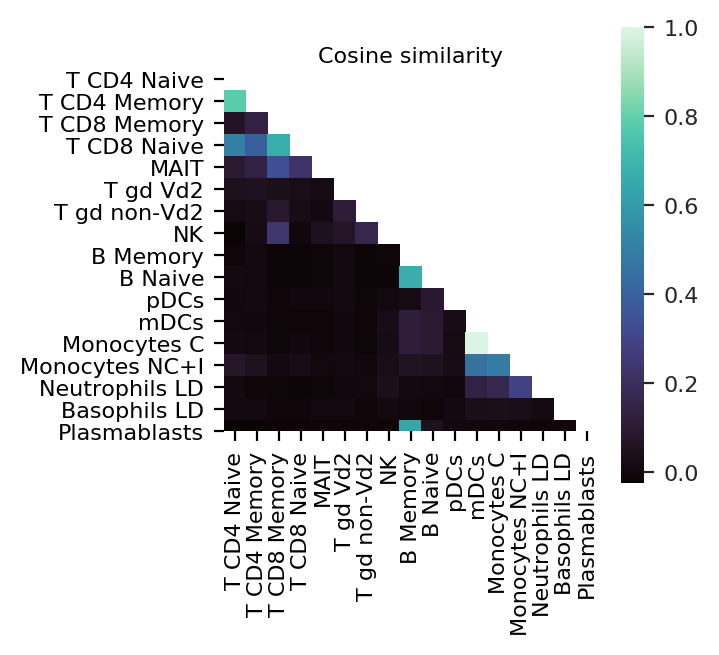

In [74]:
ax = plt.axes()
ax.set_title('Cosine similarity')
sorted_bulks_GA = sorted_bulks_paper_hv[best!=0]
print(sorted_bulks_GA.shape)
corr = pd.DataFrame(data = np.corrcoef(sorted_bulks_GA.T), columns = sorted_bulks_GA.columns, index = sorted_bulks_GA.columns)
interCorr = 0
for x in corr.index:
    for y in corr.columns:
        if (x!=y):
            interCorr = interCorr + abs(corr.loc[x,y])
print(interCorr)
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    sns_plot = sns.heatmap(corr, 
            xticklabels=corr.columns,mask=mask,cmap=sns.color_palette("mako", 1000),square=True)
sns_plot.figure.savefig(results_file+"corr_4k_GA.png",dpi=300, bbox_inches='tight')

15888147.011116639


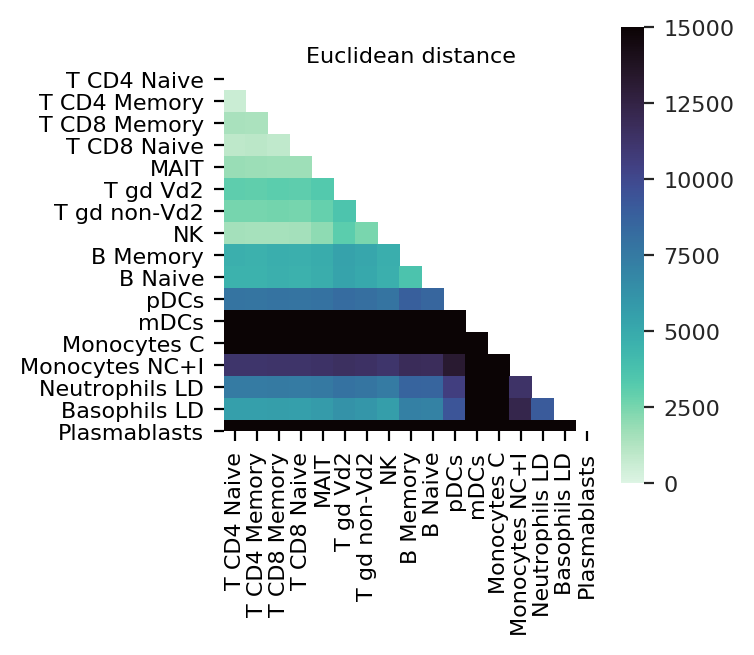

In [75]:
ax = plt.axes()
ax.set_title('Euclidean distance')
distance_ = 0
dist = pd.DataFrame(columns = sorted_bulks_GA.columns, index = sorted_bulks_GA.columns)
for x in sorted_bulks_GA.columns:
    for y in sorted_bulks_GA.columns:
        dist.loc[x,y] = sci.spatial.distance.euclidean(sorted_bulks_GA[x],sorted_bulks_GA[y])
        if (x!=y):
            distance_ = distance_ + sci.spatial.distance.euclidean(sorted_bulks_GA[x],sorted_bulks_GA[y])

print(distance_)
dist = dist.astype(float)
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
     sns_plot = sns.heatmap(dist,
        xticklabels=dist.index,
        yticklabels=dist.index,mask=mask,cmap=sns.color_palette("mako_r", 1000), vmax=15000,square=True)
sns_plot.figure.savefig(results_file+"dist_4k_GA.png",dpi=300, bbox_inches='tight')

In [148]:
corr.to_csv(results_file+'corr.csv')
dist.to_csv(results_file+'dist.csv')

In [ ]:
#sorted_bulks_GA.to_csv(r'./write/sorted_bulks_GA_4000hv_400f_0.5C_0.5D_paper_2.csv')

# Regression

## highly variable genes 

In [ ]:
from sklearn.svm import SVR
from sklearn.svm import NuSVR

samples_hv = samples_proc.loc[sorted_bulks_paper_hv.index,:]
samples_hv['index'] = samples_hv.index
samples_hv = samples_hv.drop_duplicates(subset='index', keep='first')
samples_hv = samples_hv.drop('index', axis=1).loc[sorted_bulks_paper_hv.index,:]
print(samples_hv.shape)
print(samples_hv.index)
print(sorted_bulks_paper_hv.index)
#proportions_SVR = pd.DataFrame(columns=sorted_bulks_hv.columns)
proportions_NuSVR = pd.DataFrame(columns=sorted_bulks_paper_hv.columns)

#regr_SVR = SVR(C=0.5,kernel='linear') 
regr_NuSVR = NuSVR(nu=0.5,C=0.5,kernel='linear') 

for column in samples_hv.columns:
    print(column)
    #regr_SVR.fit(sorted_bulks_hv, samples_hv.loc[:,column])
    regr_NuSVR.fit(sorted_bulks_paper_hv, samples_hv.loc[:,column])

    #proportions_SVR.loc[column] = regr_SVR.coef_[0]
    proportions_NuSVR.loc[column] = regr_NuSVR.coef_[0]

(4000, 13)
Index(['RP11-34P13.15', 'RP11-34P13.16', 'RP11-34P13.13', 'RP11-34P13.9',
       'RP4-669L17.10', 'MTND1P23', 'MTND2P28', 'MTCO3P12', 'RP11-206L10.2',
       'ISG15',
       ...
       'USP9Y', 'DDX3Y', 'UTY', 'ZNF839P1', 'BCORP1', 'TXLNGY', 'KDM5D',
       'EIF1AY', 'MT-ND3', 'MT-TE'],
      dtype='object', length=4000)
Index(['RP11-34P13.15', 'RP11-34P13.16', 'RP11-34P13.13', 'RP11-34P13.9',
       'RP4-669L17.10', 'MTND1P23', 'MTND2P28', 'MTCO3P12', 'RP11-206L10.2',
       'ISG15',
       ...
       'USP9Y', 'DDX3Y', 'UTY', 'ZNF839P1', 'BCORP1', 'TXLNGY', 'KDM5D',
       'EIF1AY', 'MT-ND3', 'MT-TE'],
      dtype='object', length=4000)
CYFZ_PBMC
FY2H_PBMC
FLWA_PBMC
453W_PBMC
684C_PBMC
CZJE_PBMC
DZQV_PBMC
925L_PBMC


In [ ]:
#proportions_SVR = normalize_proportions(proportions_SVR, copy = False)
proportions_NuSVR = normalize_proportions(proportions_NuSVR, copy = False)

In [ ]:
new_idx = [x.split('_', 1)[0] for x in proportions_NuSVR.index]
proportions_NuSVR.index = new_idx
proportions_NuSVR = proportions_NuSVR.loc[fractions.index,fractions.columns]
proportions_NuSVR

In [86]:
proportions_NuSVR.to_csv(results_file+"proportions_hv.csv")

## marker genes 

In [ ]:
signatures_markers.shape

In [ ]:
from sklearn.svm import NuSVR

samples_markers = samples_proc.loc[list(mgSet),:]
samples_markers['index'] = samples_markers.index
samples_markers = samples_markers.drop_duplicates(subset='index', keep='first')
samples_markers = samples_markers.drop('index', axis=1).loc[list(mgSet),:]

proportions_NuSVR_marker = pd.DataFrame(columns=samples_markers.columns)

regr_NuSVR = NuSVR(nu=0.5,C=0.5,kernel='linear') 

for column in samples_markers.columns:
    print(column)
    regr_NuSVR.fit(signatures_markers, samples_markers.loc[:,column])
    proportions_NuSVR_marker.loc[column] = regr_NuSVR.coef_[0]
    

In [ ]:
proportions_NuSVR_marker = normalize_proportions(proportions_NuSVR_marker, copy = False)


In [ ]:
new_idx = [x.split('_', 1)[0] for x in proportions_NuSVR_marker.index]
print(new_idx)
proportions_NuSVR_marker.index = new_idx
proportions_NuSVR_marker = proportions_NuSVR_marker.loc[fractions.index,fractions.columns]


In [117]:
proportions_NuSVR_marker.to_csv(results_file+'proportions_marker.csv')

## Condition-based genes

In [ ]:
from sklearn.svm import SVR
from sklearn.svm import NuSVR

samples_cibersort = samples_proc.loc[signatures_cibersort.index,:]
samples_cibersort['index'] = samples_cibersort.index
samples_cibersort = samples_cibersort.drop_duplicates(subset='index', keep='first')
samples_cibersort = samples_cibersort.drop('index', axis=1).loc[signatures_cibersort.index,:]
print(samples_cibersort.shape)
print(samples_cibersort.index)
print(signatures_cibersort.index)
proportions_SVR_ciber = pd.DataFrame(columns=signatures_cibersort.columns)
proportions_NuSVR_ciber = pd.DataFrame(columns=signatures_cibersort.columns)

regr_SVR = SVR(C=0.5,kernel='linear') 
regr_NuSVR = NuSVR(nu=0.5,C=0.5,kernel='linear') 

for column in samples_cibersort.columns:
    print(column)
    #regr_SVR.fit(signatures_cibersort, samples_cibersort.loc[:,column])
    regr_NuSVR.fit(signatures_cibersort, samples_cibersort.loc[:,column])

    #proportions_SVR_ciber.loc[column] = regr_SVR.coef_[0]
    proportions_NuSVR_ciber.loc[column] = regr_NuSVR.coef_[0]

In [ ]:
#proportions_SVR_ciber = normalize_proportions(proportions_SVR_ciber, copy = False)
proportions_NuSVR_ciber = normalize_proportions(proportions_NuSVR_ciber, copy = False)

In [ ]:
new_idx = [x.split('_', 1)[0] for x in proportions_NuSVR_ciber.index]
print(new_idx)
proportions_NuSVR_ciber.index = new_idx
proportions_NuSVR_ciber = proportions_NuSVR_ciber.loc[fractions.index,fractions.columns]

In [95]:
proportions_NuSVR_ciber.to_csv(results_file+'proportions_ciber.csv')

## ImmunoStates

In [30]:
immunoStates = pd.read_csv('./immunoStates.csv',index_col=0,delimiter=';')

In [31]:
immunoStates.index

Index(['ABCA5', 'ABCB1', 'ABHD5', 'ACSM3', 'ADAM19', 'ADAMTS5', 'ADI1',
       'AGPAT5', 'ALAS1', 'ALPL',
       ...
       'ULK2', 'WEE1', 'YTHDF3', 'ZC3H12A', 'ZDHHC13', 'ZNF180', 'ZNF189',
       'ZNF34', 'ZNF552', 'ZNF593'],
      dtype='object', name='Gene', length=317)

In [35]:
shared = np.intersect1d(immunoStates.index,sorted_bulks_paper.index)

In [36]:
signatures_immunoStates = sorted_bulks_paper.loc[shared,:]

In [37]:
from sklearn.svm import SVR
from sklearn.svm import NuSVR

samples_immunoStates = samples_proc.loc[signatures_immunoStates.index,:]
samples_immunoStates['index'] = samples_immunoStates.index
samples_immunoStates = samples_immunoStates.drop_duplicates(subset='index', keep='first')
samples_immunoStates = samples_immunoStates.drop('index', axis=1).loc[signatures_immunoStates.index,:]
print(samples_immunoStates.shape)
print(samples_immunoStates.index)
print(signatures_immunoStates.index)
proportions_SVR_immunoStates = pd.DataFrame(columns=signatures_immunoStates.columns)
proportions_NuSVR_immunoStates = pd.DataFrame(columns=signatures_immunoStates.columns)

regr_SVR = SVR(C=0.5,kernel='linear') 
regr_NuSVR = NuSVR(nu=0.5,C=0.5,kernel='linear') 

for column in samples_immunoStates.columns:
    print(column)
    #regr_SVR.fit(signatures_cibersort, samples_cibersort.loc[:,column])
    regr_NuSVR.fit(signatures_immunoStates, samples_immunoStates.loc[:,column])

    #proportions_SVR_ciber.loc[column] = regr_SVR.coef_[0]
    proportions_NuSVR_immunoStates.loc[column] = regr_NuSVR.coef_[0]

(268, 13)
Index(['ABCA5', 'ABCB1', 'ABHD5', 'ACSM3', 'ADAM19', 'ADAMTS5', 'ADI1',
       'AGPAT5', 'ALAS1', 'ALPL',
       ...
       'ULK2', 'WEE1', 'YTHDF3', 'ZC3H12A', 'ZDHHC13', 'ZNF180', 'ZNF189',
       'ZNF34', 'ZNF552', 'ZNF593'],
      dtype='object', length=268)
Index(['ABCA5', 'ABCB1', 'ABHD5', 'ACSM3', 'ADAM19', 'ADAMTS5', 'ADI1',
       'AGPAT5', 'ALAS1', 'ALPL',
       ...
       'ULK2', 'WEE1', 'YTHDF3', 'ZC3H12A', 'ZDHHC13', 'ZNF180', 'ZNF189',
       'ZNF34', 'ZNF552', 'ZNF593'],
      dtype='object', length=268)
CYFZ_PBMC
FY2H_PBMC
FLWA_PBMC
453W_PBMC
684C_PBMC
CZJE_PBMC
DZQV_PBMC
925L_PBMC
9JD4_PBMC
G4YW_PBMC
4DUY_PBMC
36TS_PBMC
CR3L_PBMC


In [38]:
#proportions_SVR_ciber = normalize_proportions(proportions_SVR_ciber, copy = False)
proportions_NuSVR_immunoStates = normalize_proportions(proportions_NuSVR_immunoStates, copy = False)

In [41]:
proportions_NuSVR_immunoStates.shape

(13, 17)

In [ ]:
new_idx = [x.split('_', 1)[0] for x in proportions_NuSVR_immunoStates.index]
print(new_idx)
proportions_NuSVR_immunoStates.index = new_idx
proportions_NuSVR_immunoStates = proportions_NuSVR_immunoStates.loc[fractions.index,fractions.columns]

In [ ]:
proportions_NuSVR_immunoStates.to_csv(results_file+'proportions_immunoStates.csv')

## signature genes from cell'19 

In [ ]:
from sklearn.svm import SVR
from sklearn.svm import NuSVR

samples_sig = samples_proc.loc[signatures_cell19.index,:].dropna()
print(samples_sig.shape)
samples_sig['index'] = samples_sig.index
samples_sig = samples_sig.drop_duplicates(subset='index', keep='first')
#samples_sig = samples_sig.drop('index', axis=1).loc[signatures_cell19.index,:]
print(samples_sig.shape)
print(samples_sig.index)
print(signatures_cell19.index)
proportions_SVR_sig = pd.DataFrame(columns=signatures_cell19.columns)
proportions_NuSVR_sig = pd.DataFrame(columns=signatures_cell19.columns)

regr_SVR = SVR(C=0.5,kernel='linear') 
regr_NuSVR = NuSVR(nu=0.5,C=0.5,kernel='linear') 

for column in samples_GA.columns:
    print(column)
    #regr_SVR.fit(signatures_cell19, samples_sig.loc[:,column])
    regr_NuSVR.fit(signatures_cell19.loc[samples_sig.index,:], samples_sig.loc[:,column])

    #proportions_SVR_sig.loc[column] = regr_SVR.coef_[0]
    proportions_NuSVR_sig.loc[column] = regr_NuSVR.coef_[0]

In [ ]:
#proportions_SVR_sig = normalize_proportions(proportions_SVR_sig, copy = False)
proportions_NuSVR_sig = normalize_proportions(proportions_NuSVR_sig, copy = False)

In [ ]:
new_idx = [x.split('_', 1)[0] for x in proportions_NuSVR_sig.index]
proportions_NuSVR_sig.index = new_idx
proportions_NuSVR_sig = proportions_NuSVR_sig.loc[fractions.index,fractions.columns]
proportions_NuSVR_sig

In [122]:
proportions_NuSVR_sig.to_csv(results_file+'proportions_cell19.csv')

## signature genes from GA

In [ ]:
from sklearn.svm import SVR
from sklearn.svm import NuSVR

samples_GA = samples_proc.loc[sorted_bulks_GA.index,:]
samples_GA['index'] = samples_GA.index
samples_GA = samples_GA.drop_duplicates(subset='index', keep='first')
samples_GA = samples_GA.drop('index', axis=1).loc[samples_GA.index,:]
print(samples_GA.shape)
print(samples_GA.index)
print(sorted_bulks_GA.index)
proportions_SVR_GA = pd.DataFrame(columns=sorted_bulks_GA.columns)
proportions_NuSVR_GA = pd.DataFrame(columns=sorted_bulks_GA.columns)

regr_SVR = SVR(C=0.5,kernel='linear') 
regr_NuSVR = NuSVR(nu=0.5,C=0.5,kernel='linear') 

for column in samples_GA.columns:
    print(column)
    #regr_SVR.fit(sorted_bulks_GA, samples_GA.loc[:,column])
    regr_NuSVR.fit(sorted_bulks_GA, samples_GA.loc[:,column])

    #proportions_SVR_GA.loc[column] = regr_SVR.coef_[0]
    proportions_NuSVR_GA.loc[column] = regr_NuSVR.coef_[0]

In [ ]:
samples_GA.columns

In [ ]:
#proportions_SVR_GA = normalize_proportions(proportions_SVR_GA, copy = False)
proportions_NuSVR_GA = normalize_proportions(proportions_NuSVR_GA, copy = False)


In [ ]:
new_idx = [x.split('_', 1)[0] for x in proportions_NuSVR_GA.index]
proportions_NuSVR_GA.index = new_idx
proportions_NuSVR_GA = proportions_NuSVR_GA.loc[fractions.index,fractions.columns]
#proportions_NuSVR_GA.to_csv(r'./write/fractions_GA_2500hv_0.5C_0.5D.csv')
#proportions_NuSVR_GA

In [ ]:
proportions_NuSVR_GA.to_csv(results_file+'proportions_GA.csv')

In [91]:
norm_fractions.to_csv(results_file+'proportions_orig.csv')

In [162]:
---
sorted_bulks_GA.to_csv(r'./write/sorted_bulks_4k_GA_500_paper.csv')
sorted_bulks_paper_hv.to_csv(r'./write/sorted_bulks_4k_hv_paper.csv')
signatures_cell19.to_csv(r'./write/sorted_bulks_cell19_paper.csv')
signatures_cibersort.to_csv(r'./write/sorted_bulks_ciber_paper.csv')

In [90]:
norm_fractions = normalize_proportions(fractions,copy=False)

In [ ]:
def t_test(actual_proportions,proportions,figDir,method):
    rs = []
    ps=[]
    for cluster in proportions.columns:
        r,p = plot_1(actual_proportions[cluster],proportions[cluster],cluster,figDir+'_'+cluster+'_'+method+'.png')
        rs+=[round(r, 2)] 
        ps+=[round(p, 2)] 
    return rs,ps

In [ ]:
def plot_1(x,y,title,figDir):
    s,i,r,p,e = sci.stats.linregress(x,y)
    f = plt.figure(figsize=(5,5))
    ax = f.add_subplot(111)
    ax.grid(b=False)
    
    plt.xlim(np.min(x), np.max(x)+0.01)
    plt.ylim(np.min(y), np.max(y)+0.01)
    
    ax.scatter(x, y, color = 'black',s=5)
    
    x2 = np.linspace(np.min(x), np.max(x), 1000)
    y2=x2*s+i
    ax.plot(x2,y2)
    # Hide the right and top spines
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # Only show ticks on the left and bottom spines
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')

    #ax.set_aspect('equal', 'box')
    #ax.xaxis.set_ticklabels([])
    #ax.yaxis.set_ticklabels([])
    plt.title(title)
    #ax.figure(figsize=(5,5))
    ax.text(0.8, 0.1,'r='+str(round(r,2)), ha='center', va='center', transform=ax.transAxes)
    #plt.show()
    ax.get_figure().savefig(figDir, dpi=300)
    return r,p

In [82]:
proportions_NuSVR_GA

,T CD4 Naive,T CD4 Memory,T CD8 Memory,T CD8 Naive,MAIT,T gd Vd2,T gd non-Vd2,NK,B Memory,B Naive,pDCs,mDCs,Monocytes C,Monocytes NC+I,Neutrophils LD,Basophils LD,Plasmablasts
CYFZ_PBMC,0.000624,0.195802,0.143895,0.050125,0.001712,0.012980,0.012580,0.073972,0.034091,0.062064,0.000135,0.004703,0.124695,0.044273,0.008118,0.009114,-0.000261
FY2H_PBMC,0.044426,0.069939,0.054037,0.093555,0.024326,0.006178,0.056483,0.081639,0.007977,0.064061,0.004145,0.006140,0.232902,0.044613,0.019052,0.006680,-0.001218
FLWA_PBMC,0.021061,0.099818,-0.001779,0.078386,0.055656,0.025260,0.000492,0.252198,-0.094375,0.182773,0.004925,0.003143,0.184359,-0.005884,0.020709,0.019193,0.004633
453W_PBMC,0.025457,0.168086,0.164114,0.092980,0.015399,0.011920,0.008574,0.067872,-0.044262,0.097050,0.005776,0.003881,0.178679,0.023857,0.047001,0.006562,0.002615
684C_PBMC,0.145273,0.136503,0.027978,0.139206,0.038142,-0.001953,0.011227,0.073512,-0.005289,0.109185,0.003855,0.004428,0.135815,0.032401,0.024087,0.016299,0.011474
CZJE_PBMC,-0.019612,0.075275,-0.014522,0.193434,0.072892,0.020996,0.000833,0.124604,0.058813,0.067768,0.003446,0.009660,0.151319,0.033182,0.022634,0.006995,0.000759
DZQV_PBMC,0.060293,0.026249,0.070338,0.130050,0.089254,0.053644,0.020523,0.040269,0.110482,0.029344,0.005455,-0.000987,0.187064,0.006427,0.008920,0.012614,0.005349
925L_PBMC,0.013213,0.147174,0.067566,0.109590,0.021709,0.021326,0.005446,0.090400,0.014438,0.168717,-0.000660,0.005465,0.171506,0.016717,0.017135,0.018656,-0.001274
9JD4_PBMC,0.142345,0.110089,0.108214,0.144101,0.021945,0.009558,0.002979,0.038986,0.054878,0.039893,0.006429,0.014710,0.098278,0.035847,0.013385,0.014807,0.001932
G4YW_PBMC,0.097978,0.105226,0.002412,0.128192,0.047620,0.015434,0.021007,0.142203,0.023664,0.059465,0.001287,0.002853,0.181472,0.020526,0.009925,0.002059,0.006514


In [83]:
norm_fractions

,B Naive,Plasmablasts,T CD4 Naive,T CD8 Naive,T gd Vd2,T gd non-Vd2,MAIT,NK,pDCs,mDCs,Monocytes C,Neutrophils LD,Basophils LD,B Memory,T CD4 Memory,T CD8 Memory,Monocytes NC+I
Sample Name,,,,,,,,,,,,,,,,,
453W,0.029197,0.000701,0.097306,0.056568,0.010447,0.007719,0.021733,0.071984,0.006052,0.004035,0.205973,0.012953,0.010086,0.025195,0.171637,0.243452,0.023995
684C,0.070660,0.007758,0.105372,0.088179,0.001164,0.010264,0.036158,0.088587,0.006395,0.006919,0.205481,0.019605,0.019395,0.026104,0.206141,0.074214,0.027153
CR3L,0.085626,0.005518,0.111079,0.117833,0.029428,0.006488,0.051856,0.110354,0.005620,0.007766,0.143051,0.061103,0.020845,0.022786,0.163201,0.036754,0.020027
FLWA,0.057033,0.001570,0.063667,0.039923,0.035789,0.002281,0.038636,0.204062,0.004395,0.006697,0.205109,0.037882,0.027418,0.028987,0.183656,0.047405,0.013186
FY2H,0.061822,0.001130,0.083162,0.054213,0.006531,0.112102,0.022470,0.026701,0.003800,0.010167,0.275222,0.022593,0.012323,0.009314,0.113827,0.123316,0.060282
CYFZ,0.062290,0.001971,0.060549,0.036630,0.009787,0.018775,0.012151,0.153262,0.003065,0.004160,0.121515,0.013137,0.014888,0.027368,0.129517,0.267902,0.062290
925L,0.134887,0.001176,0.034702,0.062221,0.025136,0.010201,0.011154,0.102643,0.001049,0.005932,0.180075,0.025316,0.039617,0.030062,0.171061,0.136105,0.028176
9JD4,0.048254,0.002772,0.118694,0.111630,0.018480,0.022648,0.034517,0.077308,0.004928,0.004928,0.149894,0.006160,0.020225,0.034188,0.189647,0.130624,0.024435
G4YW,0.037638,0.004756,0.096659,0.089059,0.025199,0.022572,0.044638,0.180951,0.002792,0.005687,0.192326,0.015303,0.004860,0.035156,0.155908,0.049994,0.035363


In [127]:
figdir = "./write/results/bulk_bulk_pbmc/"
proportions_NuSVR_GA = proportions_NuSVR_GA.drop('Progenitors',axis=1)
norm_fractions = norm_fractions.drop('Progenitors',axis=1)

In [128]:
proportions_NuSVR_marker = proportions_NuSVR_marker.drop('Progenitors',axis=1)
proportions_NuSVR_ciber = proportions_NuSVR_ciber.drop('Progenitors',axis=1)
proportions_NuSVR = proportions_NuSVR.drop('Progenitors',axis=1)
proportions_NuSVR_sig = proportions_NuSVR_sig.drop('Progenitors',axis=1)

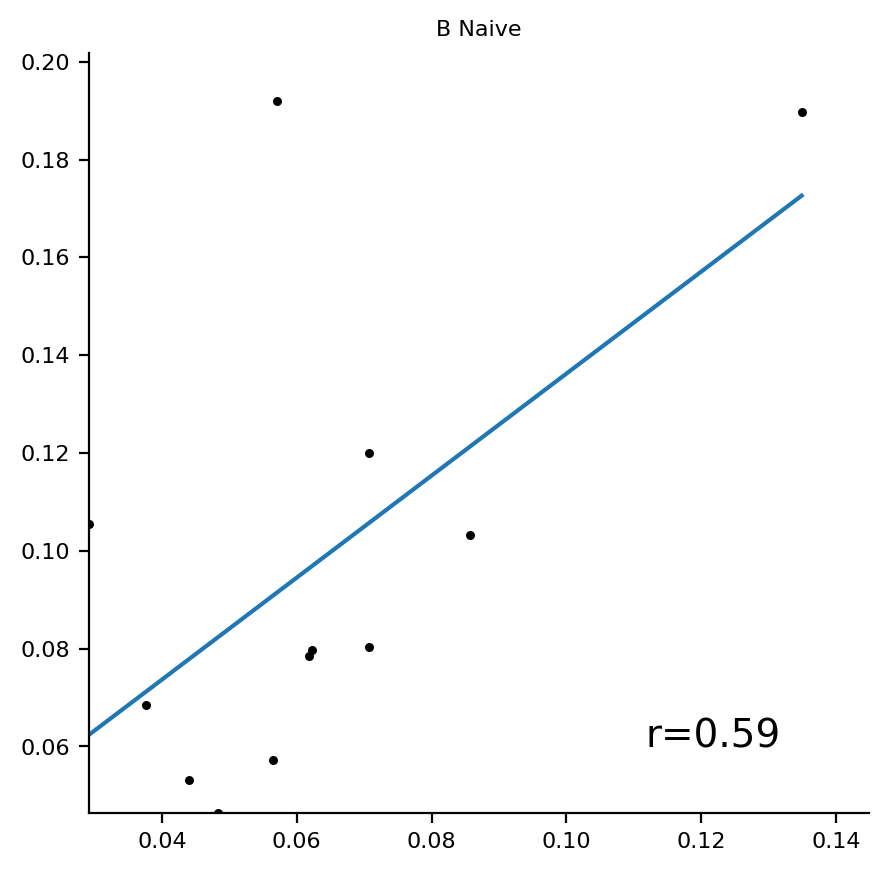

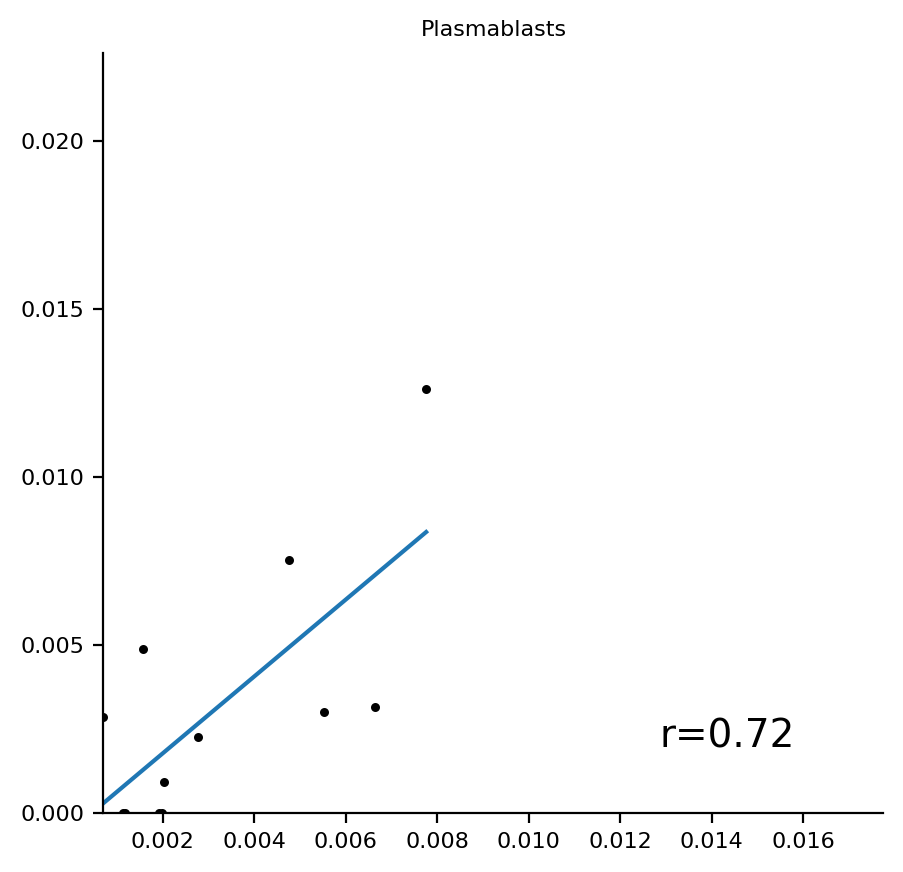

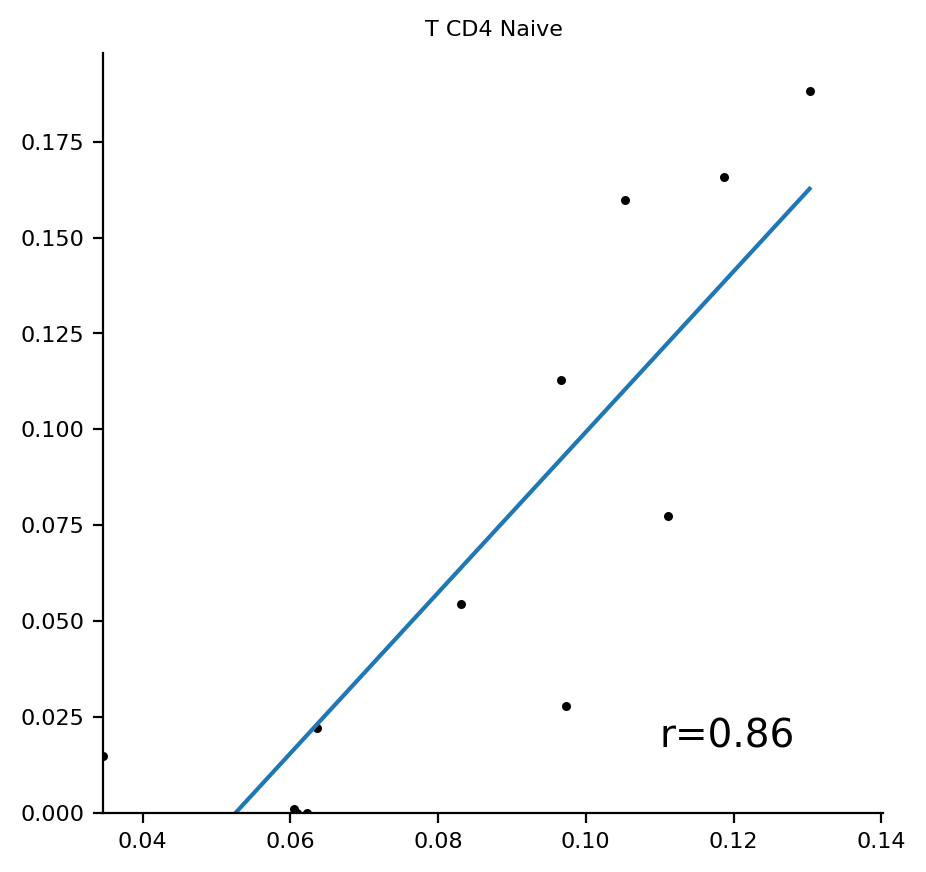

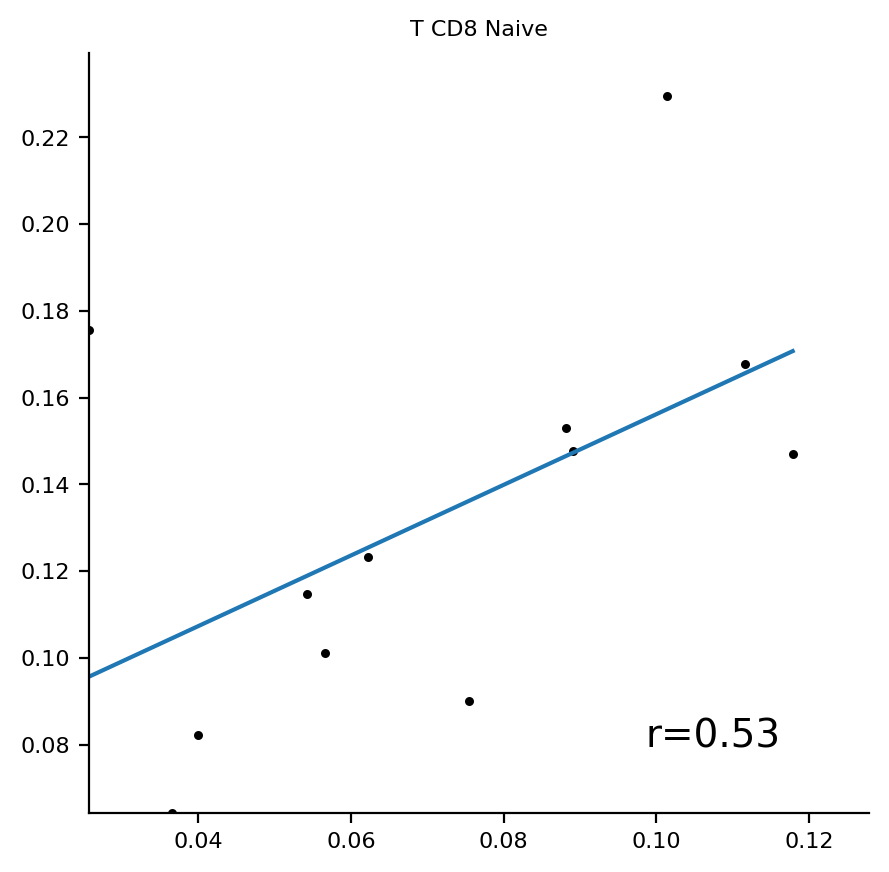

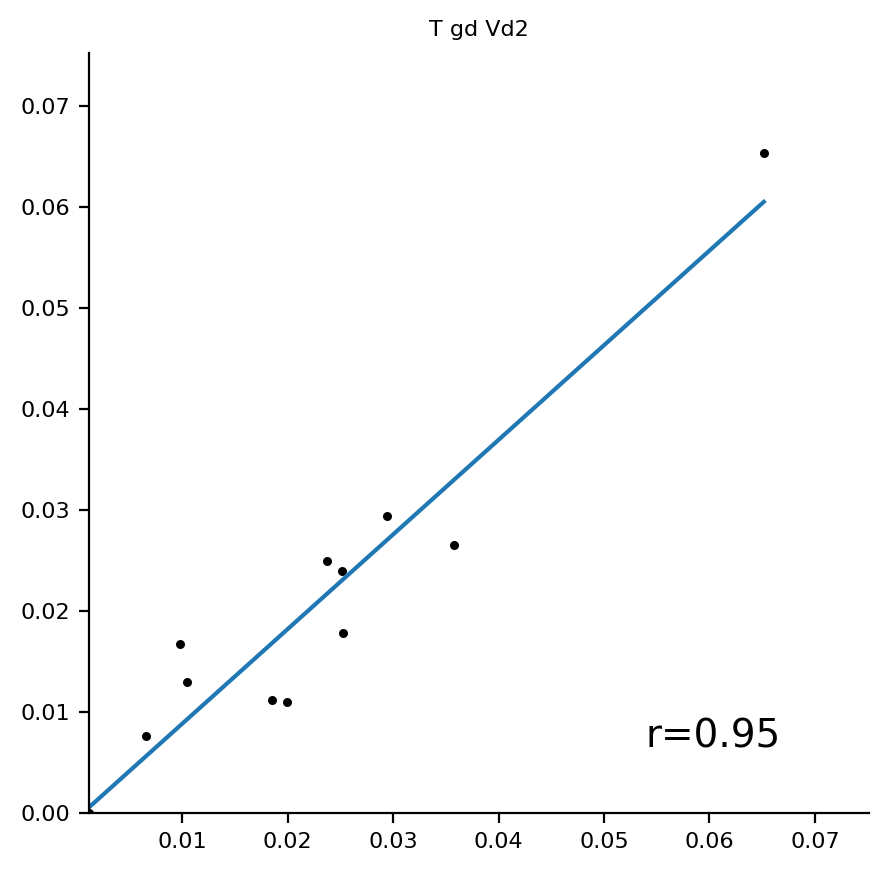

...

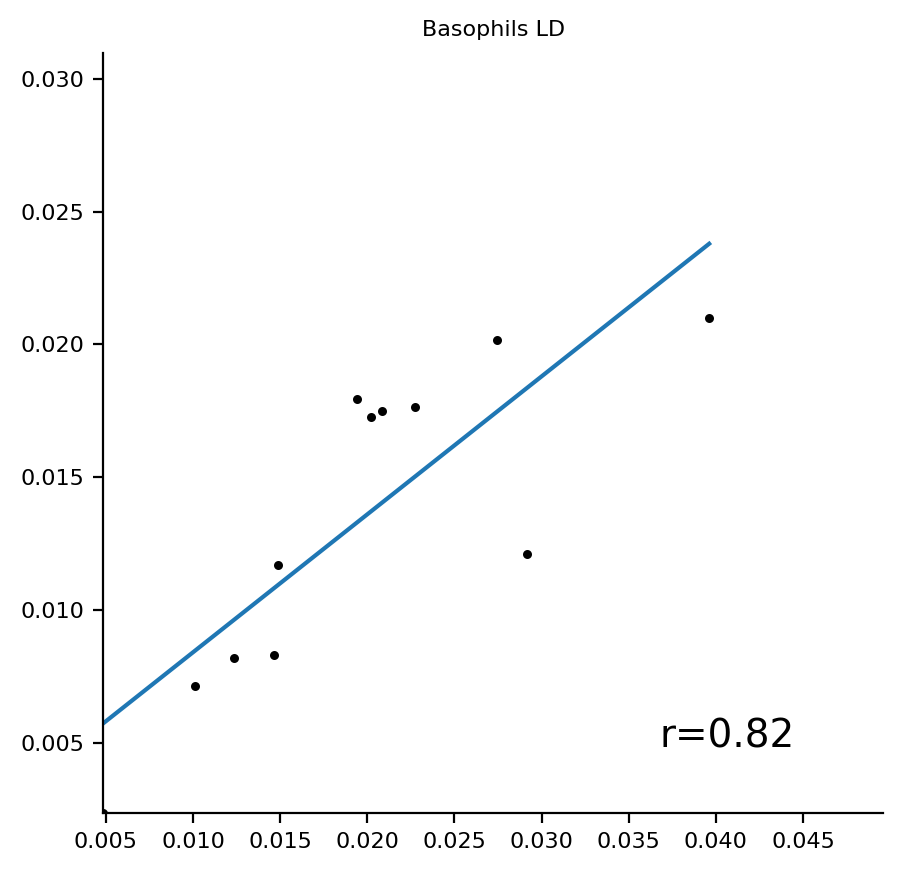

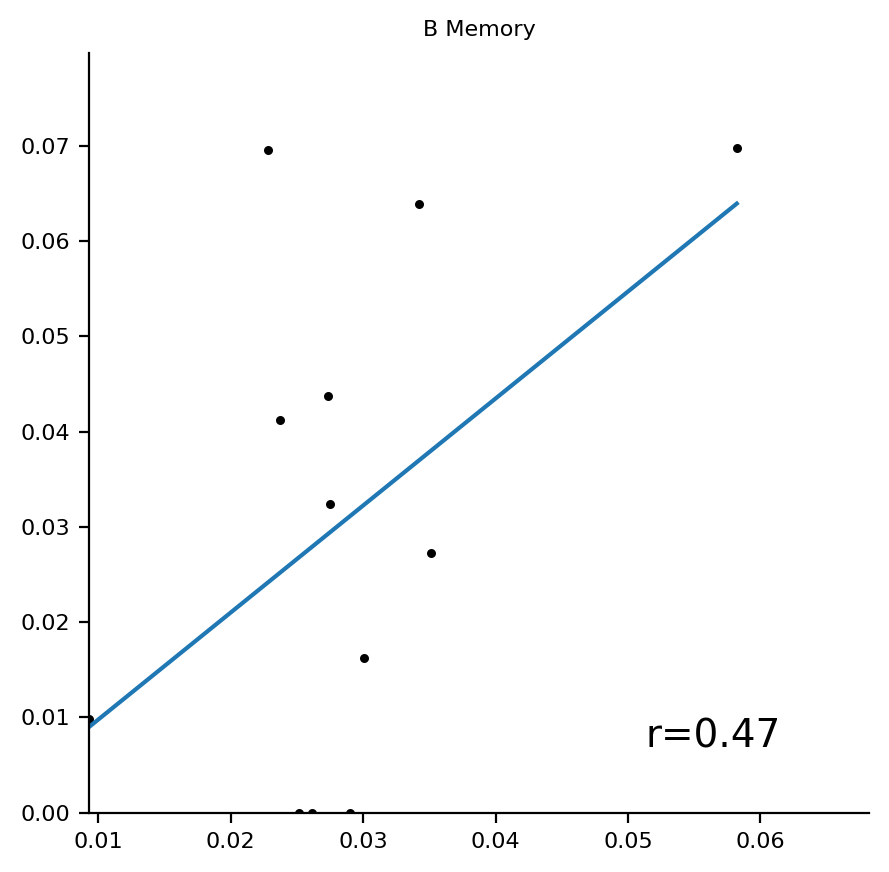

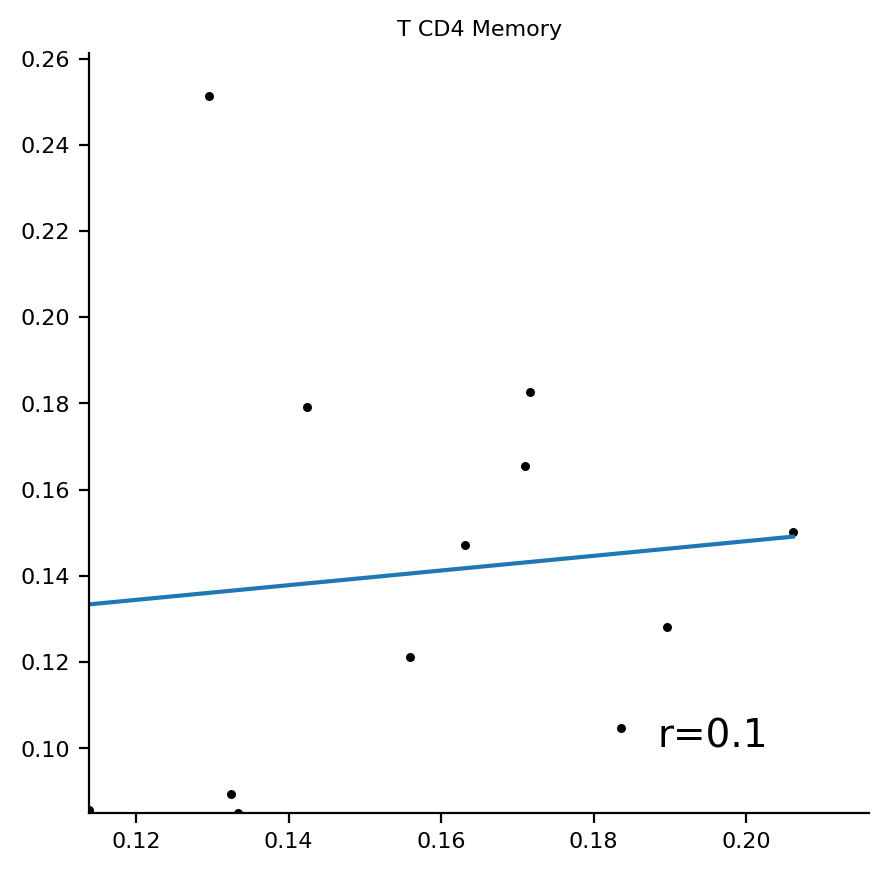

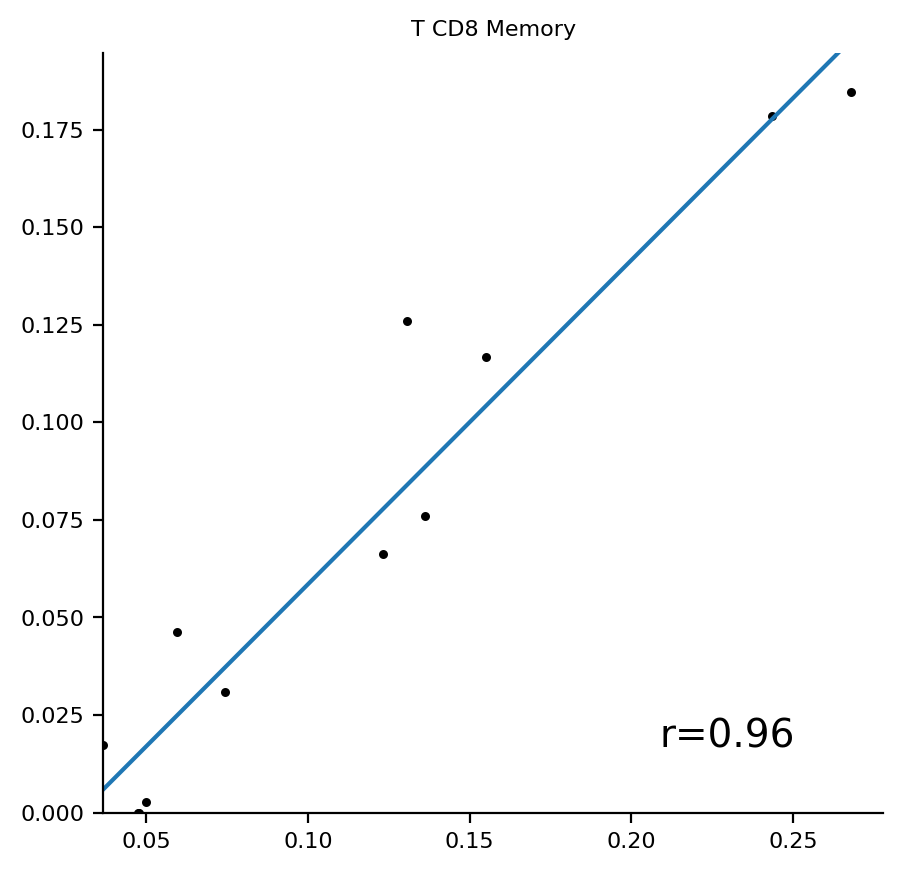

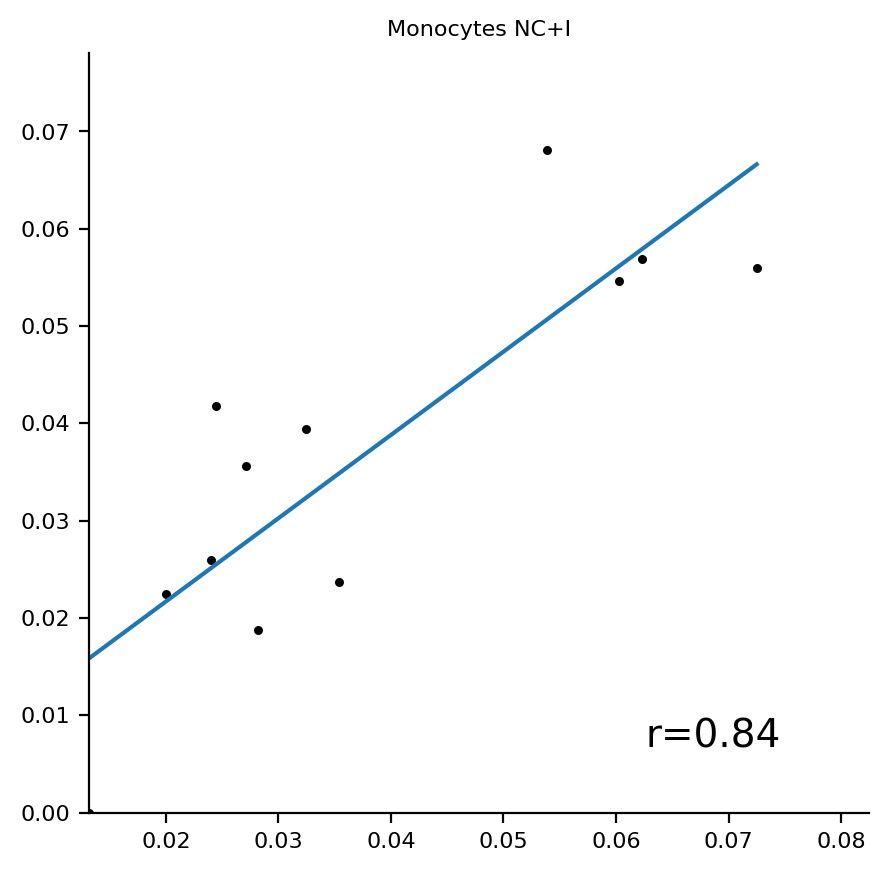

In [129]:
r_GA, p_GA = t_test(norm_fractions, proportions_NuSVR_GA,figdir,'AutoGeneS') 


In [ ]:
r_immuno, p_immuno = t_test(norm_fractions, proportions_NuSVR_immunoStates,figdir,'C_immunoState') 

In [ ]:
r_immuno, p_immuno

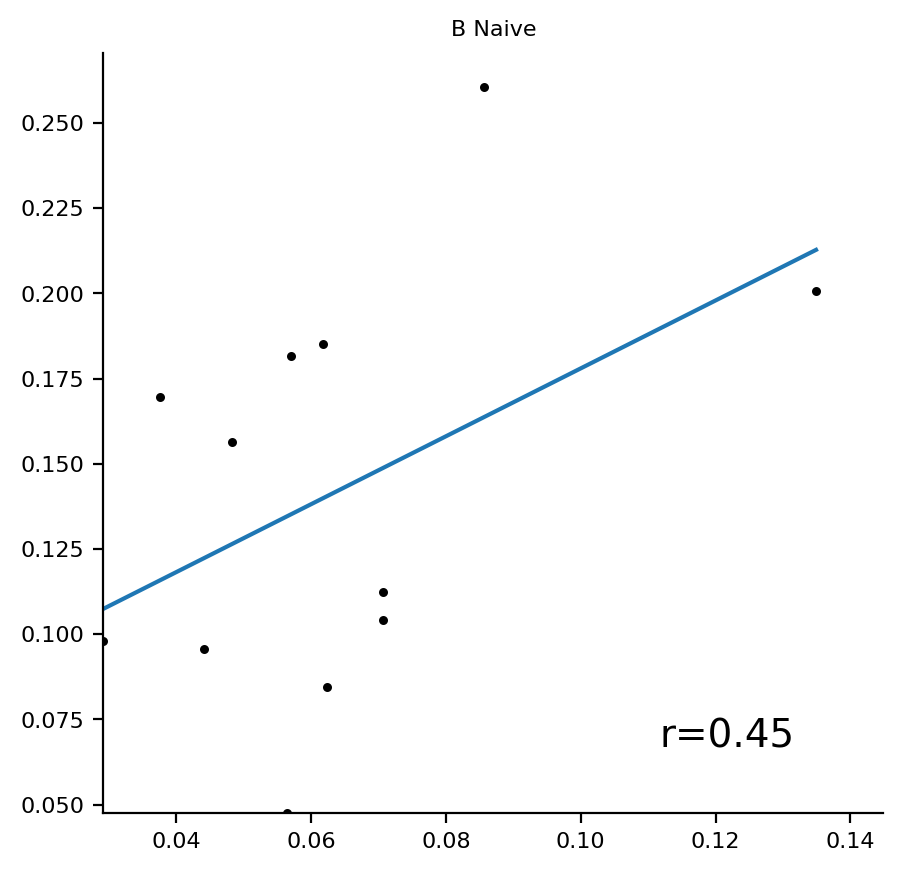

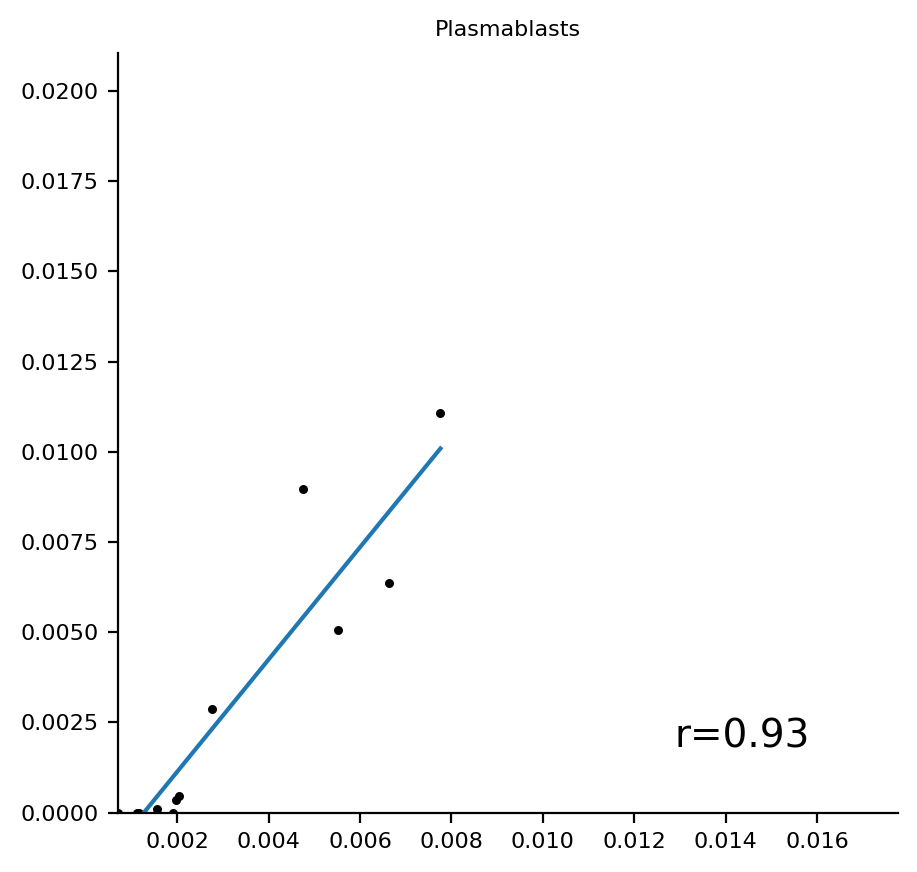

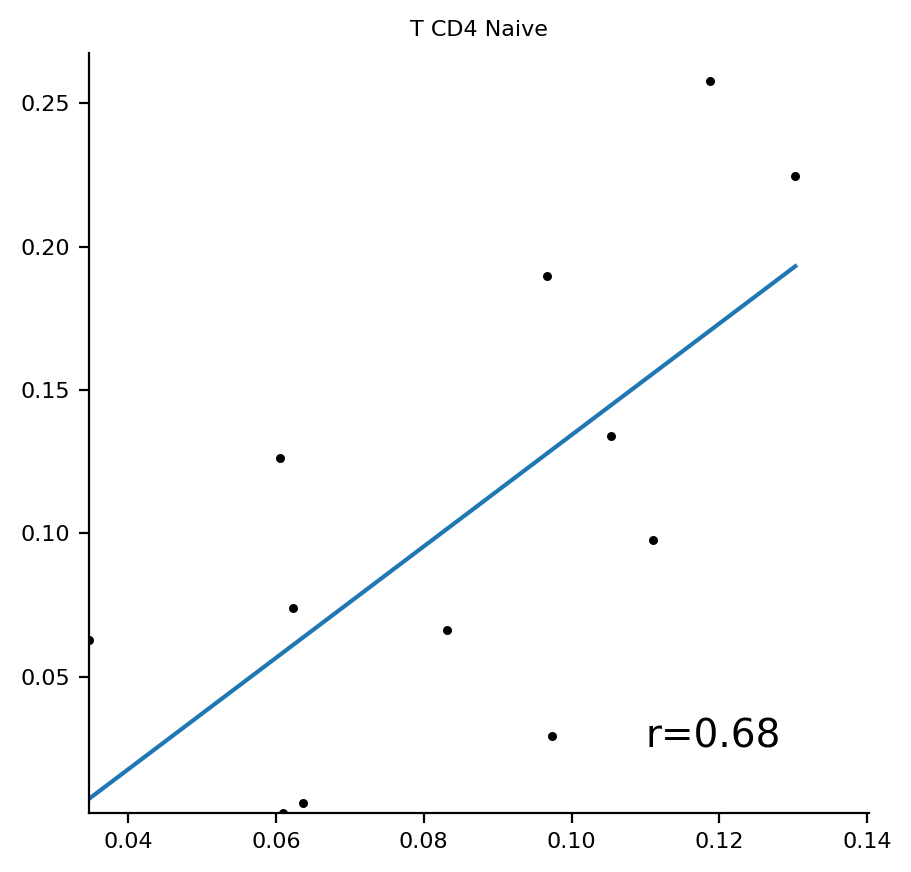

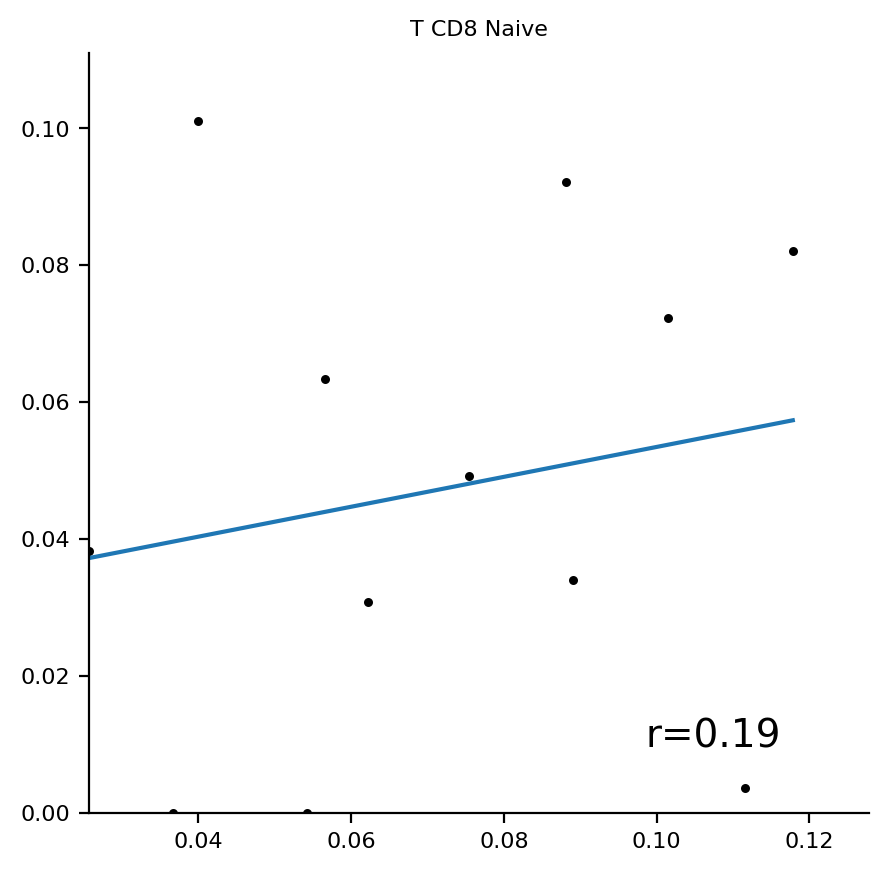

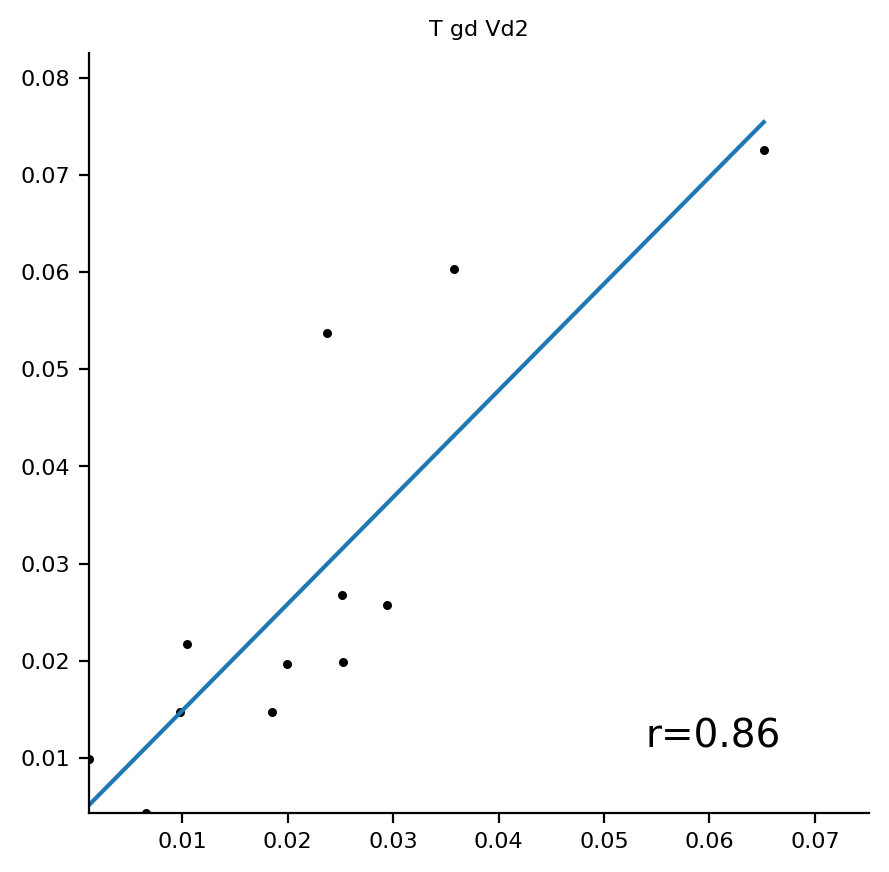

...

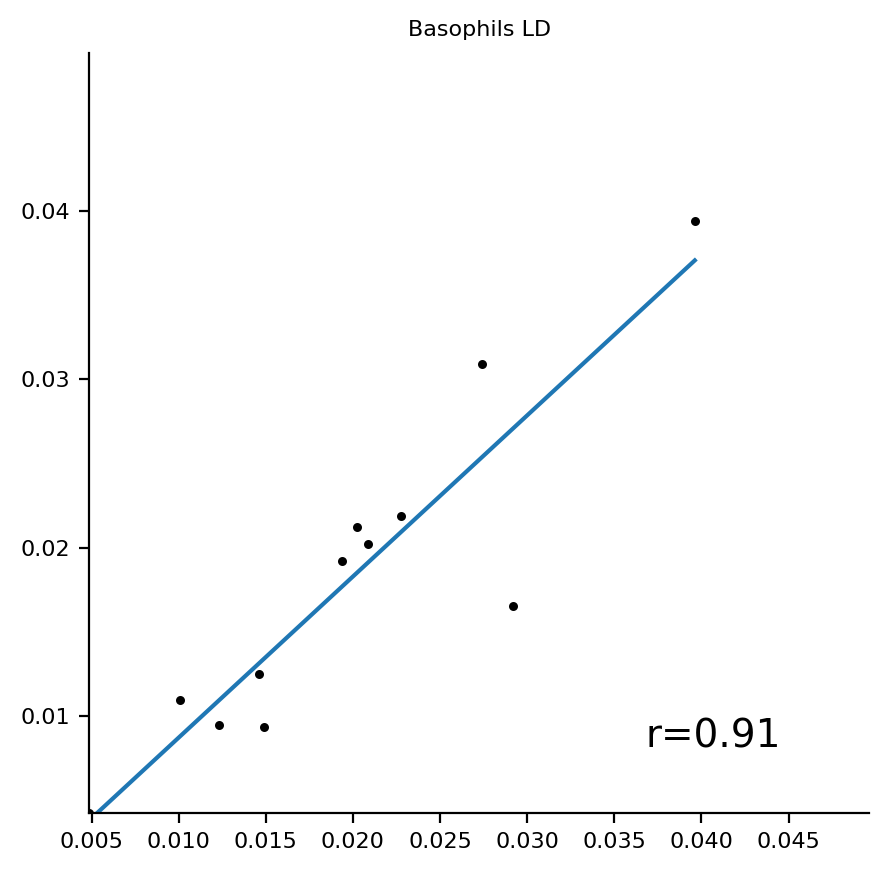

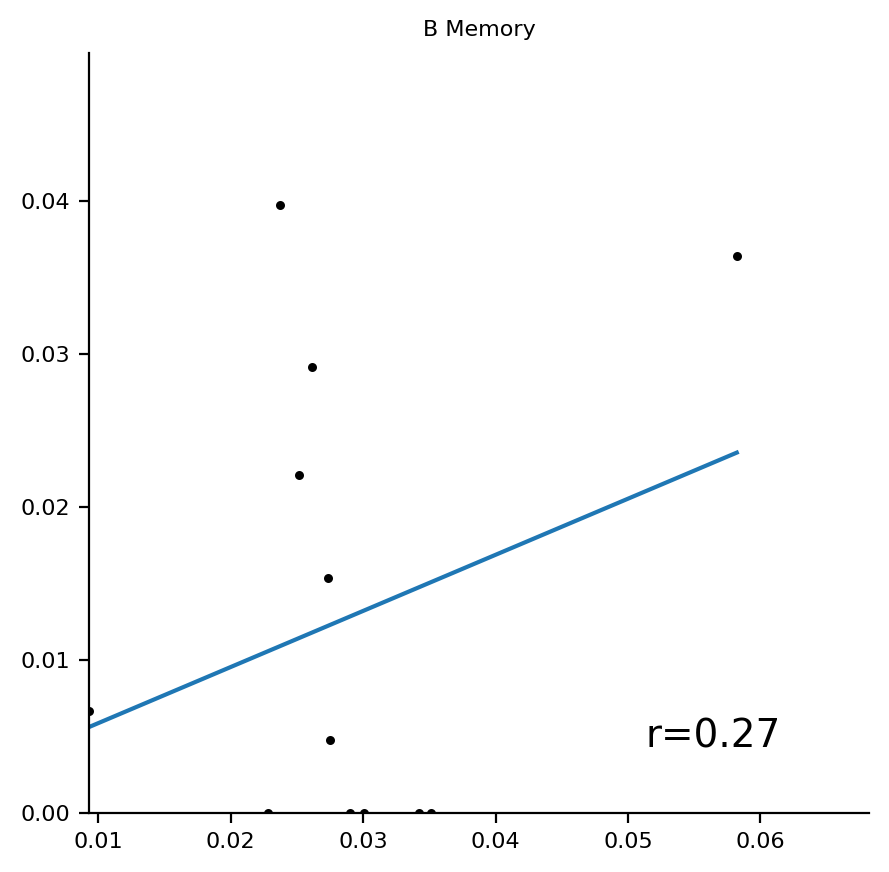

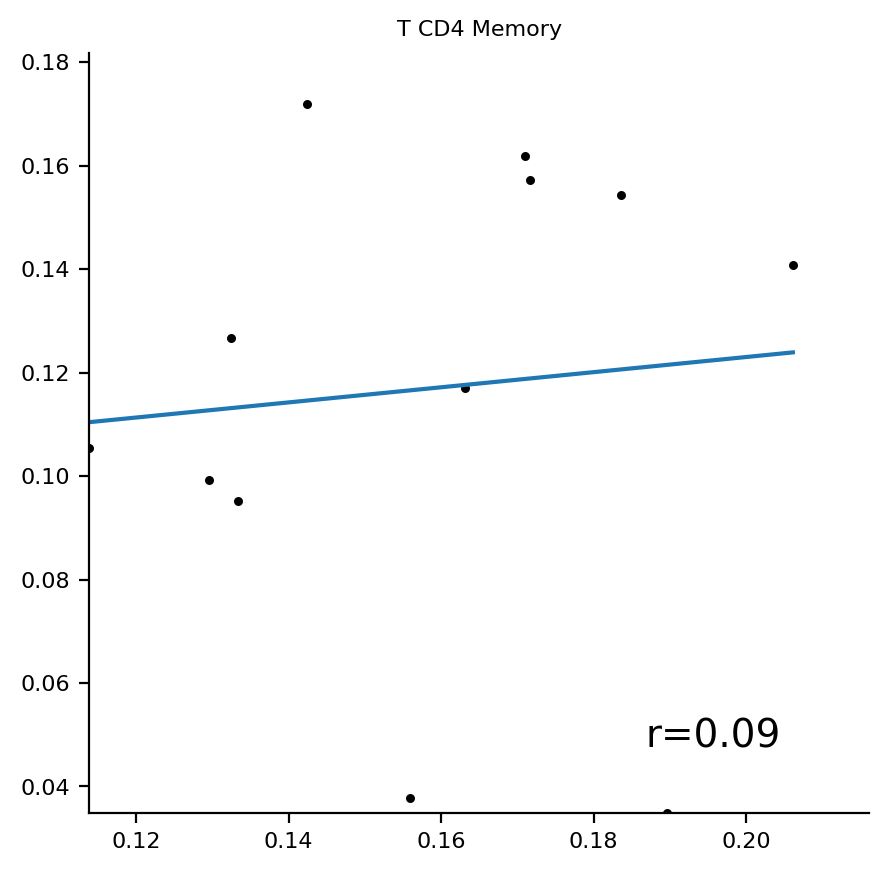

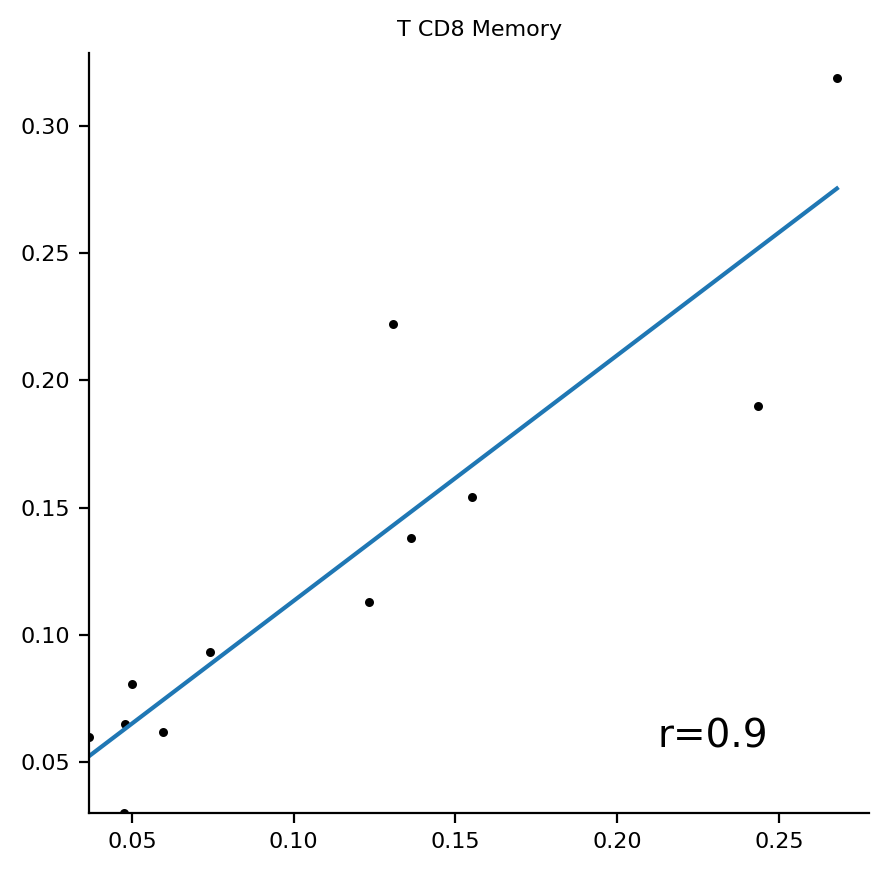

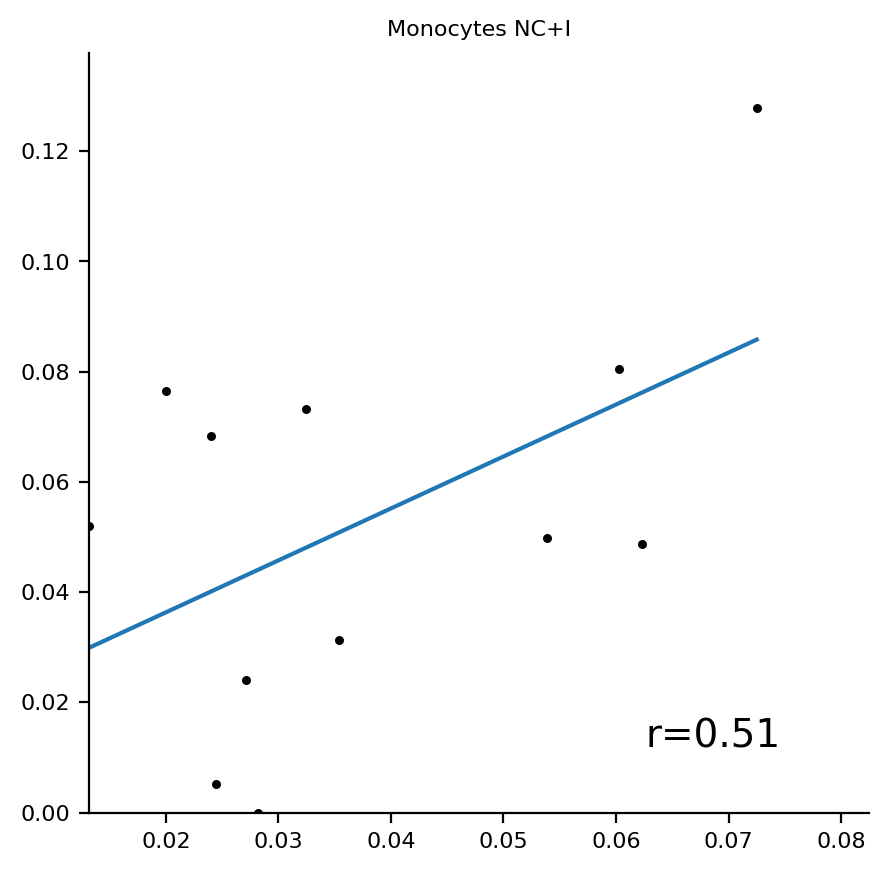

In [130]:
r_ciber, p_ciber = t_test(norm_fractions, proportions_NuSVR_ciber,figdir,'C_MG') 

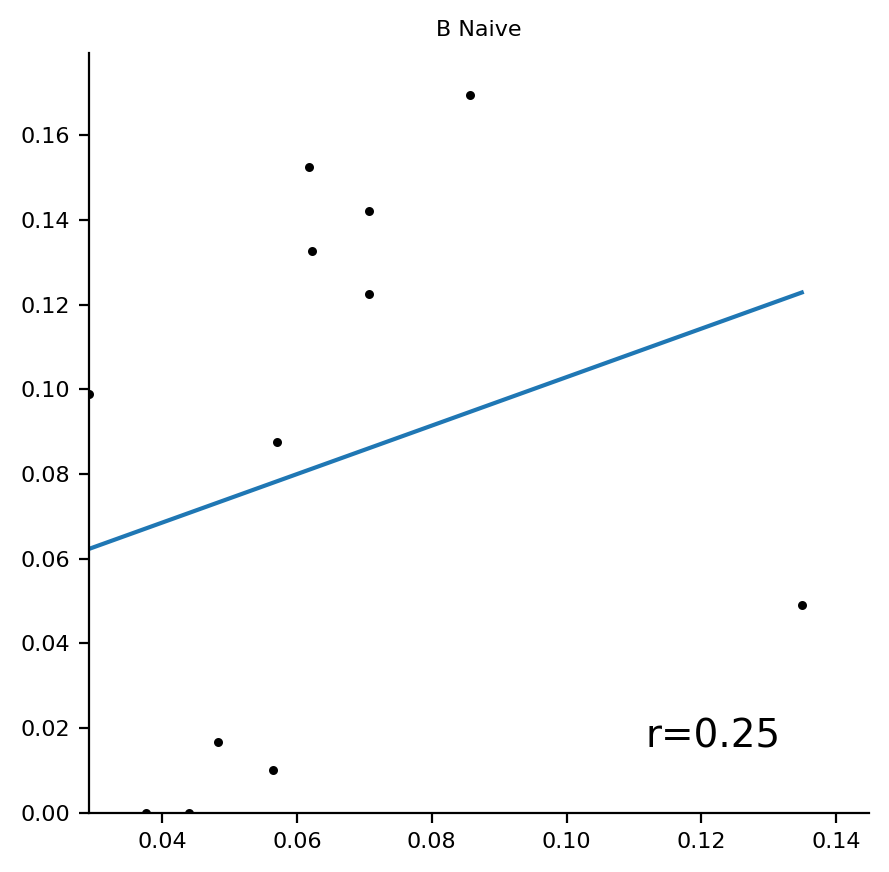

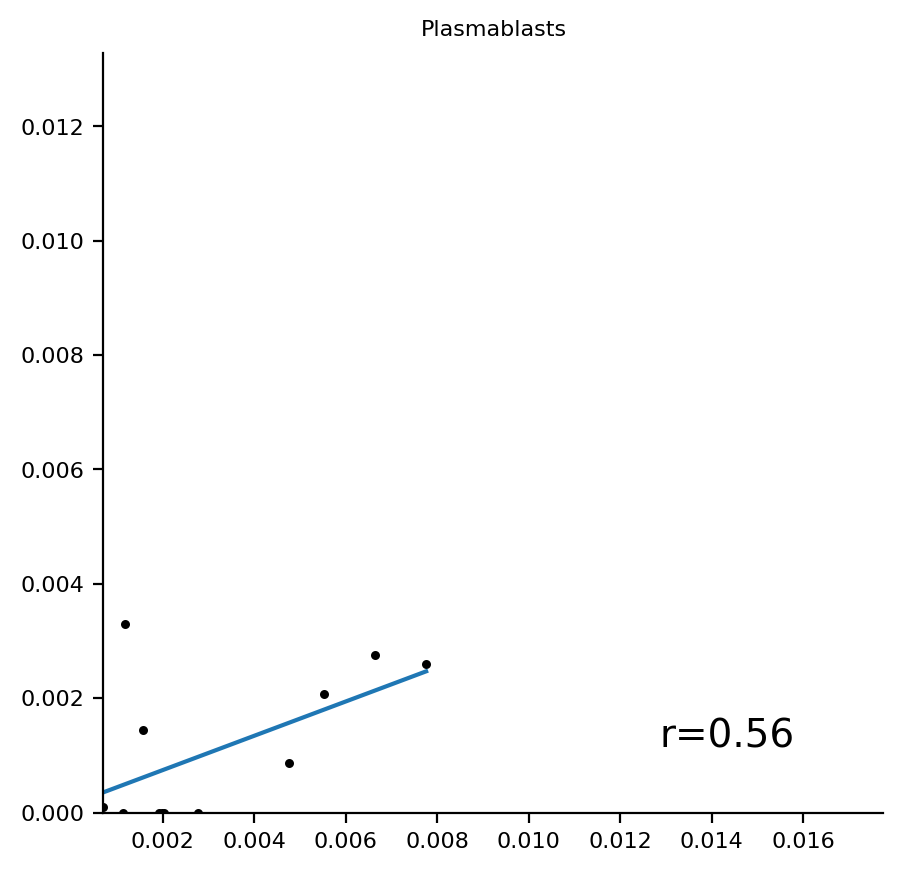

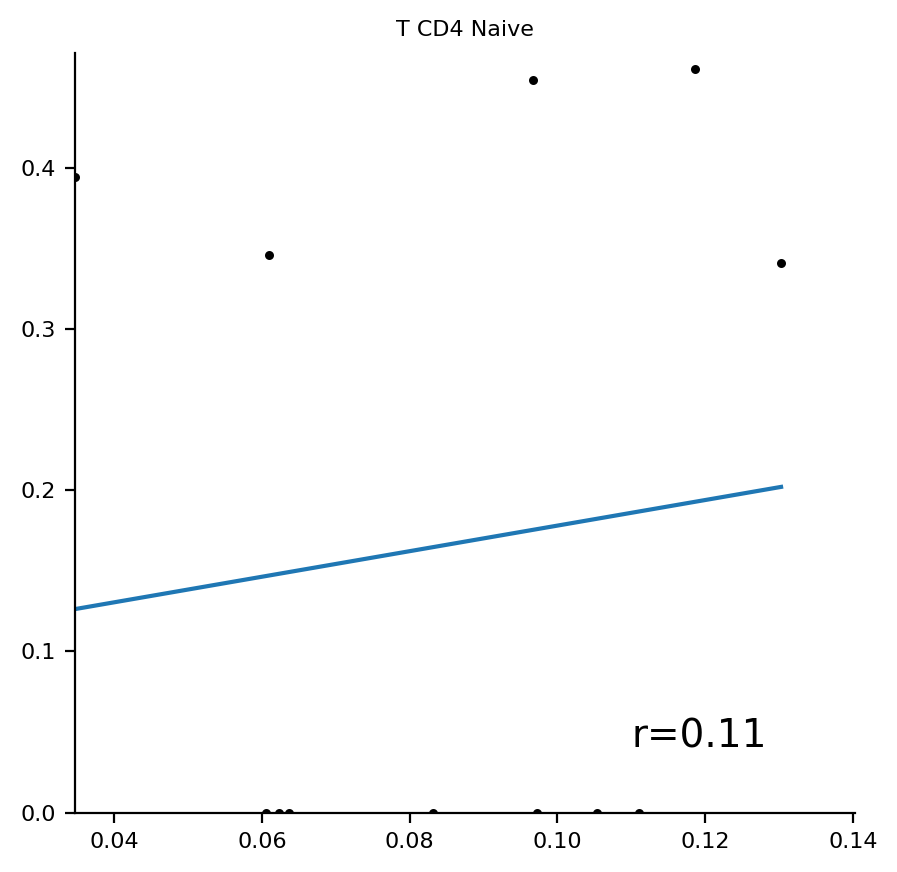

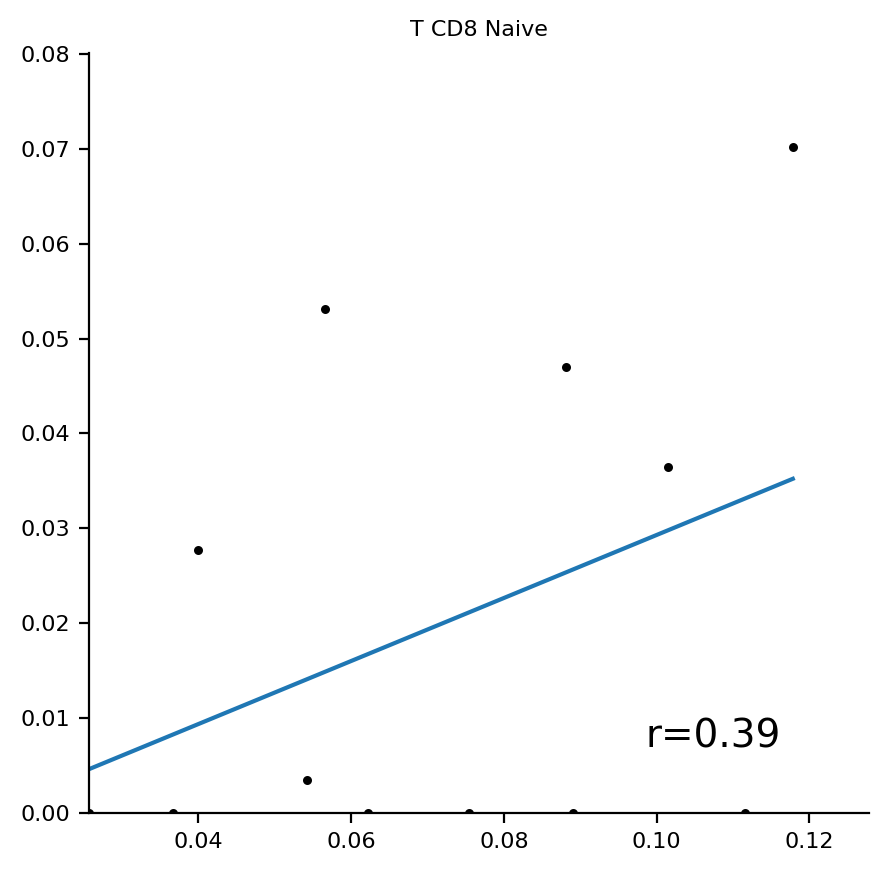

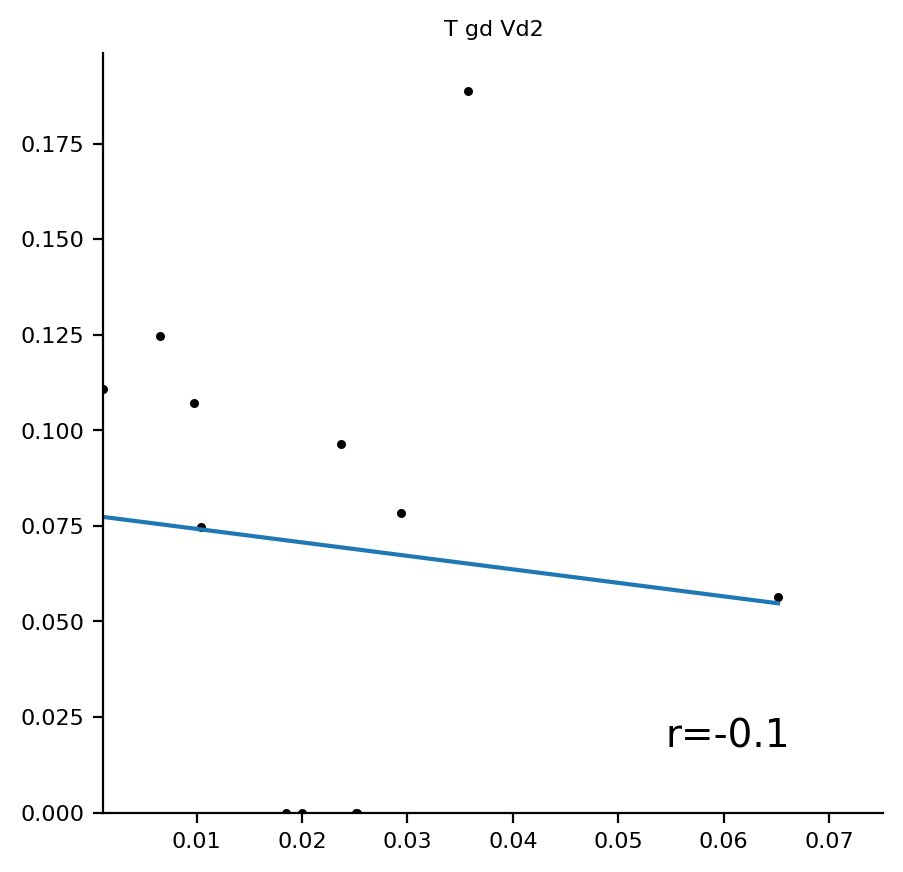

...

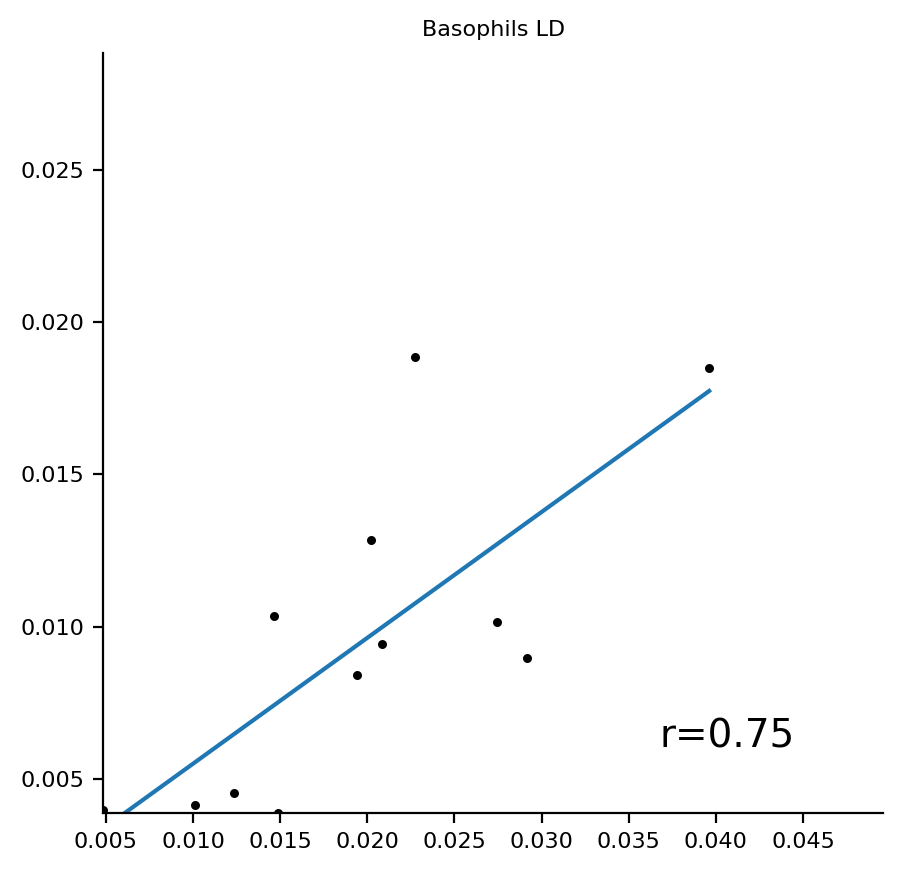

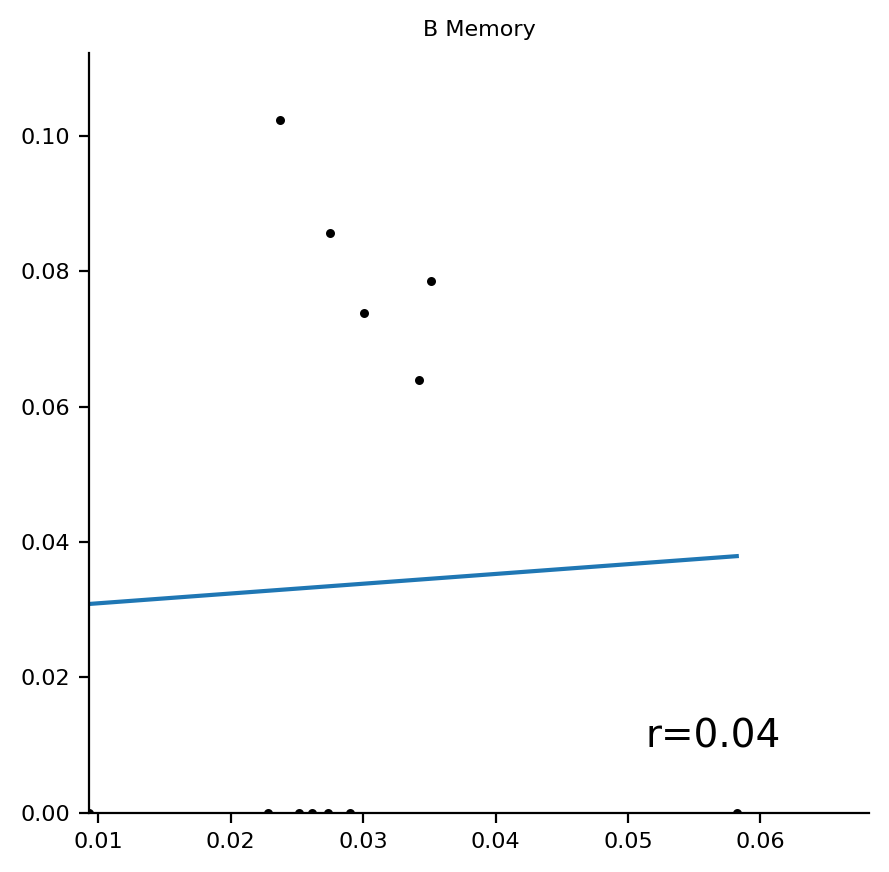

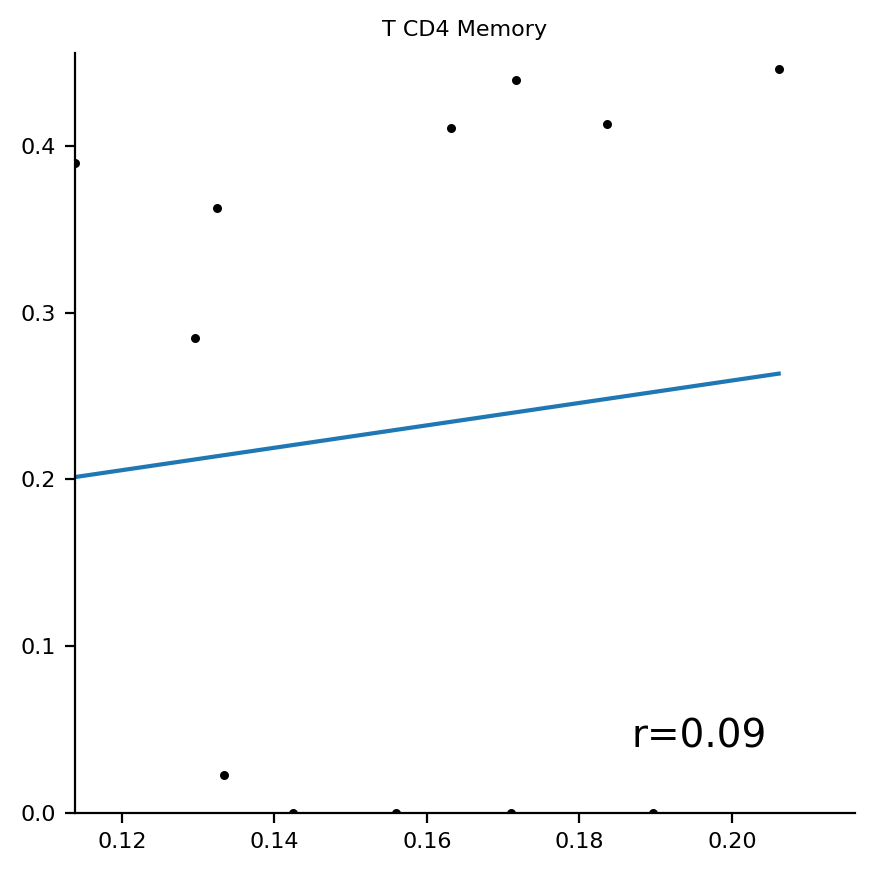

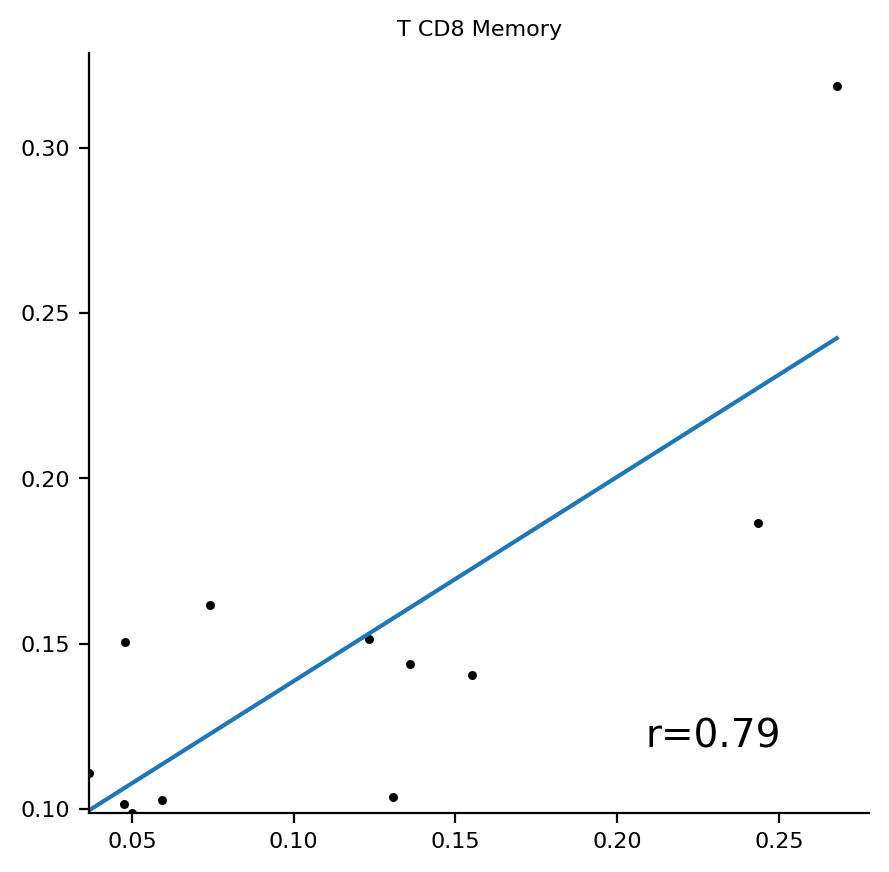

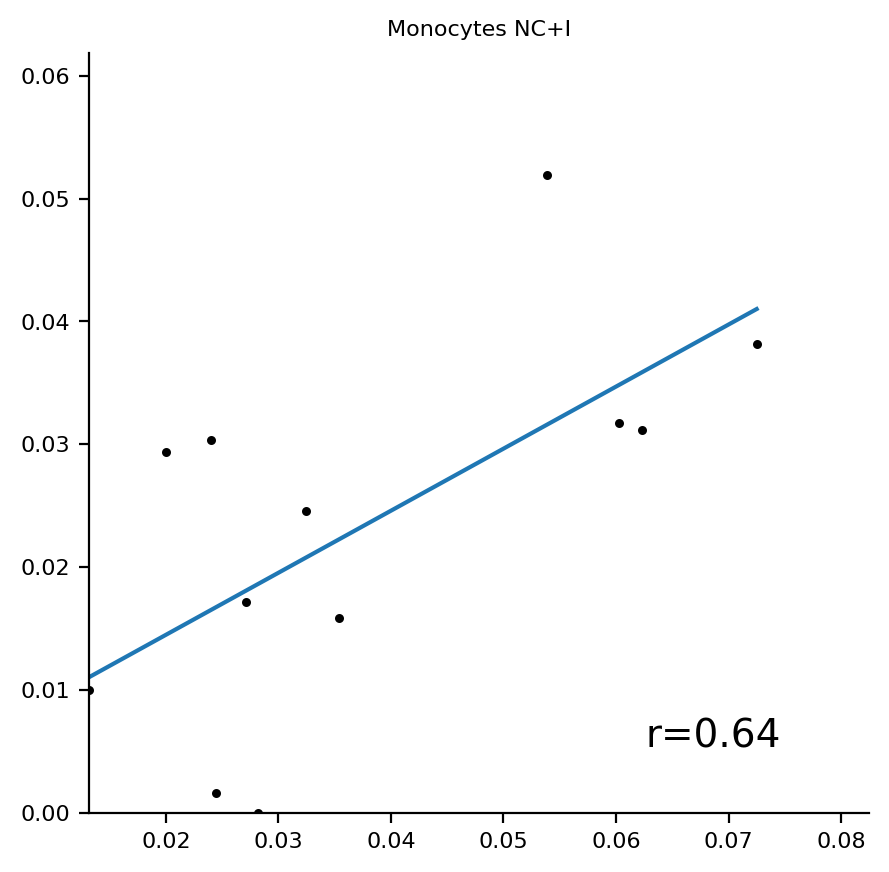

In [131]:
r_hv, p_hv = t_test(norm_fractions, proportions_NuSVR,figdir,'HV') 
#proportions_NuSVR_ciber[c]

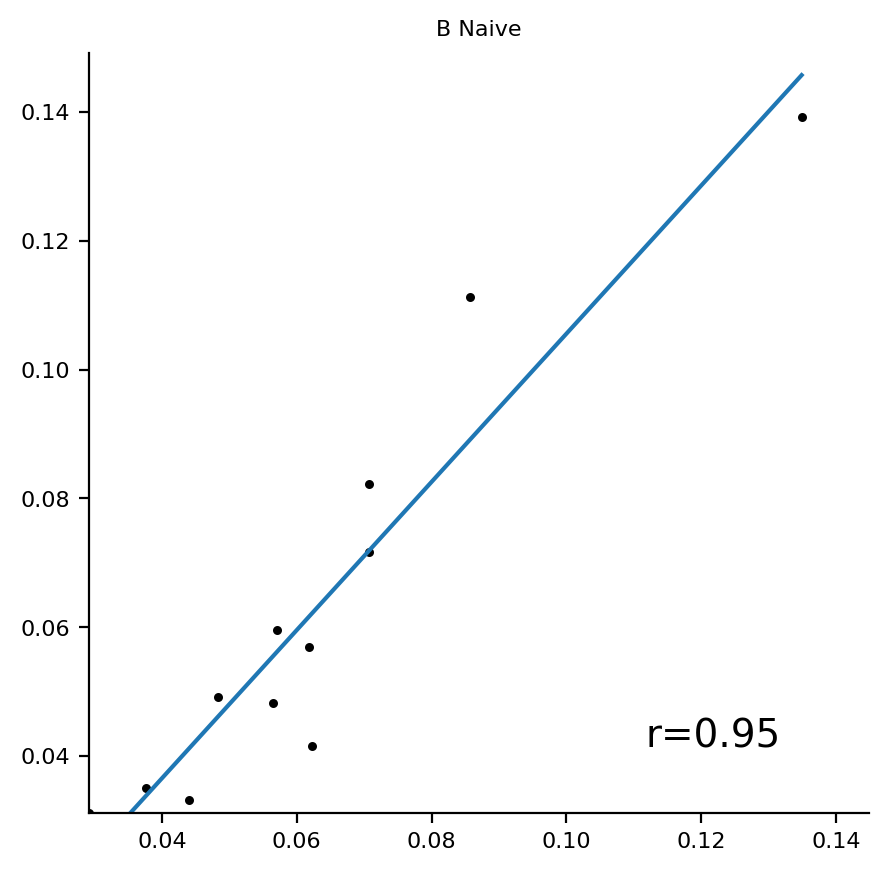

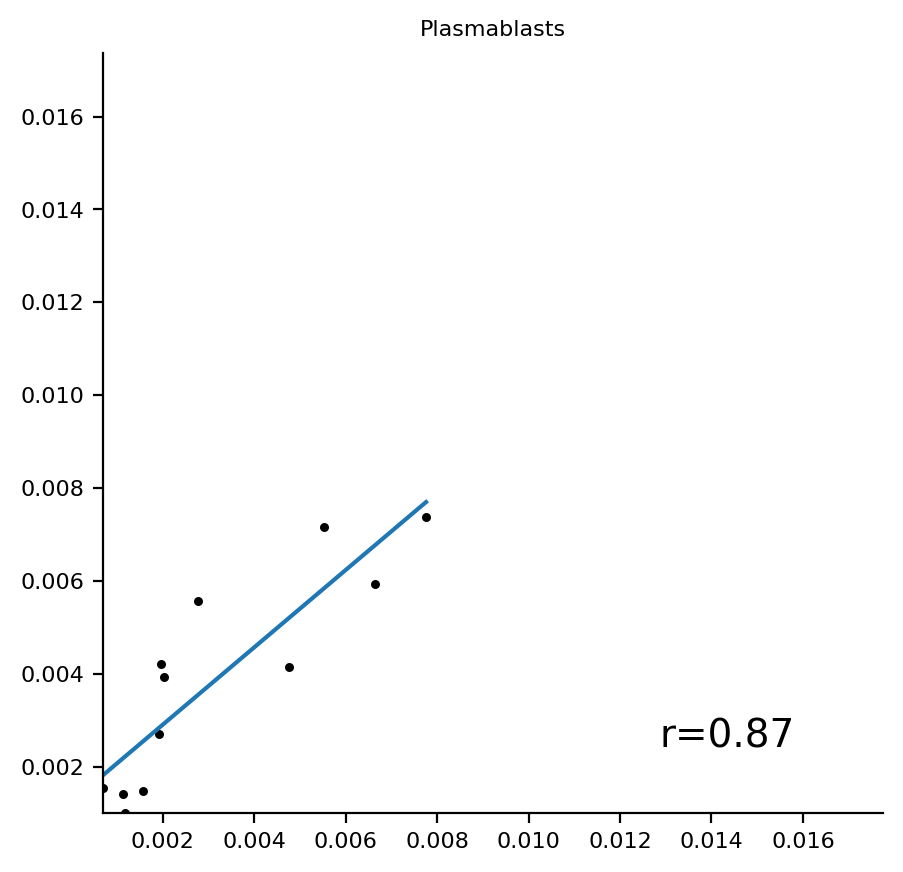

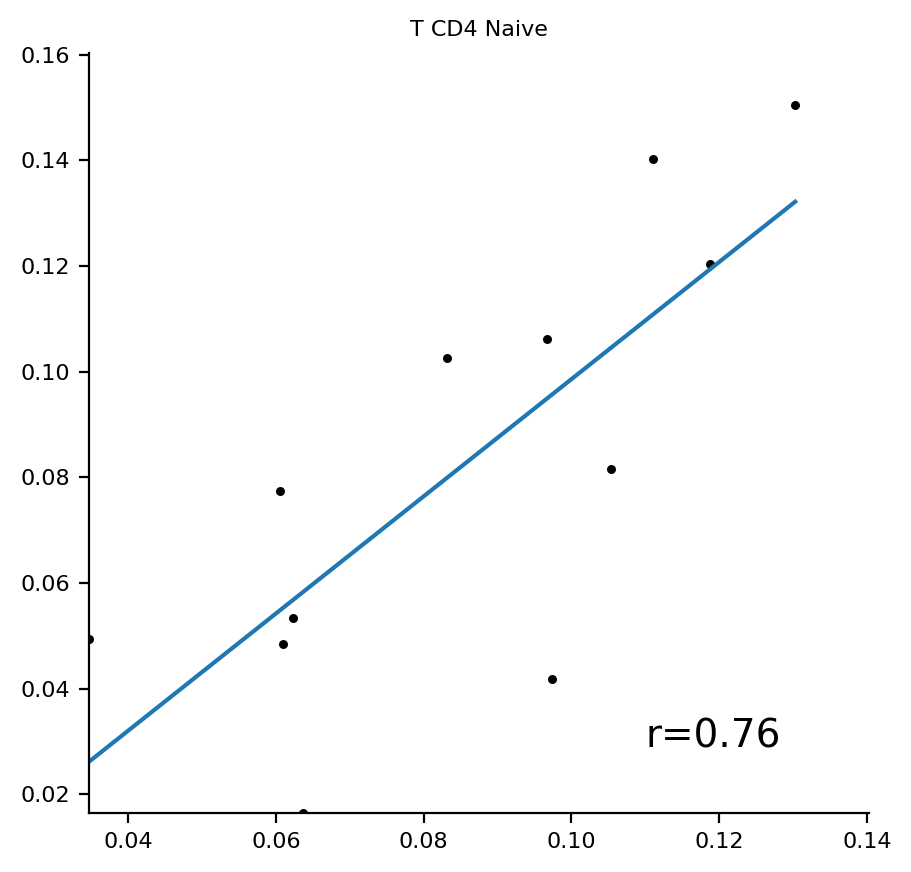

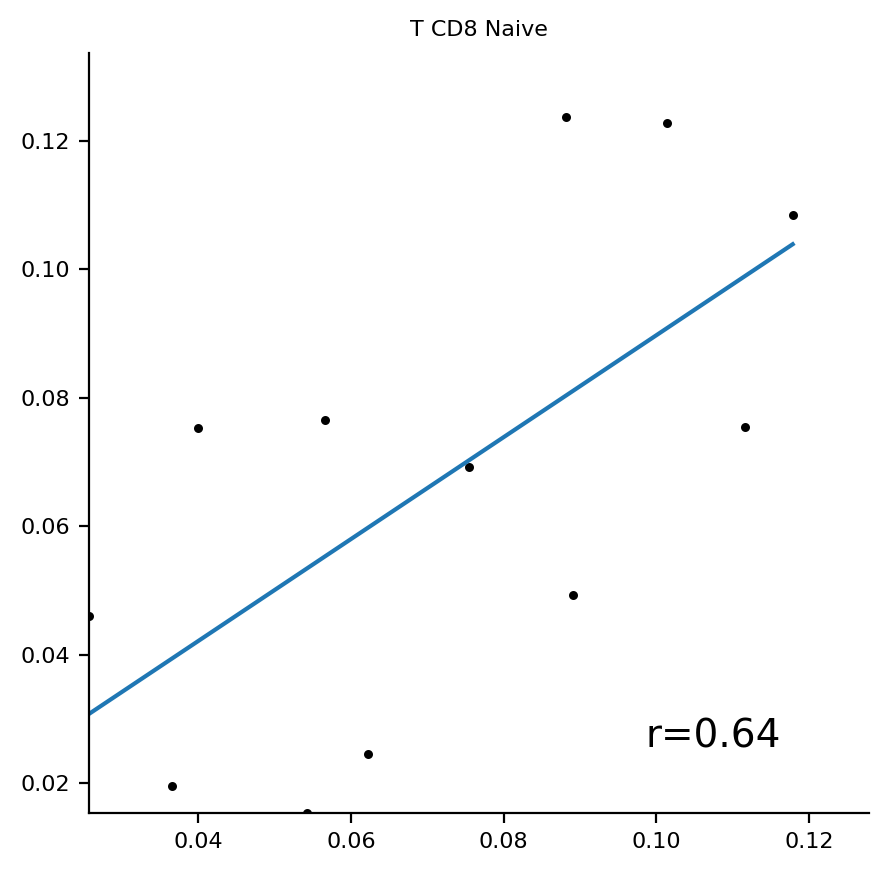

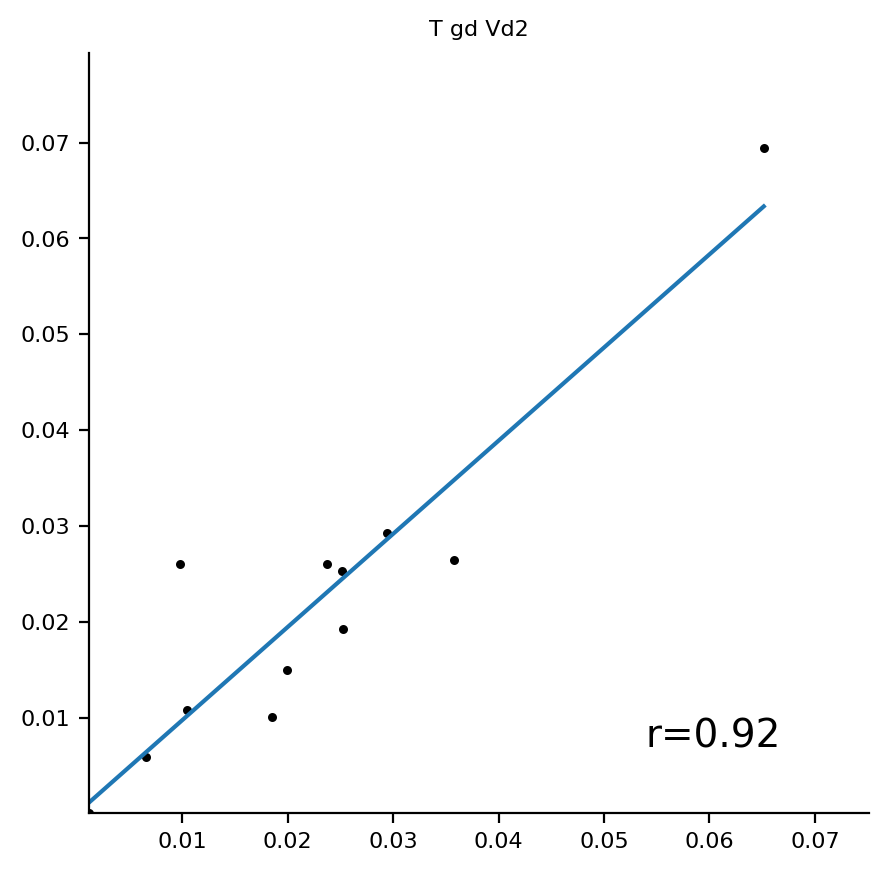

...

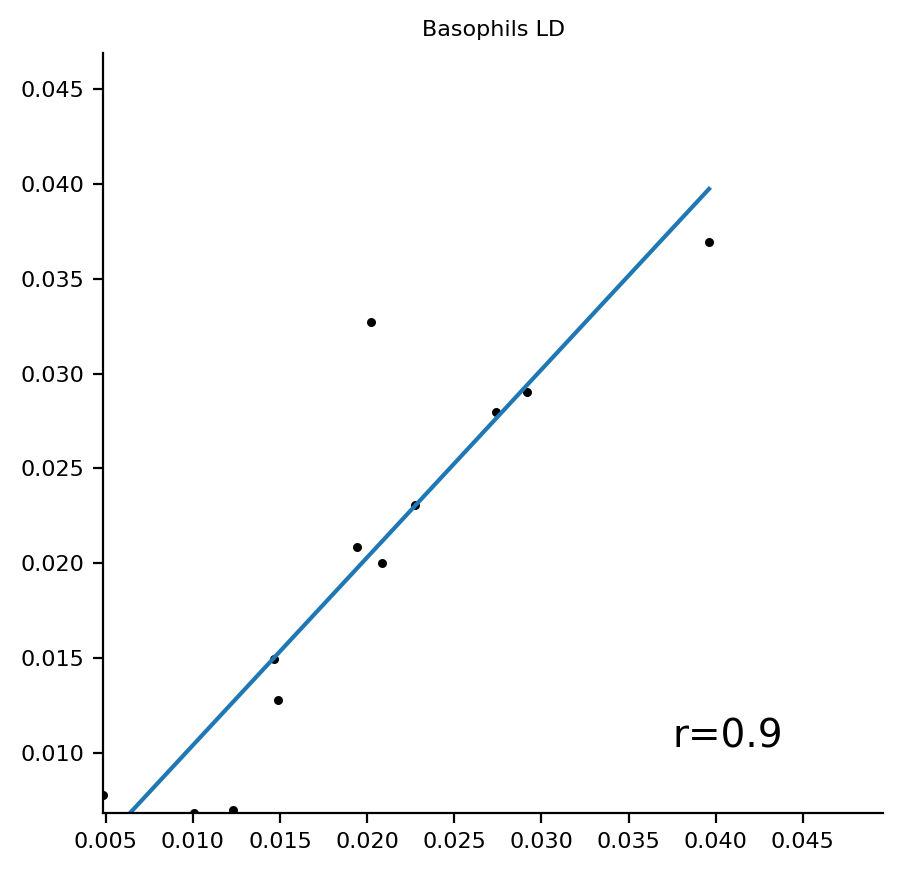

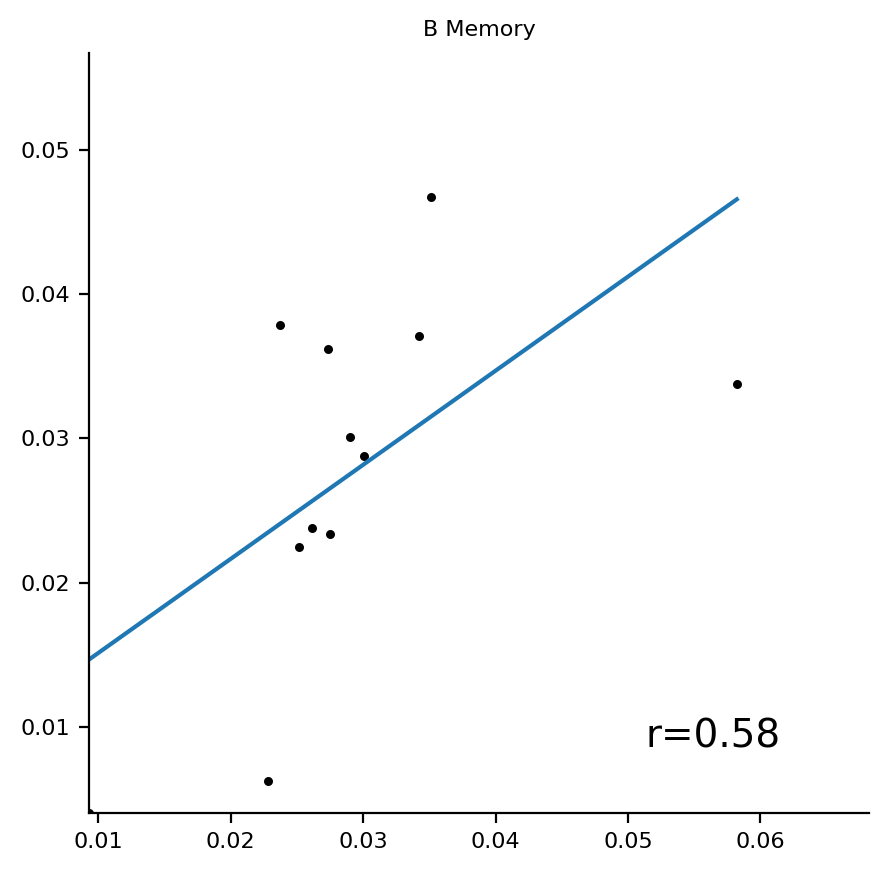

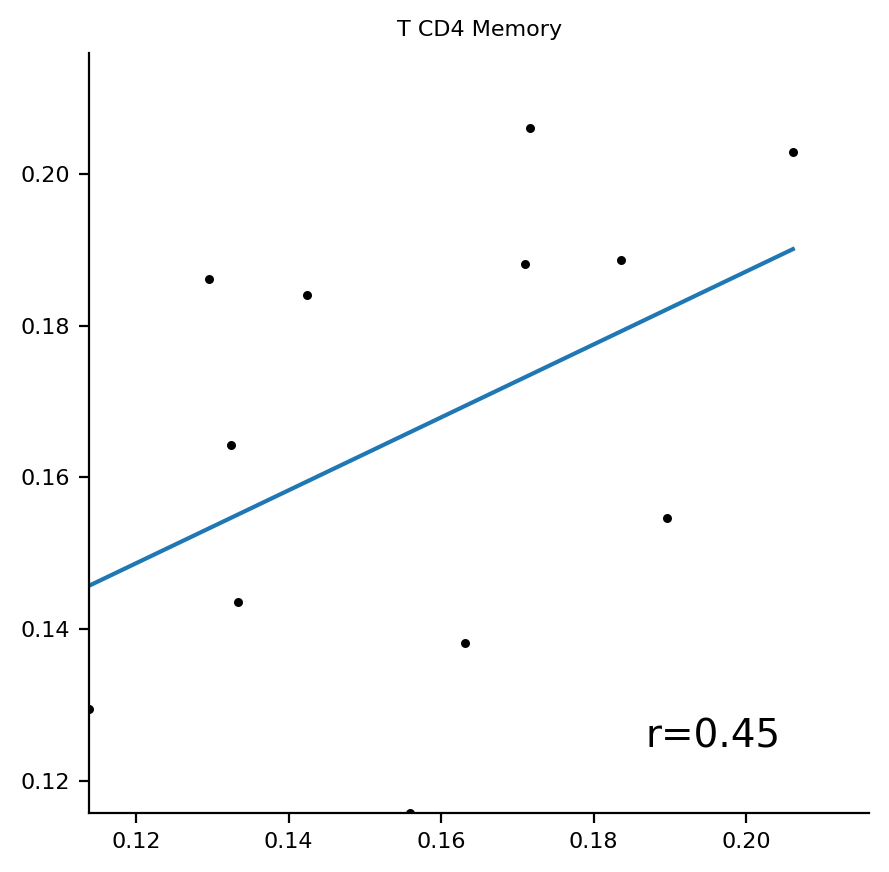

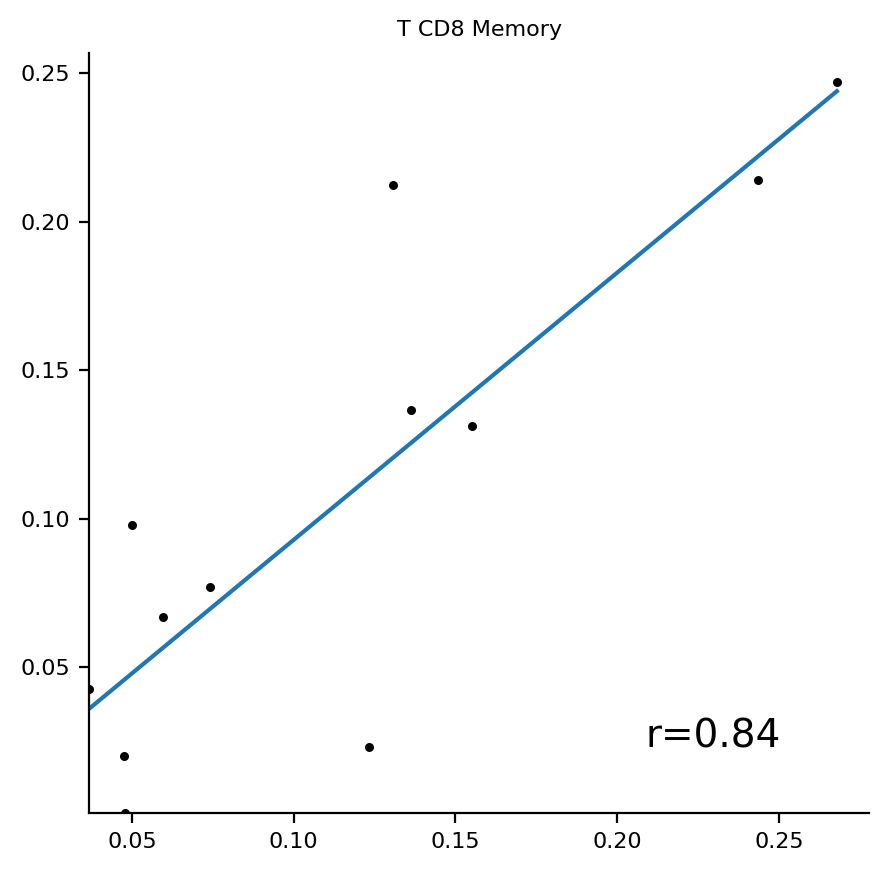

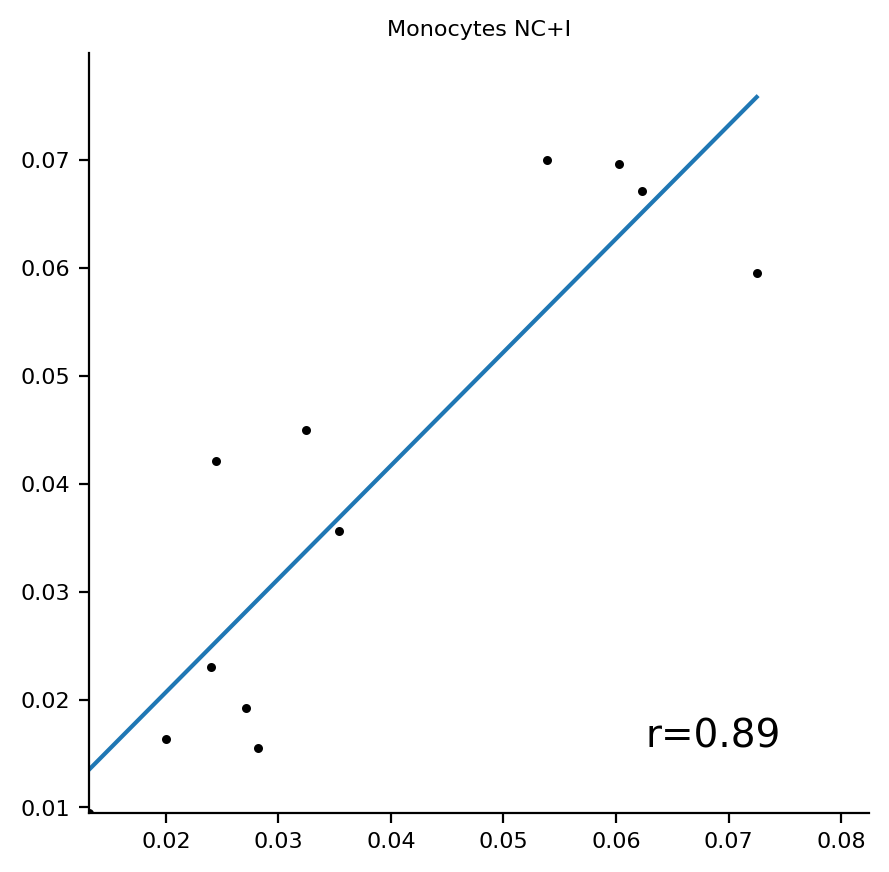

In [132]:
r_sig, p_sig = t_test(norm_fractions, proportions_NuSVR_sig,figdir,'Shiny') 
#proportions_NuSVR_ciber[c]

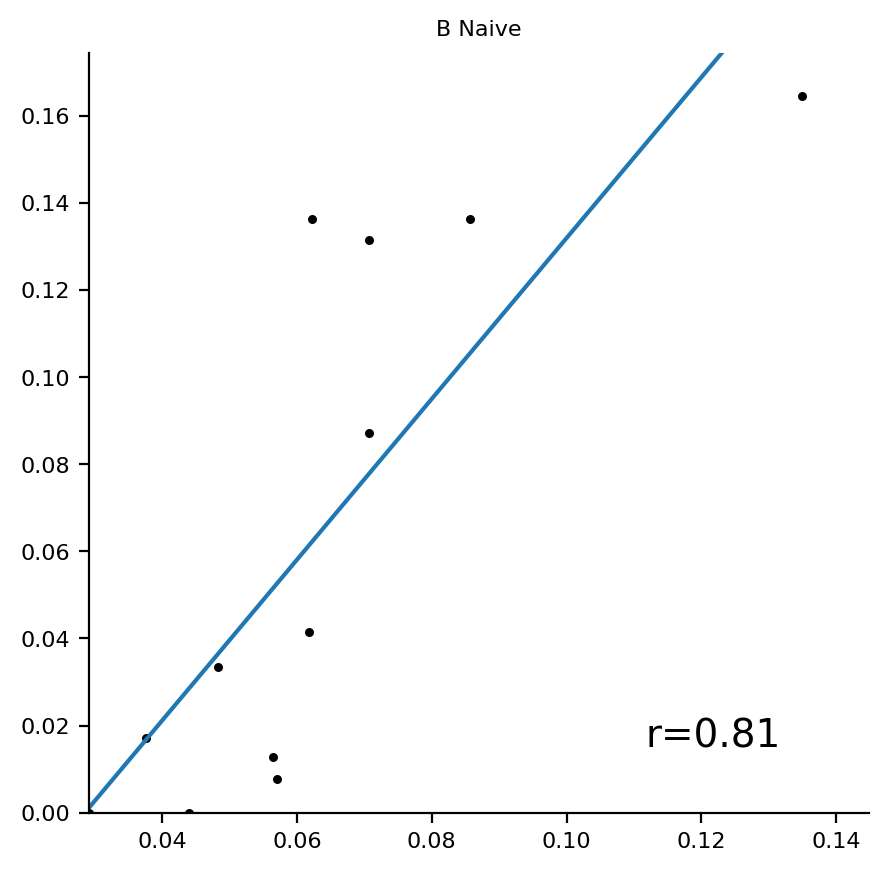

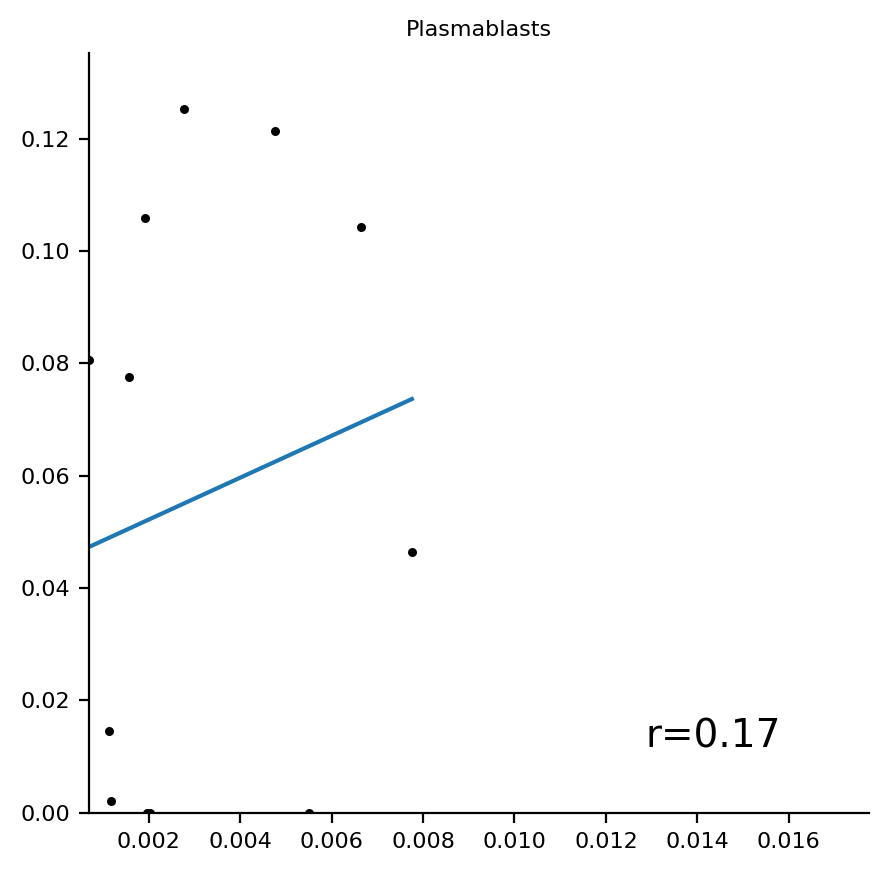

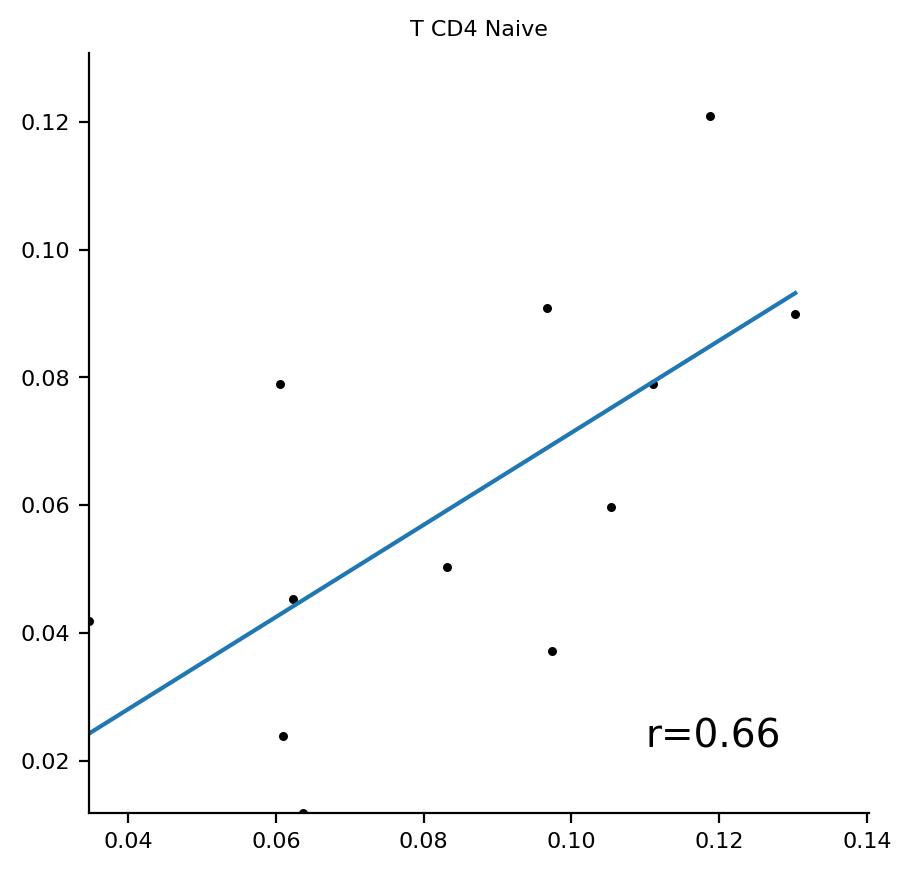

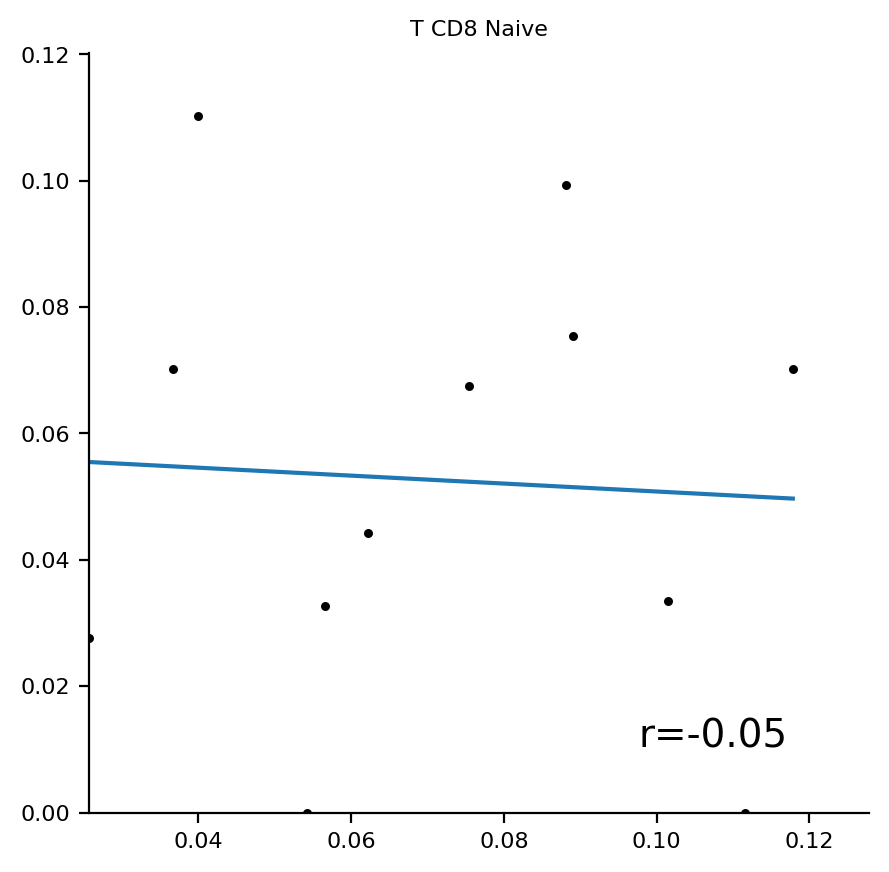

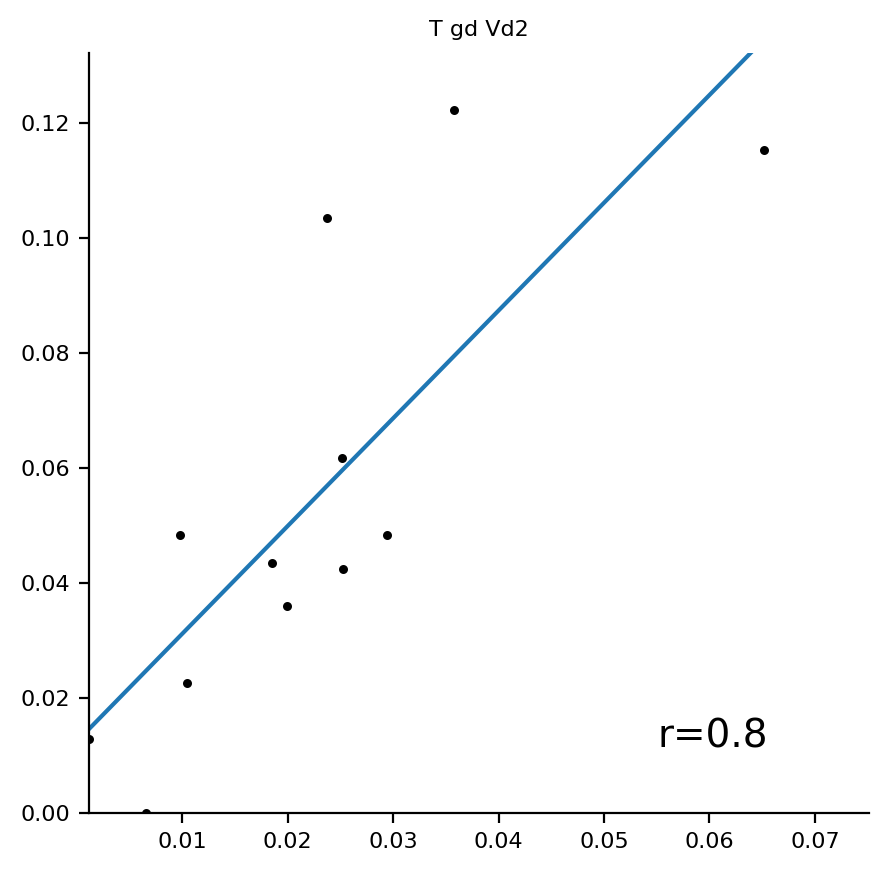

...

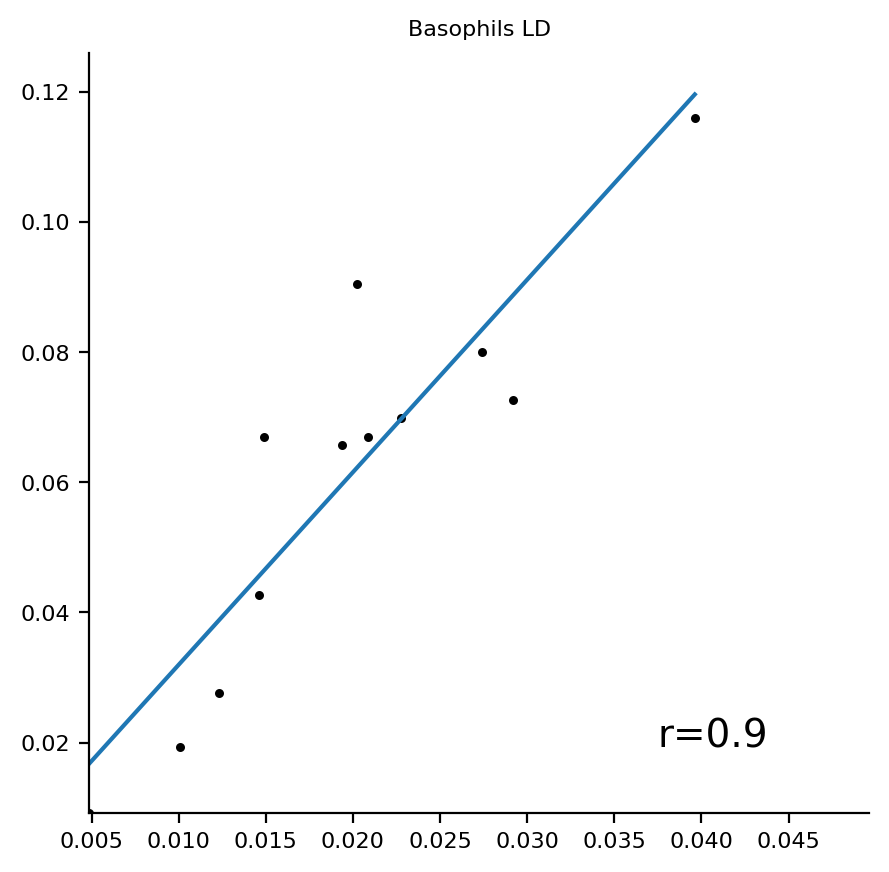

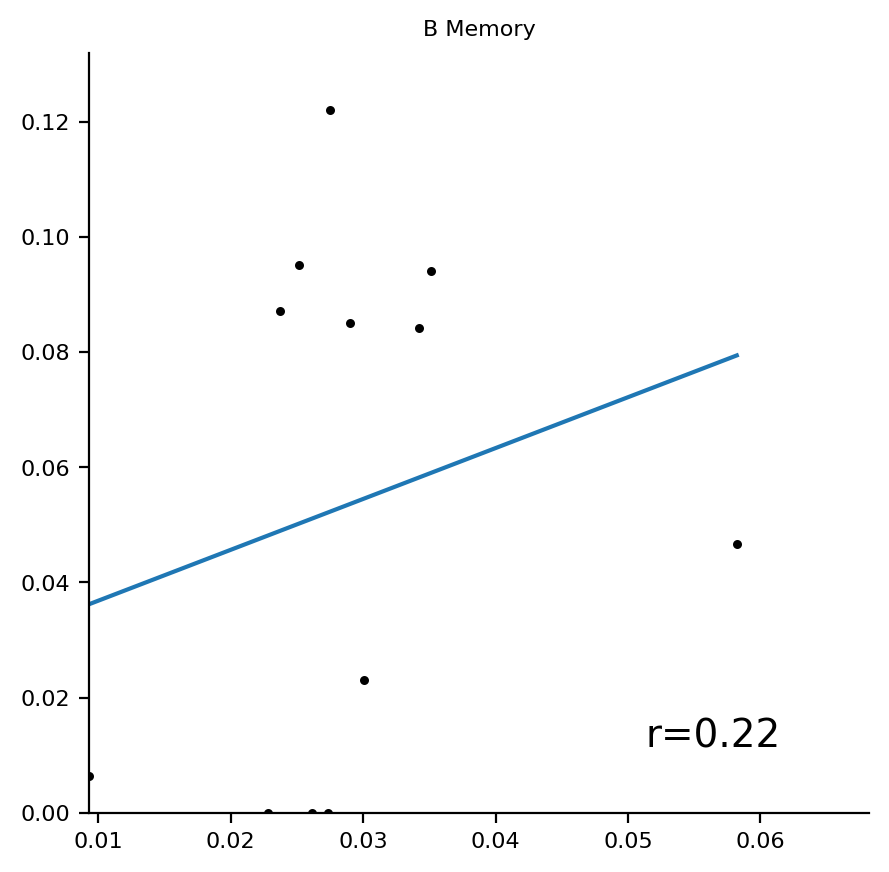

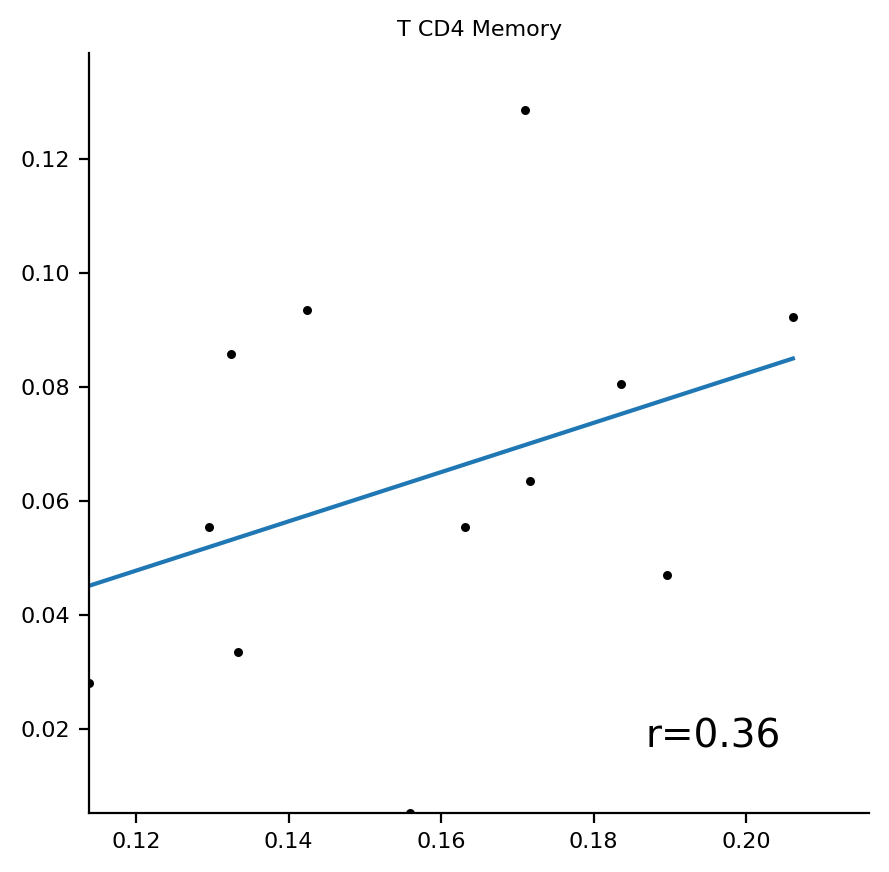

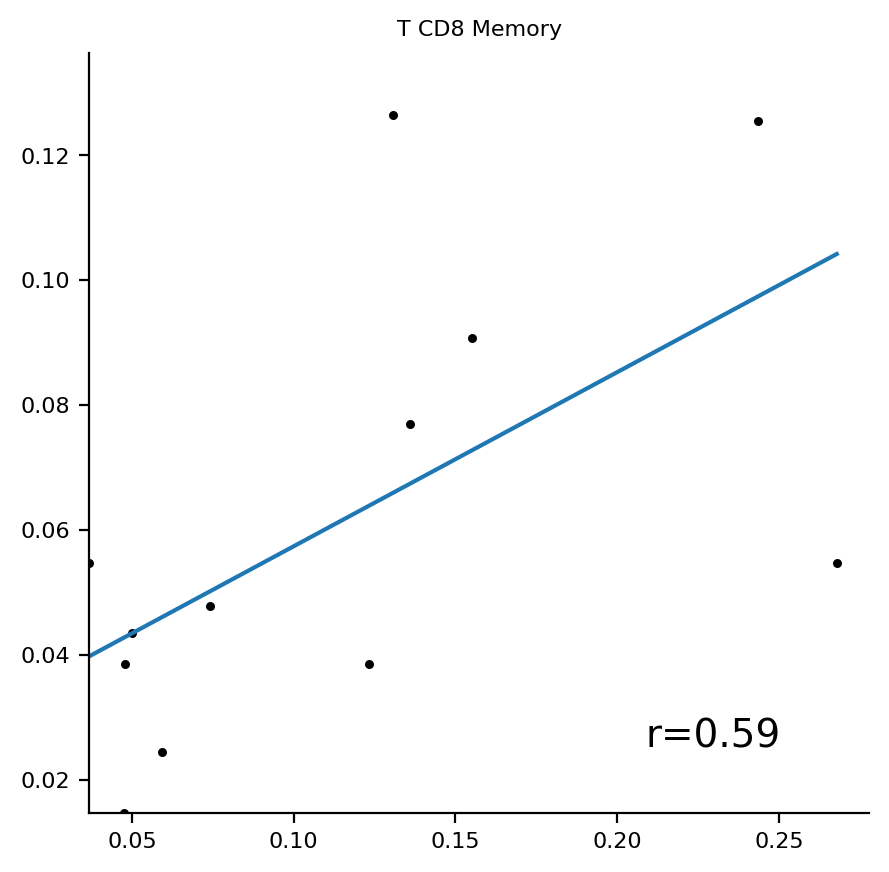

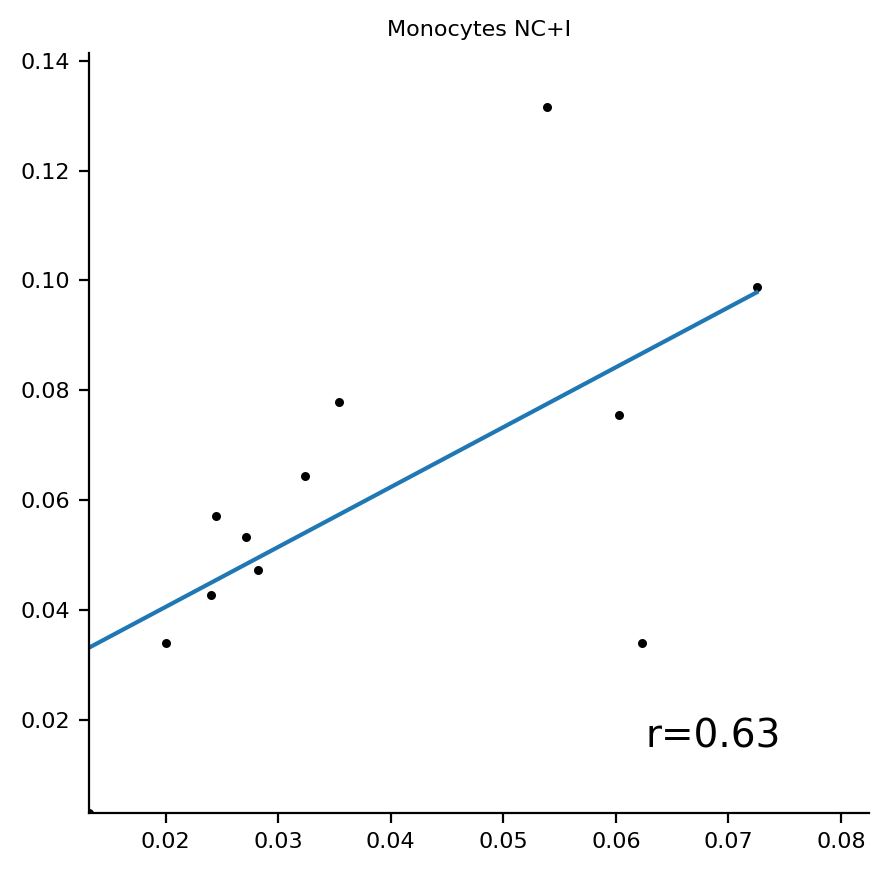

In [136]:
r_marker, p_marker = t_test(norm_fractions, proportions_NuSVR_marker,figdir,'markers') 
#proportions_NuSVR_ciber[c]

In [138]:
sc.set_figure_params(dpi=100, dpi_save=300, vector_friendly=True)
params = {'legend.fontsize': 8,
          'figure.figsize': (5, 5),
         'axes.labelsize':8,
         'axes.titlesize':8,
         'xtick.labelsize':8,
         'ytick.labelsize':8}
mpl.rcParams.update(params)

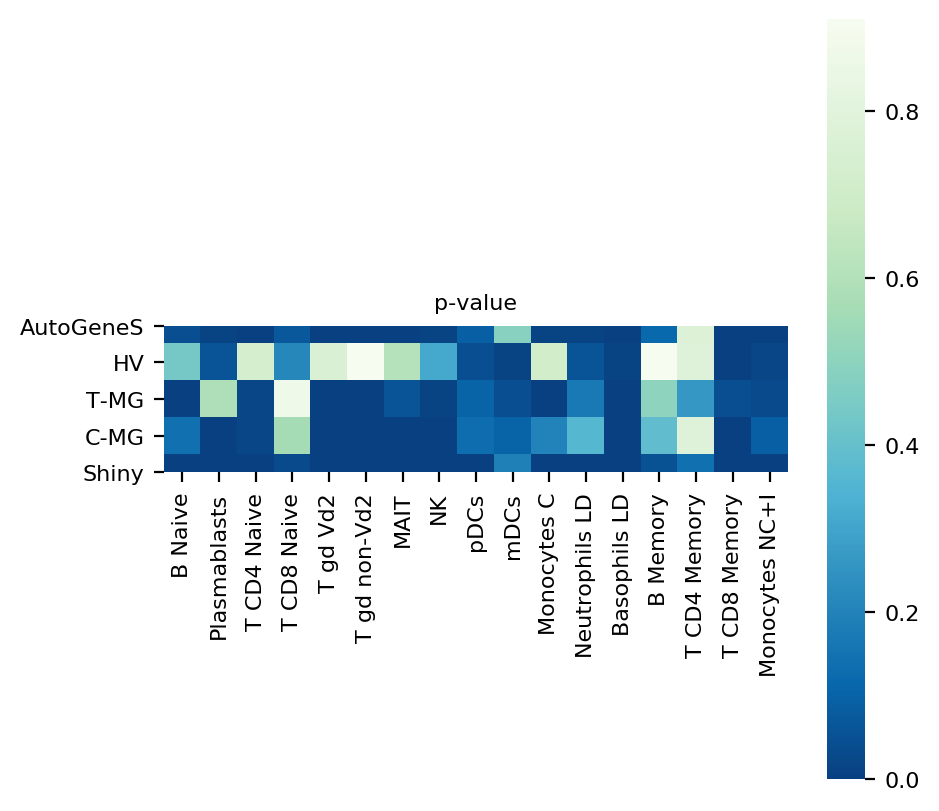

In [139]:
p_values = pd.DataFrame(data=[p_GA,p_hv,p_marker,p_ciber,p_sig],columns=proportions_NuSVR.columns,index=['AutoGeneS','HV','T-MG',"C-MG","Shiny"])
ax = plt.axes()
ax.set_title('p-value')
sns_plot = sns.heatmap(p_values,cmap = sns.color_palette("GnBu_r",1000),square=True)
sns_plot.figure.savefig(results_file+"p_values.png",dpi=300, bbox_inches='tight')

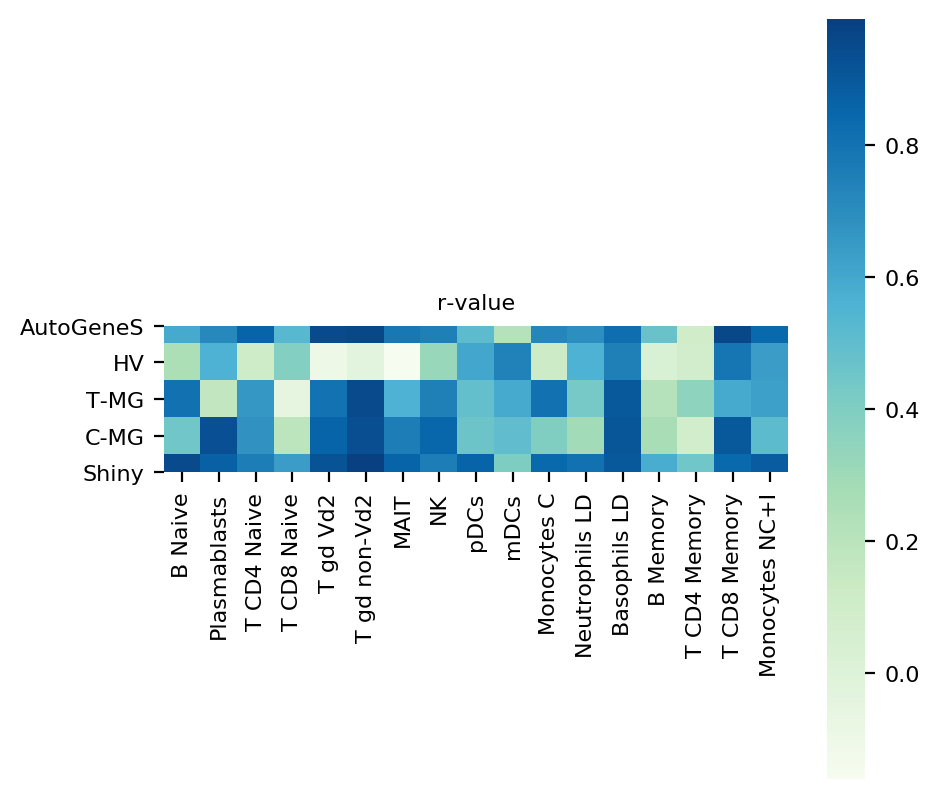

In [143]:
r_values = pd.DataFrame(data=[r_GA,r_hv,r_marker,r_ciber,r_sig],columns=proportions_NuSVR.columns,index=['AutoGeneS','HV','T-MG', "C-MG","Shiny"])
ax = plt.axes()
ax.set_title('r-value')
sns_plot = sns.heatmap(r_values,cmap = sns.color_palette("GnBu",1000),square=True)
sns_plot.figure.savefig(results_file+"r_values.png",dpi=300, bbox_inches='tight')

In [145]:
r_values.to_csv(results_file+'r_values.csv')
p_values.to_csv(results_file+'p_values.csv')

In [ ]:
from matplotlib_venn import venn2
venn_plot = venn3([set(sorted_bulks_GA.index), set(signatures_cell19.index), set(signatures_cibersort.index)],set_labels = ('AutoGeneS','Shiny','C_MG'))
plt.savefig(results_file+"venn.png",dpi=300)

In [87]:
sc.set_figure_params(dpi=100, dpi_save=300, vector_friendly=True)
params = {'legend.fontsize': 6,
          'figure.figsize': (5, 5),
         'axes.labelsize':6,
         'axes.titlesize':6,
         'xtick.labelsize':6,
         'ytick.labelsize':6}
mpl.rcParams.update(params)

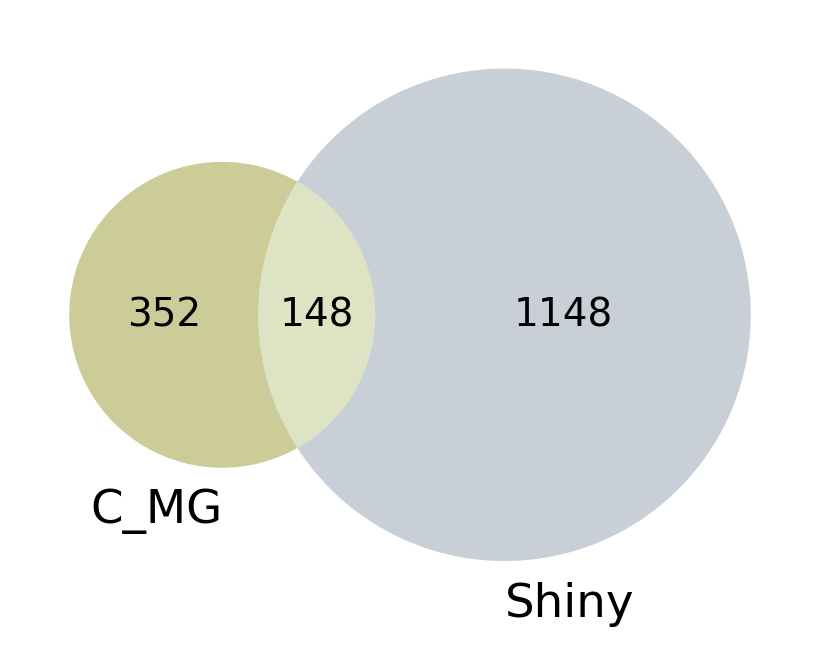

In [88]:
from matplotlib_venn import venn2
venn2([set(sorted_bulks_GA.index), set(signatures_cell19.index)],set_labels = ('C_MG','Shiny'),set_colors=('olive','lightslategray'))

In [93]:
#hv 2:8:23
import datetime
regr_NuSVR_test = NuSVR(nu=0.5,C=0.5,kernel='linear') 
print(datetime.datetime.now())
for column in samples_hv.columns:
    print(column)
    regr_NuSVR_test.fit(sorted_bulks_paper_hv, samples_hv.loc[:,column])
    break
datetime.datetime.now()

2020-01-06 19:31:05.549817
CYFZ_PBMC


datetime.datetime(2020, 1, 6, 21, 39, 28, 636454)

In [97]:
#shiny: 13:22
samples_GA = samples_proc.loc[sorted_bulks_GA.index,:]
samples_GA['index'] = samples_GA.index
samples_GA = samples_GA.drop_duplicates(subset='index', keep='first')
samples_GA = samples_GA.drop('index', axis=1).loc[samples_GA.index,:]


samples_sig = samples_proc.loc[signatures_cell19.index,:].dropna()
samples_sig['index'] = samples_sig.index
samples_sig = samples_sig.drop_duplicates(subset='index', keep='first')


regr_NuSVR_test = NuSVR(nu=0.5,C=0.5,kernel='linear') 
print(datetime.datetime.now())
for column in samples_GA.columns:
    print(column)
    regr_NuSVR_test.fit(signatures_cell19.loc[samples_sig.index,:], samples_sig.loc[:,column])
    break
datetime.datetime.now()

2020-01-07 09:58:08.365794
CYFZ_PBMC


datetime.datetime(2020, 1, 7, 10, 11, 30, 650672)

In [100]:
#C_MG
samples_cibersort = samples_proc.loc[signatures_cibersort.index,:]
samples_cibersort['index'] = samples_cibersort.index
samples_cibersort = samples_cibersort.drop_duplicates(subset='index', keep='first')
samples_cibersort = samples_cibersort.drop('index', axis=1).loc[signatures_cibersort.index,:]

signatures_cibersort = sorted_bulks_paper.loc[list(mgSet_kappa),:]

regr_NuSVR_test = NuSVR(nu=0.5,C=0.5,kernel='linear') 
print(datetime.datetime.now())
for column in samples_cibersort.columns:
    print(column)
    regr_NuSVR_test.fit(signatures_cibersort, samples_cibersort.loc[:,column])
    break
datetime.datetime.now()

2020-01-07 10:29:30.833915
CYFZ_PBMC


datetime.datetime(2020, 1, 7, 11, 49, 10, 530132)

In [100]:
#immunoStates
samples_immunoStates = samples_proc.loc[signatures_immunoStates.index,:]
samples_immunoStates['index'] = samples_immunoStates.index
samples_immunoStates = samples_immunoStates.drop_duplicates(subset='index', keep='first')
samples_immunoStates = samples_immunoStates.drop('index', axis=1).loc[signatures_immunoStates.index,:]

signatures_immunoStates = sorted_bulks_paper.loc[list(mgSet_kappa),:]

regr_NuSVR_test = NuSVR(nu=0.5,C=0.5,kernel='linear') 
print(datetime.datetime.now())
for column in samples_immunoStates.columns:
    print(column)
    regr_NuSVR_test.fit(signatures_immunoStates, samples_immunoStates.loc[:,column])
    break
datetime.datetime.now()

2020-01-07 10:29:30.833915
CYFZ_PBMC


datetime.datetime(2020, 1, 7, 11, 49, 10, 530132)

In [96]:
#MG: 16:30
regr_NuSVR_test = NuSVR(nu=0.5,C=0.5,kernel='linear') 
print(datetime.datetime.now())
for column in samples_markers.columns:
    print(column)
    regr_NuSVR.fit(signatures_markers, samples_markers.loc[:,column])
    break
datetime.datetime.now()

2020-01-07 09:41:37.835170
CYFZ_PBMC


datetime.datetime(2020, 1, 7, 9, 58, 8, 335311)

In [99]:
#AutoGeneS: 2:48
regr_NuSVR_test = NuSVR(nu=0.5,C=0.5,kernel='linear') 
print(datetime.datetime.now())
for column in samples_GA.columns:
    print(column)
    regr_NuSVR_test.fit(sorted_bulks_GA, samples_GA.loc[:,column])
    break
datetime.datetime.now()

2020-01-07 10:26:42.666829
CYFZ_PBMC


datetime.datetime(2020, 1, 7, 10, 29, 30, 130225)